<a href="https://colab.research.google.com/github/Yuanranzhu/SINN/blob/main/FPU_chain_SINN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!hostname

gnode014.cluster


In [2]:
!nvidia-smi

Sun Feb 25 15:29:30 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 545.23.08              Driver Version: 545.23.08    CUDA Version: 12.3     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA H100 PCIe               Off | 00000000:A8:00.0 Off |                    0 |
| N/A   49C    P0              77W / 350W |      4MiB / 81559MiB |      0%      Default |
|                                         |                      |             Disabled |
+-----------------------------------------+----------------------+--

In [3]:
import itertools as it
import pickle
import torch
import torch.nn as nn
import torch.optim as optim
import torch.fft
import torch.nn.functional as F
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import sdeint
from toolbox import (
    make_loss,
    StatLoss,
    SINN,
    FPU
)
import time

In [4]:
torch.cuda.is_available()

True

In [5]:
device = torch.device('cuda')

In [6]:
print(torch.__version__)
print(torch.version.cuda)

2.0.1+cu118
11.8


In [7]:
seed = 1234
torch.set_default_dtype(torch.float)
torch.manual_seed(seed)
torch.cuda.manual_seed_all(seed)
np.random.seed(seed)

In [8]:
%%time

######### Generating SINN training data by solving SDE
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats
from scipy.integrate import quad



###### Parameters 
mag=1              # Magnitude of the coupling
beta=1             # Inverse temperature 
alpha=1            
gamma=1            # Anharmonic potential U(x)=alpha/2* x^2  + gamma/4* x^4
N=100              # Total number of oscillators in the chain 
N_mid=int(N/2)     # Coordinate of the center CG-oscillator 
dt=0.01 
delta_t=0.5
batch = 400
sec_length = 400

Time = 5*delta_t*sec_length
print(Time)
length=int(Time/dt)+1
t = np.linspace(0,Time,length) # define time axis
gap=int(delta_t/dt)
t_store=t[0:-1:gap]



# (q49,q50)
q49_store = np.zeros([t_store.size+1,batch])    
q50_store = np.zeros([t_store.size+1,batch])

q=np.zeros((1,length)) 

p1=np.zeros((N,batch))
q1=np.zeros((N,batch))
p0=np.zeros((N,batch))
q0=np.zeros((N,batch))

# solve SDE

j=1
for i in range(1,length):
    q1=q0+dt*(p0-np.roll(p0,1,axis=0))
    p1=(1-mag*dt)*p0+dt*alpha*(np.roll(q0,-1,axis=0)-q0)+dt*gamma*(np.roll(q0,-1,axis=0)**3-q0**3)+np.sqrt(2*dt*gamma/beta)*np.random.randn(N,batch)
    if i % gap ==0:        
        q49_store[j,:]= np.sum(q1[0:N_mid-1,:], axis=0)
        q50_store[j,:]= np.sum(q1[0:N_mid,:], axis=0)
        j=j+1
    p0=p1
    q0=q1
                                
Toss=int(t_store.size/4)
q49_store=q49_store[Toss:-1,:] 
q50_store=q50_store[Toss:-1,:] 

1000.0
CPU times: user 9min 17s, sys: 20.5 ms, total: 9min 17s
Wall time: 9min 19s


Text(0.5, 1.0, 'Solution of the FPU chain dynamics $q_{49}$ and $q_{50}$')

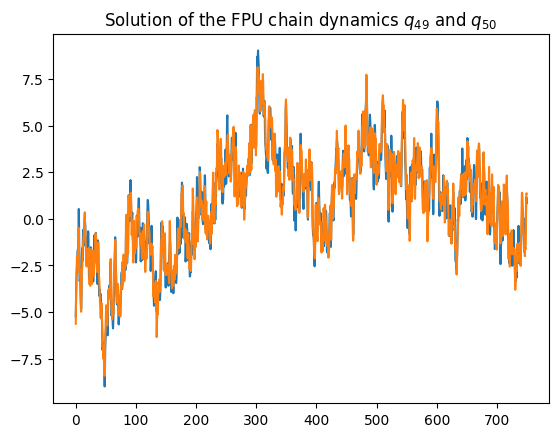

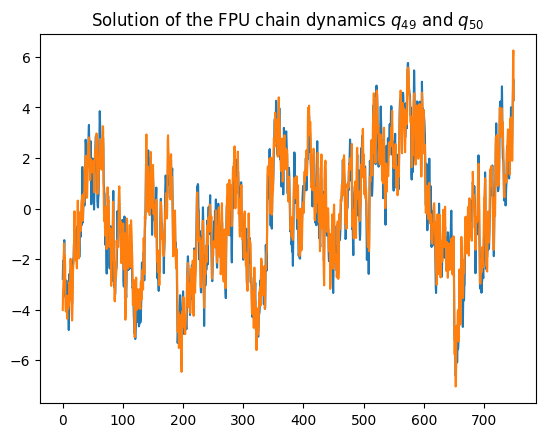

In [9]:
plt.figure(0)
plt.plot(t_store[Toss:]-t_store[Toss],q49_store[:,0])
plt.plot(t_store[Toss:]-t_store[Toss],q50_store[:,0])
plt.title(r"Solution of the FPU chain dynamics $q_{49}$ and $q_{50}$")

plt.figure(1)
plt.plot(t_store[Toss:]-t_store[Toss],q49_store[:,1])
plt.plot(t_store[Toss:]-t_store[Toss],q50_store[:,1])
plt.title(r"Solution of the FPU chain dynamics $q_{49}$ and $q_{50}$")

(400, 400) (400, 400) (400, 400)
(400, 400) (400, 400, 2)


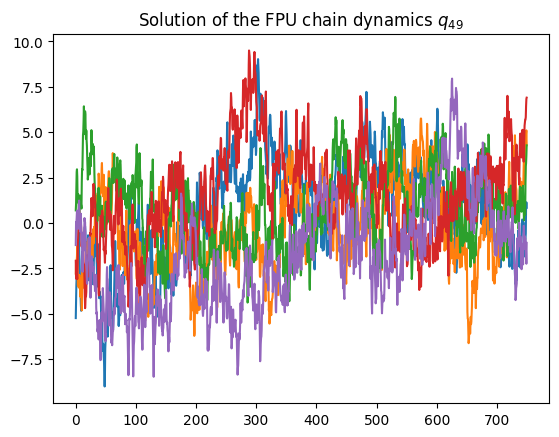

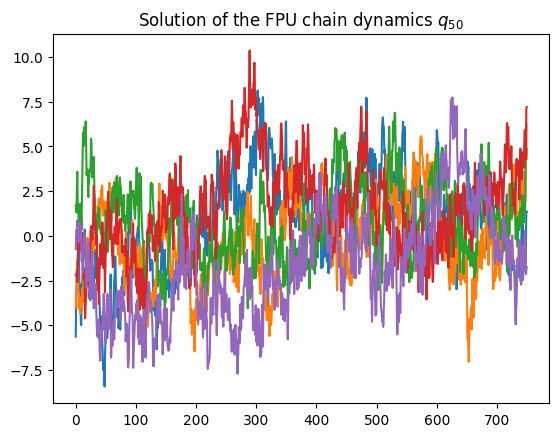

In [10]:
plt.figure(0)
for i in range(5):
    plt.plot(t_store[Toss:]-t_store[Toss],q49_store[:,i])
plt.title(r"Solution of the FPU chain dynamics $q_{49}$")

plt.figure(1)
for i in range(5):
    plt.plot(t_store[Toss:]-t_store[Toss],q50_store[:,i])
plt.title(r"Solution of the FPU chain dynamics $q_{50}$")

###########################################   Construct the sample traj for the LSTM learning 
ini=np.random.randn(sec_length,batch)
Traj49 = q49_store[0:sec_length,:]
Traj50 = q50_store[0:sec_length,:]
print(ini.shape, Traj49.shape, Traj50.shape)

Traj = np.empty((sec_length,batch,2))
Traj[:,:,0] = Traj49
Traj[:,:,1] = Traj50
T=np.arange(len(Traj[:,1]))*delta_t
x=np.linspace(-5,5,sec_length)
print(ini.shape, Traj.shape)

In [11]:
# Reformulating data into Torch tensors 
# Input of SINN should be of the form (seq_len, batch, input_size)

ini = np.random.randn(2*sec_length,2*batch).astype(np.float32) 
input = torch.from_numpy(ini.reshape(2*sec_length, batch, 2)).to(device)
batch_validation = batch
val_set = torch.normal(0.0, 1.0, (2*sec_length, batch_validation, 2), device=device)


Traj = Traj.astype(np.float32) 
target = torch.from_numpy(Traj.reshape(sec_length, batch, 2)).to(device)
print('The torch input size is', input.size(), input.dtype)
print('The torch validation size is', val_set.size(), val_set.dtype)
print('The torch target size is', target.size(), target.dtype)

The torch input size is torch.Size([800, 400, 2]) torch.float32
The torch validation size is torch.Size([800, 400, 2]) torch.float32
The torch target size is torch.Size([400, 400, 2]) torch.float32


In [12]:
# Defining Loss functions
LAGS = 400
N = 400
loss_acf_fft = make_loss('acf[fft]', target, lags=LAGS, device=device)
loss_acf_sec_moment = make_loss('acf[fft]', target**2, lags=LAGS, device=device)
loss_acf_bruteforce = make_loss('acf[bruteforce]', target, lags=LAGS, device=device)
loss_acf_randbrute = make_loss('acf[randombrute]', target, lags=LAGS, sample_lags=20, device=device)

loss_ccf_fft = make_loss('ccf[fft]', target, lags=LAGS, device=device)
loss_ccf_sec_moment = make_loss('ccf[fft]', target**2, lags=LAGS, device=device)
loss_ccf_bruteforce = make_loss('ccf[bruteforce]', target, lags=LAGS, device=device)
loss_ccf_randbrute = make_loss('ccf[randombrute]', target, lags=LAGS, sample_lags=20, device=device)

loss_pdf_empirical1 = make_loss('pdf', target, lower=-5, upper=5, n=N, bw=None, device=device)
loss_pdf_empirical2 = make_loss('pdf6', target, lower=-5, upper=5, n=N, bw=None, device=device)
loss_pdf_empirical2D = make_loss('pdf2D', target, lower=-5, upper=5, n=N, bw=None, device=device)

torch.Size([400, 2])


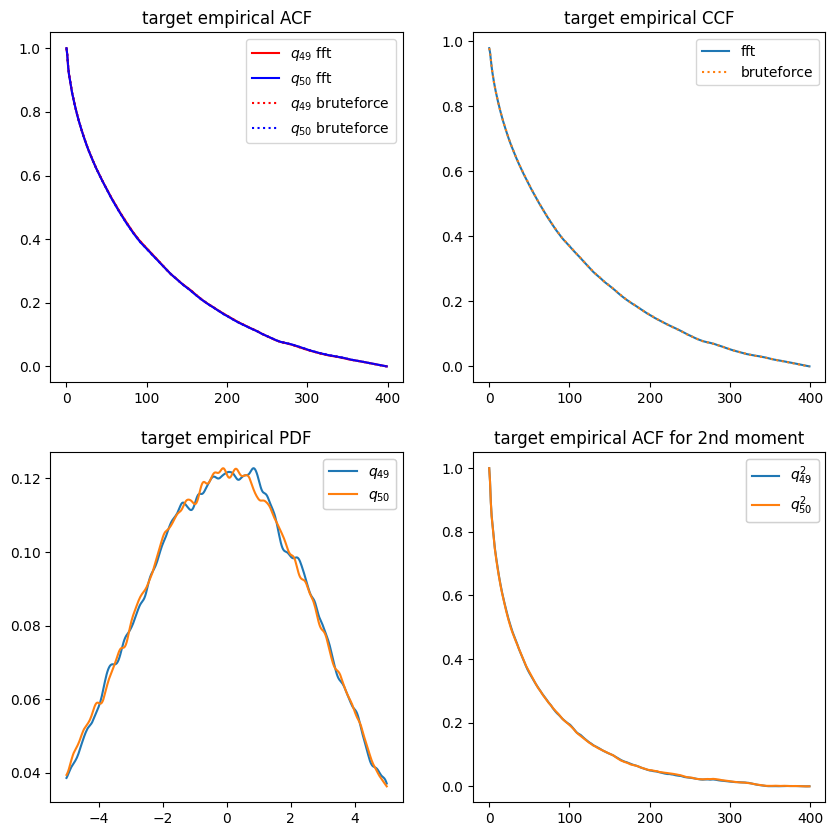

In [13]:
# Plotting target ACFs and PDF
fig, axs = plt.subplots(2, 2, figsize=(10, 10))
axs[0,0].plot(loss_acf_fft._target.cpu()[...,0],'r', label=r'$q_{49}$ fft')
axs[0,0].plot(loss_acf_fft._target.cpu()[...,1],'b', label=r'$q_{50}$ fft')
axs[0,0].plot(loss_acf_bruteforce._target.cpu()[...,0],'r:', label= r'$q_{49}$ bruteforce')
axs[0,0].plot(loss_acf_bruteforce._target.cpu()[...,1], 'b:', label=r'$q_{50}$ bruteforce')
axs[0,0].legend()
axs[0,0].set_title('target empirical ACF')

axs[0,1].plot(loss_ccf_fft._target.cpu()[...,1:3], label='fft')
axs[0,1].plot(loss_ccf_bruteforce._target.cpu()[...,1:3],':',label='bruteforce')
# legend2 = axs[0,1].legend(iter(bf), ('q bf', 'p bf'), loc=1)
# axs[0,1].add_artist(legend2)
axs[0,1].legend()
axs[0,1].set_title('target empirical CCF')

x_grid=-np.linspace(-5,5,num=sec_length)
pdf = axs[1,0].plot(x_grid,loss_pdf_empirical1._target.cpu())
legend3 = axs[1,0].legend(iter(pdf), (r'$q_{49}$',r'$q_{50}$'), loc=1)
axs[1,0].add_artist(legend3)
axs[1,0].set_title('target empirical PDF')


print(loss_acf_sec_moment._target.cpu().size())
sec_moment = axs[1,1].plot(loss_acf_sec_moment._target.cpu())
legend4 = axs[1,1].legend(iter(sec_moment), (r'$q_{49}^2$',r'$q_{50}^2$'),loc=1)
axs[1,1].set_title('target empirical ACF for 2nd moment')
axs[1,1].add_artist(legend4)

plt.show()

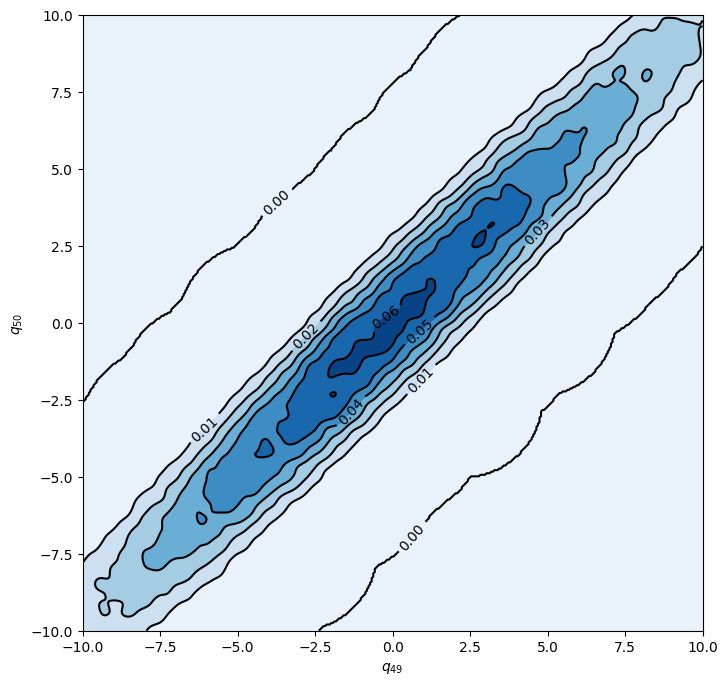

In [14]:
xmin, xmax = -10, 10
ymin, ymax = -10, 10

xx, yy = np.mgrid[xmin:xmax:400j, ymin:ymax:400j]
fig = plt.figure(figsize=(8, 8))
ax = fig.gca()
ax.set_xlim(xmin, xmax)
ax.set_ylim(ymin, ymax)

# Contourf plot
cfset = ax.contourf(xx, yy, loss_pdf_empirical2D._target.cpu(), cmap='Blues')
## Or kernel density estimate plot instead of the contourf plot

# Contour plot
cset = ax.contour(xx, yy, loss_pdf_empirical2D._target.cpu(), colors='k')
# Label plot
ax.clabel(cset, inline=1, fontsize=10)
ax.set_xlabel(r'$q_{49}$')
ax.set_ylabel(r'$q_{50}$')

plt.show()

Text(0.5, 1.0, 'target empirical PDF')

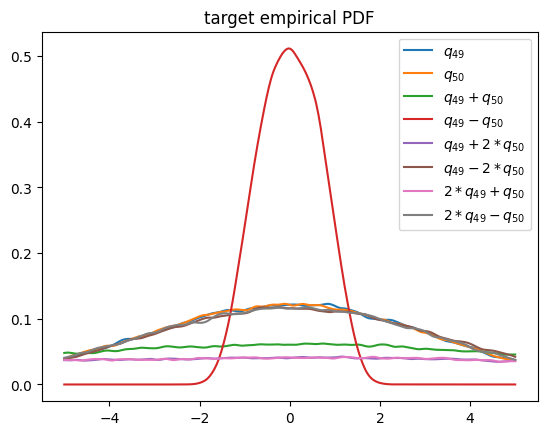

In [15]:
x_grid=-np.linspace(-5,5,num=sec_length)
# x_grid=-np.linspace(-5,5,num=sec_length)
plt.plot(x_grid, loss_pdf_empirical1._target.cpu()[...,0],label=r'$q_{49}$')
plt.plot(x_grid, loss_pdf_empirical1._target.cpu()[...,1],label=r'$q_{50}$')
plt.plot(x_grid, loss_pdf_empirical2._target.cpu()[...,0],label=r'$q_{49}+q_{50}$')
plt.plot(x_grid, loss_pdf_empirical2._target.cpu()[...,1],label=r'$q_{49}-q_{50}$')
plt.plot(x_grid, loss_pdf_empirical2._target.cpu()[...,2],label=r'$q_{49}+2*q_{50}$')
plt.plot(x_grid, loss_pdf_empirical2._target.cpu()[...,3],label=r'$q_{49}-2*q_{50}$')
plt.plot(x_grid, loss_pdf_empirical2._target.cpu()[...,4],label=r'$2*q_{49}+q_{50}$')
plt.plot(x_grid, loss_pdf_empirical2._target.cpu()[...,5],label=r'$2*q_{49}-q_{50}$')
plt.legend()
plt.title('target empirical PDF')

In [16]:
class Model:
    def __init__(self, net):

        self.x_acf_s = None
        self.x_ccf_s = None
        self.x_pdf_s = None
        self.x_pdf2_s = None
        self.x_acf2_s = None
        self.s_collect = []

        self.net = net

        self.T_error=[]
        self.V_error=[]
        self.T_ccf=[]
        self.V_ccf=[]
        self.T_pdf=[]
        self.V_pdf=[]
        self.T_pdf2=[]
        self.V_pdf2=[]
        self.T_acf=[]
        self.V_acf=[]
        self.T_acf2=[]
        self.V_acf2=[]
        self.Step=[]
        self.iter = 0
        self.time = 0

    def train_U(self, x):
        return self.net(x)

    def predict_U(self, x):
        return self.train_U(x)

    def likelihood_loss(self, loss_acf, loss_ccf, loss_pdf, loss_pdf2, loss_acf2):
        loss = torch.reciprocal(2. * self.x_acf_s ** 2) * loss_acf.detach()      \
               + torch.reciprocal(2. * self.x_ccf_s ** 2) * loss_ccf.detach()    \
               + torch.reciprocal(2. * self.x_pdf_s ** 2) * loss_pdf.detach()    \
               + torch.reciprocal(2. * self.x_pdf2_s ** 2) * loss_pdf2.detach()  \
               + torch.reciprocal(2. * self.x_acf2_s ** 2) * loss_acf2.detach()  \
               + torch.log(self.x_acf_s * self.x_ccf_s * self.x_pdf_s * self.x_pdf2_s * self.x_acf2_s)
        return loss

    def true_loss(self, loss_acf, loss_ccf, loss_pdf, loss_pdf2, loss_acf2):
        return torch.reciprocal(2. * self.x_acf_s.detach() ** 2) * loss_acf + torch.reciprocal(2. * self.x_ccf_s.detach() ** 2) * loss_ccf + torch.reciprocal(2. * self.x_pdf_s.detach() ** 2) * loss_pdf + torch.reciprocal(2. * self.x_pdf2_s.detach() ** 2) * loss_pdf2 + torch.reciprocal(2. * self.x_acf2_s.detach() ** 2) * loss_acf2


    def run_baseline(self):
        optimizer_adam = optim.Adam(self.net.parameters(), lr=1e-3)
        for step in range(20000):
            optimizer_adam.zero_grad()
            ini = np.random.randn(2*sec_length, batch*self.net.lstm.input_size).astype(np.float32) 
            input = torch.from_numpy(ini.reshape(2*sec_length, batch, self.net.lstm.input_size)).to(device)
            prediction, _ = self.train_U(input)
            prediction = prediction[-LAGS:,:,:]
            loss = self.true_loss(loss_acf_fft(prediction), loss_ccf_fft(prediction),loss_pdf_empirical1(prediction),loss_pdf_empirical2(prediction),loss_acf_sec_moment(prediction**2))
            loss.backward()
            optimizer_adam.step()
            self.iter += 1
            if step % 50 == 0: 
                with torch.no_grad():
                    loss = loss_acf_fft(prediction)+loss_ccf_fft(prediction)+loss_pdf_empirical1(prediction)+loss_pdf_empirical2(prediction)+loss_acf_sec_moment(prediction**2)
                    pred_val, _ = self.predict_U(val_set)
                    pred_val = pred_val[-LAGS:,:,:]
                    loss_val = loss_acf_bruteforce(pred_val)+loss_ccf_bruteforce(pred_val)+ loss_pdf_empirical1(pred_val)+ loss_pdf_empirical2(pred_val) + loss_acf_sec_moment(pred_val**2)
                    acf = loss_acf_bruteforce(pred_val)
                    ccf = loss_ccf_bruteforce(pred_val)
                    pdf = loss_pdf_empirical1(pred_val)
                    pdf2 = loss_pdf_empirical2(pred_val)
                    acf_sec_moment = loss_acf_sec_moment(pred_val**2)
                    print('[%d]-th step loss: %.4f, %.4f, acf: %.5f, ccf: %.5f, pdf: %.5f, pdf2: %.5f, acf2: %.5f' % (step, loss, loss_val, acf, ccf, pdf, pdf2, acf_sec_moment))
                    self.T_acf.append(loss_acf_fft(prediction).detach().cpu().numpy())
                    self.V_acf.append(loss_acf_bruteforce(pred_val).detach().cpu().numpy())
                    self.T_ccf.append(loss_ccf_fft(prediction).detach().cpu().numpy())
                    self.V_ccf.append(loss_ccf_bruteforce(pred_val).detach().cpu().numpy())
                    self.T_pdf.append(loss_pdf_empirical1(prediction).detach().cpu().numpy())
                    self.V_pdf.append(loss_pdf_empirical1(pred_val).detach().cpu().numpy())
                    self.T_pdf2.append(loss_pdf_empirical2(prediction).detach().cpu().numpy())
                    self.V_pdf2.append(loss_pdf_empirical2(pred_val).detach().cpu().numpy())
                    self.T_acf2.append(loss_acf_sec_moment(prediction**2).detach().cpu().numpy())
                    self.V_acf2.append(loss_acf_sec_moment(pred_val**2).detach().cpu().numpy())
                    self.T_error.append(loss.detach().cpu().numpy())
                    self.V_error.append(loss_val.detach().cpu().numpy())
                    self.Step.append(step)
            if loss <=0.0005 and loss_val <=0.0005:
                break

        if loss > 0.0005 or loss_val > 0.0005:
            print ('Training failed')
        print('Training finished')



    def run_AW(self):
        self.x_acf_s = nn.Parameter(self.x_acf_s, requires_grad=True)
        self.x_ccf_s = nn.Parameter(self.x_ccf_s, requires_grad=True)
        self.x_pdf_s = nn.Parameter(self.x_pdf_s, requires_grad=True)
        self.x_pdf2_s = nn.Parameter(self.x_pdf2_s, requires_grad=True)
        self.x_acf2_s = nn.Parameter(self.x_acf2_s, requires_grad=True)


        optimizer_adam = optim.Adam(self.net.parameters(), lr=1e-3)
        optimizer_adam_weight = optim.Adam([self.x_acf_s] + [self.x_ccf_s] + [self.x_pdf_s] + [self.x_pdf2_s] + [self.x_acf2_s],
                                                     lr=1e-3)

        for step in range(20000):
            self.s_collect.append([self.iter, self.x_acf_s.item(), self.x_ccf_s.item(), self.x_pdf_s.item(), self.x_pdf2_s.item(), self.x_acf2_s.item()])

            optimizer_adam.zero_grad()
            ini = np.random.randn(2*sec_length, batch*self.net.lstm.input_size).astype(np.float32) 
            input = torch.from_numpy(ini.reshape(2*sec_length, batch, self.net.lstm.input_size)).to(device)
            prediction, _ = self.train_U(input)
            prediction = prediction[-LAGS:,:,:]
            loss = self.true_loss(loss_acf_fft(prediction), loss_ccf_fft(prediction),loss_pdf_empirical1(prediction),loss_pdf_empirical2(prediction),loss_acf_sec_moment(prediction**2))
            loss.backward()
            optimizer_adam.step()
            self.iter += 1
            if step % 50 == 0: 
                with torch.no_grad():
                    loss = loss_acf_fft(prediction)+loss_ccf_fft(prediction)+loss_pdf_empirical1(prediction)+loss_pdf_empirical2(prediction)+loss_acf_sec_moment(prediction**2)
                    pred_val, _ = self.predict_U(val_set)
                    pred_val = pred_val[-LAGS:,:,:]
                    loss_val = loss_acf_bruteforce(pred_val)+loss_ccf_bruteforce(pred_val)+ loss_pdf_empirical1(pred_val) + loss_pdf_empirical2(pred_val) + loss_acf_sec_moment(pred_val**2)
                    acf = loss_acf_bruteforce(pred_val)
                    ccf = loss_ccf_bruteforce(pred_val)
                    pdf = loss_pdf_empirical1(pred_val)
                    pdf2 = loss_pdf_empirical2(pred_val)
                    acf_sec_moment = loss_acf_sec_moment(pred_val**2)
                    print('[%d]-th step loss: %.4f, %.4f, acf: %.5f, ccf: %.5f, pdf: %.5f, pdf2: %.5f, acf2: %.5f' % (step, loss, loss_val, acf, ccf, pdf, pdf2, acf_sec_moment))
                    self.T_acf.append(loss_acf_fft(prediction).detach().cpu().numpy())
                    self.V_acf.append(loss_acf_bruteforce(pred_val).detach().cpu().numpy())
                    self.T_ccf.append(loss_ccf_fft(prediction).detach().cpu().numpy())
                    self.V_ccf.append(loss_ccf_bruteforce(pred_val).detach().cpu().numpy())
                    self.T_pdf.append(loss_pdf_empirical1(prediction).detach().cpu().numpy())
                    self.V_pdf.append(loss_pdf_empirical1(pred_val).detach().cpu().numpy())
                    self.T_pdf2.append(loss_pdf_empirical2(prediction).detach().cpu().numpy())
                    self.V_pdf2.append(loss_pdf_empirical2(pred_val).detach().cpu().numpy())
                    self.T_acf2.append(loss_acf_sec_moment(prediction**2).detach().cpu().numpy())
                    self.V_acf2.append(loss_acf_sec_moment(pred_val**2).detach().cpu().numpy())
                    self.T_error.append(loss.detach().cpu().numpy())
                    self.V_error.append(loss_val.detach().cpu().numpy())
                    self.Step.append(step)
            if loss <=0.0005 and loss_val <=0.0005:
                break
            optimizer_adam_weight.zero_grad()
            loss = self.likelihood_loss(loss_acf_fft(prediction), loss_ccf_fft(prediction),loss_pdf_empirical1(prediction),loss_pdf_empirical2(prediction),loss_acf_sec_moment(prediction**2))
            loss.backward()
            optimizer_adam_weight.step()
            
        if loss > 0.0005 or loss_val > 0.0005:
            print ('Training failed')
        print('Training finished')


    def train(self):
        self.x_acf_s = torch.tensor(2.).float()
        self.x_ccf_s = torch.tensor(2.).float()
        self.x_pdf_s = torch.tensor(.2).float()
        self.x_pdf2_s = torch.tensor(.2).float()
        self.x_acf2_s = torch.tensor(.2).float()
        start_time = time.time()
        if model_type == 0:
            self.run_baseline()
        elif model_type == 1:
            self.run_AW()
        elapsed = time.time() - start_time
        self.time = elapsed
        print('Training time: %.2f' % elapsed)
        avg_time = elapsed/self.iter
        print('Training time per iteration: %.2f' % avg_time)
        print('Number of Iterations:%d' %self.iter)

In [17]:
### Defining SINN model
net = SINN(2, 100, 4, 2).to(device) # input dimension, hidden size, number of layers, output dimension

In [18]:
model = Model(net=net)

In [19]:
model_type = 1

In [20]:
model.train()

[0]-th step loss: 0.8317, 0.8167, acf: 0.09598, ccf: 0.09726, pdf: 0.29325, pdf2: 0.28994, acf2: 0.04022
[50]-th step loss: 0.1252, 0.1021, acf: 0.03386, ccf: 0.03657, pdf: 0.00977, pdf2: 0.00748, acf2: 0.01442
[100]-th step loss: 0.2837, 0.3071, acf: 0.01356, ccf: 0.27925, pdf: 0.00866, pdf2: 0.00437, acf2: 0.00125
[150]-th step loss: 0.3664, 0.3703, acf: 0.01488, ccf: 0.33397, pdf: 0.01357, pdf2: 0.00694, acf2: 0.00097
[200]-th step loss: 0.3506, 0.3734, acf: 0.00865, ccf: 0.34805, pdf: 0.00896, pdf2: 0.00692, acf2: 0.00083
[250]-th step loss: 0.3437, 0.3600, acf: 0.01289, ccf: 0.32452, pdf: 0.01301, pdf2: 0.00927, acf2: 0.00036
[300]-th step loss: 0.3648, 0.3579, acf: 0.01625, ccf: 0.32371, pdf: 0.01166, pdf2: 0.00587, acf2: 0.00039
[350]-th step loss: 0.3589, 0.3501, acf: 0.01443, ccf: 0.31632, pdf: 0.01047, pdf2: 0.00851, acf2: 0.00034
[400]-th step loss: 0.3531, 0.3601, acf: 0.01100, ccf: 0.33552, pdf: 0.00605, pdf2: 0.00706, acf2: 0.00045
[450]-th step loss: 0.3646, 0.3564, acf:

[3850]-th step loss: 0.3802, 0.3819, acf: 0.00102, ccf: 0.36741, pdf: 0.00448, pdf2: 0.00787, acf2: 0.00117
[3900]-th step loss: 0.3229, 0.3387, acf: 0.00175, ccf: 0.32796, pdf: 0.00193, pdf2: 0.00495, acf2: 0.00213
[3950]-th step loss: 0.2828, 0.2996, acf: 0.00099, ccf: 0.29102, pdf: 0.00161, pdf2: 0.00559, acf2: 0.00039
[4000]-th step loss: 0.2560, 0.2649, acf: 0.00017, ccf: 0.25905, pdf: 0.00115, pdf2: 0.00431, acf2: 0.00026
[4050]-th step loss: 0.2269, 0.2406, acf: 0.00011, ccf: 0.23535, pdf: 0.00116, pdf2: 0.00376, acf2: 0.00022
[4100]-th step loss: 0.1092, 0.1027, acf: 0.00019, ccf: 0.08610, pdf: 0.00534, pdf2: 0.00859, acf2: 0.00250
[4150]-th step loss: 0.2770, 0.2614, acf: 0.00026, ccf: 0.25670, pdf: 0.00057, pdf2: 0.00355, acf2: 0.00028
[4200]-th step loss: 0.2208, 0.2271, acf: 0.00018, ccf: 0.22339, pdf: 0.00056, pdf2: 0.00280, acf2: 0.00017
[4250]-th step loss: 0.0288, 0.0228, acf: 0.00007, ccf: 0.01943, pdf: 0.00156, pdf2: 0.00132, acf2: 0.00045
[4300]-th step loss: 0.0707,

In [21]:
def draw_loss(model):
    ### Plotting the training and the generalization error
    fig = plt.figure(1)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title("Error plot",fontsize=15) 
    plt.yscale('log')
    plt.plot(model.Step, model.T_error,'r',label='Training error')
    plt.plot(model.Step, model.V_error,'b--',label='Validation error')
#     plt.loglog(model.Step, model.T_error,'r',label='Training error')
#     plt.loglog(model.Step, model.V_error,'b--',label='Validation error')
    plt.xlabel(r'Training times $n$',fontsize=15)
    plt.ylabel(r'$l_1+l_2$',fontsize=15)
    plt.legend(frameon=False,fontsize=15)

In [22]:
def draw_errors(model):
    ### Plotting the training and the generalization error
    fig = plt.figure(1)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title("Error plot for loss functions w/o coeff",fontsize=15)
    plt.yscale('log')
    plt.plot(model.Step, model.T_error,'k',label='Training error')
    plt.plot(model.Step, model.V_error,'k--')
    plt.plot(model.Step, model.T_acf,'r',label='acf error')
    plt.plot(model.Step, model.V_acf,'r--')
    plt.plot(model.Step, model.T_ccf,'b',label='ccf error')
    plt.plot(model.Step, model.V_ccf,'b--')
    plt.plot(model.Step, model.T_pdf,'y',label='pdf error')
    plt.plot(model.Step, model.V_pdf,'y--')
    plt.plot(model.Step, model.T_pdf2,'m',label='pdf2 error')
    plt.plot(model.Step, model.V_pdf2,'m--')
    plt.plot(model.Step, model.T_acf2,'g',label='acf2 error')
    plt.plot(model.Step, model.V_acf2,'g--')
    plt.xlabel(r'Training times $n$',fontsize=15)
    plt.ylabel(r'$l_1+l_2$',fontsize=15)
    plt.legend(frameon=False,fontsize=15, bbox_to_anchor=(1.1, 1.05))

In [23]:
def draw_adaptive_w(model):
    s_collect = np.array(model.s_collect)
    np.savetxt('s_RAM-AW.npy', s_collect)
#     plt.yscale('log')
    plt.plot(s_collect[:, 0], s_collect[:, 1], 'r-', label=r'$\epsilon_{acf}$')
    plt.plot(s_collect[:, 0], s_collect[:, 2], 'b-', label='$\epsilon_{ccf}$')
    plt.plot(s_collect[:, 0], s_collect[:, 3], 'y-', label='$\epsilon_{pdf}$')
    plt.plot(s_collect[:, 0], s_collect[:, 4], 'm-', label='$\epsilon_{pdf2}$')
    plt.plot(s_collect[:, 0], s_collect[:, 5], 'g-', label='$\epsilon_{acf2}$')
    plt.xlabel('$Iters$')
    plt.ylabel('$s$')
#     plt.xscale('log')
    plt.legend()
#     plt.savefig('2dpossion_S_RAM-AW.pdf')
    plt.show()

In [24]:
def draw_epoch_w(model):
    s_collect = np.array(model.s_collect)
    np.savetxt('s_RAM-AW.npy', s_collect)
    plt.yscale('log')
    plt.plot(s_collect[:, 0], np.reciprocal(2. * s_collect[:, 1]**2), 'r-', label=r'$\frac{1}{2\epsilon_{acf}^2}$')
    plt.plot(s_collect[:, 0], np.reciprocal(2. * s_collect[:, 2]**2), 'b-', label=r'$\frac{1}{2\epsilon_{ccf}^2}$')
    plt.plot(s_collect[:, 0], np.reciprocal(2. * s_collect[:, 3]**2), 'y-', label=r'$\frac{1}{2\epsilon_{pdf}^2}$')
    plt.plot(s_collect[:, 0], np.reciprocal(2. * s_collect[:, 4]**2), 'm-', label=r'$\frac{1}{2\epsilon_{pdf2}^2}$')
    plt.plot(s_collect[:, 0], np.reciprocal(2. * s_collect[:, 5]**2), 'g-', label=r'$\frac{1}{2\epsilon_{acf2}^2}$')
    plt.xlabel('$Iters$')
    plt.ylabel('$\omega$')
    plt.legend()
#     plt.savefig('2dpossion_S_RAM-AW.pdf')
    plt.show()

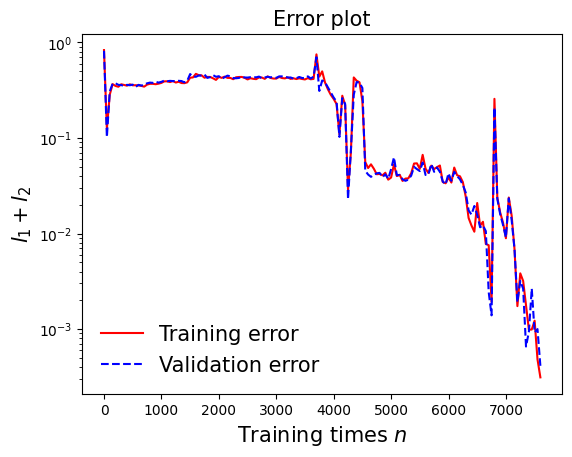

In [25]:
draw_loss(model)

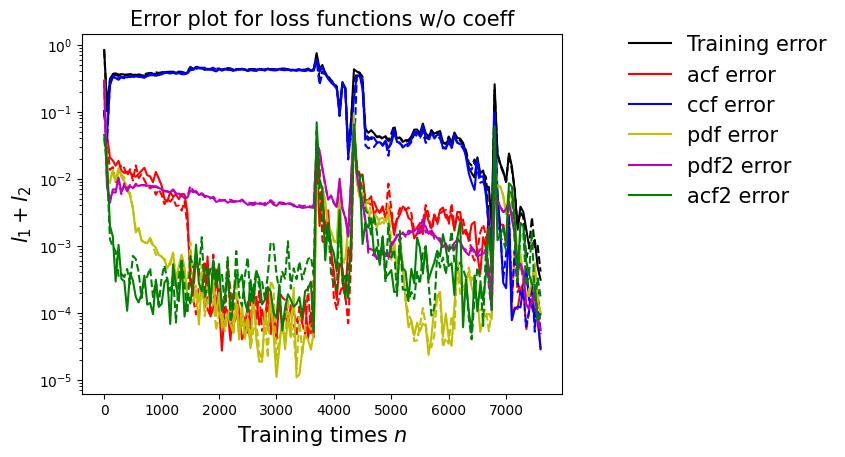

In [26]:
draw_errors(model)

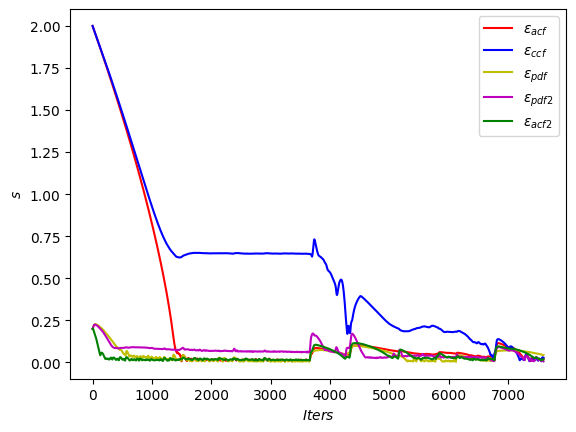

In [27]:
draw_adaptive_w(model)

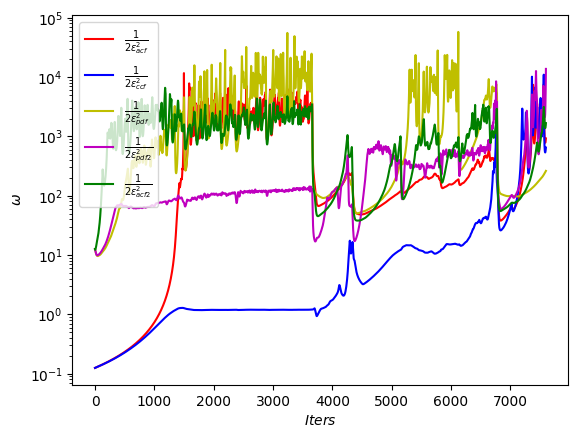

In [28]:
draw_epoch_w(model)

## Test 1: plot the sample path generated by SINN and the exact sample path 

In [29]:
def test1(model):
    ran_input=torch.randn(input.size(),dtype=input.dtype,layout=input.layout, device=input.device)
    Pred,_= model.predict_U(ran_input)
    prediction=Pred[-sec_length:,:,:].detach().cpu().numpy().reshape(sec_length, batch, 2)
    # Test 1: plot the sample path generated by SINN and the exact sample path 
    skip = 0

    fig = plt.figure(0)
    plt.title("MD trajectories",fontsize=15) 
    plt.plot(T[skip:]-T[skip], Traj[skip:, 0])
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$\tilde{q}_1(t)$ and $\tilde{q}_2(t)$',fontsize=15)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15) 


    fig = plt.figure(1)
    plt.title("SINN trajectories",fontsize=15)    
    plt.plot(T[skip:]-T[skip], prediction[skip:, 0])
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$q_1(t)$ and $q_2(t)$',fontsize=15)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)

## Test 2: plot the CCF of the sample path generated by the SINN and the exact CCF

In [30]:
def test2(model):
    ran_input=torch.randn(input.size(),dtype=input.dtype,layout=input.layout, device=input.device)
    Pred,_= model.predict_U(ran_input)
    
    # Test 2: plot the CCF of the sample path generated by the SINN and the exact CCF  
    acf_p=StatLoss.acf(Pred[-sec_length:,:,:])
    acf_t=StatLoss.acf(target)
    corr_p1=acf_p.detach().cpu().numpy()
    corr_t1=acf_t.detach().cpu().numpy()
    ccf_p=StatLoss.ccf(Pred[-sec_length:,:,:])
    ccf_t=StatLoss.ccf(target)
    corr_p2=ccf_p.detach().cpu().numpy()
    corr_t2=ccf_t.detach().cpu().numpy()
    
    fig = plt.figure(0)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title(r'Normalized ACF of $\tilde{q}_1$',fontsize=15)    
    plt.plot(T, corr_t1[...,0],'r',label='Exact')        # correlation function of the target 
    plt.plot(T, corr_p1[...,0], 'b--',label='SINN')        # Correlation function after the training      # Correlation function after the training 
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$C(t)/C(0)$',fontsize=15)
    plt.xticks(fontsize=15)
#     plt.xlim(0,T[-1])
    plt.yticks([-0.2,0,0.2,0.4,0.6,0.8,1.0],fontsize=15)
    plt.legend()
    
    fig = plt.figure(1)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title(r'Normalized ACF of $\tilde{q}_2$',fontsize=15)          
    plt.plot(T, corr_t1[...,-1],'r',label='Exact')        # correlation function of the target 
    plt.plot(T, corr_p1[...,-1], 'b--',label='SINN')     # Correlation function after the training      # Correlation function after the training 
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$C(t)/C(0)$',fontsize=15)
    plt.xticks(fontsize=15)
#     plt.xlim(0,T[-1])
    plt.yticks([-0.2,0,0.2,0.4,0.6,0.8,1.0],fontsize=15)
    plt.legend()
    
    fig = plt.figure(2)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title(r'Normalized CCF',fontsize=15)    
    plt.plot(T, corr_t2[:,:],'r')        # correlation function of the target 
    plt.plot(T, corr_p2[:,:], 'b--')        # Correlation function after the training      # Correlation function after the training 
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$C(t)/C(0)$',fontsize=15)
    plt.xticks(fontsize=15)
#     plt.ylim(-0.05,0.05)

## Test 3: plot the PDF of the sample path generated by SINN and the exact PDF  

In [31]:
def test3(model):
    ran_input=torch.randn(input.size(),dtype=input.dtype,layout=input.layout, device=input.device)
    Pred,_= model.predict_U(ran_input)
    
    # Test 3: plot the PDF of the sample path generated by SINN and the exact PDF  
    rho_data =  StatLoss.gauss_kde(target, -5, 5, 400, None).cpu()
    rho_input = StatLoss.gauss_kde(ran_input, -5, 5, 400, None).cpu()
    rho_prediction = StatLoss.gauss_kde(Pred[-sec_length:,:,:].detach(), -5, 5, 400,None).cpu()
    
    rho_data2 =  StatLoss.gauss_kde6(target, -5, 5, 400, None).cpu()
    rho_prediction2 = StatLoss.gauss_kde6(Pred[-sec_length:,:,:].detach(), -5, 5, 400,None).cpu()


    x=np.linspace(-5, 5, 400)
    fig = plt.figure(0)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title(r"Equilibrium probability density function",fontsize=15)    
    plt.plot(x, rho_data.numpy()[...,0],label=r'Exact PDF of $q_{49}$')    # target PDF
    plt.plot(x, rho_data.numpy()[...,1],label=r'Exact PDF of $q_{50}$')    # target PDF
    plt.plot(x, rho_input.numpy(), 'b--', label=r'PDF of the input')     # PDF of the input
    plt.plot(x, rho_prediction.numpy()[...,0], ':',label=r'PDF of the output $q_{49}$')  # PDF after the training 
    plt.plot(x, rho_prediction.numpy()[...,1], ':',label=r'PDF of the output $q_{50}$')  # PDF after the training 
    plt.xlim(-5,5)
    plt.ylim(0,0.6)
    plt.xlabel(r'$x$',fontsize=15)
    plt.ylabel(r'$\rho(x)$',fontsize=15)
    plt.legend(frameon=False,fontsize=10)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)
    
    
    fig = plt.figure(1)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title(r"Equilibrium probability density function of sum and diff",fontsize=15)    
    plt.plot(x, rho_data2.numpy()[...,0],label=r'Exact PDF of $q_{49}+q_{50}$')    # target PDF
    plt.plot(x, rho_data2.numpy()[...,1],label=r'Exact PDF of $q_{49}-q_{50}$')    # target PDF
    plt.plot(x, rho_input.numpy(), 'b--', label=r'PDF of the input')     # PDF of the input
    plt.plot(x, rho_prediction2.numpy()[...,0], ':',label=r'PDF of the output $q_{49}+q_{50}$')  # PDF after the training 
    plt.plot(x, rho_prediction2.numpy()[...,1], ':',label=r'PDF of the output $q_{49}-q_{50}$')  # PDF after the training 
    plt.xlim(-5,5)
    plt.ylim(0,0.6)
    plt.xlabel(r'$x$',fontsize=15)
    plt.ylabel(r'$\rho(x)$',fontsize=15)
    plt.legend(frameon=False,fontsize=10)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)
    
    fig = plt.figure(2)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title(r"Equilibrium probability density function of sum and diff",fontsize=15)    
    plt.plot(x, rho_data2.numpy()[...,2],label=r'Exact PDF of $q_{49}+2q_{50}$')    # target PDF
    plt.plot(x, rho_data2.numpy()[...,3],label=r'Exact PDF of $q_{49}-2q_{50}$')    # target PDF
    plt.plot(x, rho_input.numpy(), 'b--', label=r'PDF of the input')     # PDF of the input
    plt.plot(x, rho_prediction2.numpy()[...,2], ':',label=r'PDF of the output $q_{49}+2\tilde{q}_2$')  # PDF after the training 
    plt.plot(x, rho_prediction2.numpy()[...,3], ':',label=r'PDF of the output $q_{49}-2\tilde{q}_2$')  # PDF after the training 
    plt.xlim(-5,5)
    plt.ylim(0,0.6)
    plt.xlabel(r'$x$',fontsize=15)
    plt.ylabel(r'$\rho(x)$',fontsize=15)
    plt.legend(frameon=False,fontsize=10)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)
    
    fig = plt.figure(3)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title(r"Equilibrium probability density function of sum and diff",fontsize=15)    
    plt.plot(x, rho_data2.numpy()[...,4],label=r'Exact PDF of $2q_{49}+\tilde{q}_2$')    # target PDF
    plt.plot(x, rho_data2.numpy()[...,5],label=r'Exact PDF of $2q_{49}-\tilde{q}_2$')    # target PDF
    plt.plot(x, rho_input.numpy(), 'b--', label=r'PDF of the input')     # PDF of the input
    plt.plot(x, rho_prediction2.numpy()[...,4], ':',label=r'PDF of the output $2q_{49}+\tilde{q}_2$')  # PDF after the training 
    plt.plot(x, rho_prediction2.numpy()[...,5], ':',label=r'PDF of the output $2q_{49}-\tilde{q}_2$')  # PDF after the training 
    plt.xlim(-5,5)
    plt.ylim(0,0.6)
    plt.xlabel(r'$x$',fontsize=15)
    plt.ylabel(r'$\rho(x)$',fontsize=15)
    plt.legend(frameon=False,fontsize=10)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)

## Test 4: Comparing the higher-order ACF

In [32]:
def test4(model):
    ran_input=torch.randn(input.size(),dtype=input.dtype,layout=input.layout, device=input.device)
    Pred,_= model.predict_U(ran_input)
    prediction=Pred[-sec_length:,:,:].detach().cpu().numpy().reshape(sec_length, batch, 2)
    
    # Test 4: Comparing the higher-order ACF
    acf2=StatLoss.acf(target**2)
    pred_norm=torch.from_numpy((prediction).reshape(sec_length, batch,2))
    acf2_app=StatLoss.acf(pred_norm**2)

    
    fig = plt.figure(0)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title(r'Normalized ACF of $q_{49}^2$',fontsize=15)    
    plt.plot(T, acf2.detach().cpu().numpy()[...,0],'r',label='Exact')        # correlation function of the target 
    plt.plot(T, acf2_app.detach().cpu().numpy()[...,0], 'b--',label='SINN')        # Correlation function after the training      # Correlation function after the training 
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$C(t)/C(0)$',fontsize=15)
    plt.xticks(fontsize=15)
    plt.xlim(0,T[-1])
    plt.yticks([-0.2,0,0.2,0.4,0.6,0.8,1.0],fontsize=15)
    plt.legend()
    
    fig = plt.figure(1)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title(r'Normalized ACF of $q_{50}^2$',fontsize=15)          
    plt.plot(T, acf2.detach().cpu().numpy()[...,1],'r',label='Exact')        # correlation function of the target 
    plt.plot(T, acf2_app.detach().cpu().numpy()[...,1], 'b--',label='SINN')     # Correlation function after the training      # Correlation function after the training 
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$C(t)/C(0)$',fontsize=15)
    plt.xticks(fontsize=15)
    plt.xlim(0,T[-1])
    plt.yticks([-0.2,0,0.2,0.4,0.6,0.8,1.0],fontsize=15)
    plt.legend()    

## Test 5: plot the expolation result, i.e. Prediction of the FPU-Langevin dynamics for longer time 

In [33]:
def test5(model):
    # Test 5: plot the expolation result, i.e. Prediction of the FPU-Langevin dynamics for longer time 
    [a,b,c]=input.size()
    skip=20
    scale=10
    burnin=3
    fold=800
    batch_new=50
    ran_input=torch.randn(((scale-burnin)*a,batch_new,c),dtype=input.dtype,layout=input.layout, device=input.device)
    Pred_L, _= model.predict_U(ran_input)
    prediction_ext=Pred_L.detach().cpu().numpy().reshape((scale-burnin)*a, batch_new,2)
    ccf_p=StatLoss.ccf(Pred_L,method='bruteforce')

    LT=np.linspace(0,(scale-burnin)*a*delta_t,num=(scale-burnin)*a+1)
    LT=LT[0:-1]


    fig = plt.figure(0)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title("Short-time trajectories",fontsize=15)
    plt.plot(t_store[Toss:]-t_store[Toss],q49_store[:,0],label='MD simulation')
    plt.plot(LT[skip:]-LT[skip], prediction_ext[skip:, 0, 0],'--',label='SINN simulation')
    plt.xlim([0,80])
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$q_{49}(t)$',fontsize=15)
    plt.legend(frameon=False,fontsize=15)
    plt.yticks([-2,-1,0,1,2],fontsize=15)
    plt.xticks(fontsize=15)



    fig = plt.figure(figsize=(16, 4))
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title("Long-time trajectories",fontsize=15)
    plt.plot(t_store[Toss:]-t_store[Toss],q49_store[:,0],label='MD simulation')
    plt.plot(LT[skip:]-LT[skip], prediction_ext[skip:, 0, 0],'--',label='SINN simulation')
    plt.xlim([0,500])
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$q_{49}(t)$',fontsize=15)
    plt.legend(frameon=False,fontsize=15)
    plt.yticks([-2,-1,0,1,2],fontsize=15)
    plt.xticks(fontsize=15)

    fig = plt.figure(2)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title("Short-time trajectories",fontsize=15)
    plt.plot(t_store[Toss:]-t_store[Toss],q50_store[:,0],label='MD simulation')
    plt.plot(LT[skip:]-LT[skip], prediction_ext[skip:, 0, 1],'--',label='SINN simulation')
    plt.xlim([0,80])
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$q_{50}(t)$',fontsize=15)
    plt.legend(frameon=False,fontsize=15)
    plt.yticks([-2,-1,0,1,2],fontsize=15)
    plt.xticks(fontsize=15)



    fig = plt.figure(figsize=(16, 4))
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title("Long-time trajectories",fontsize=15)
    plt.plot(t_store[Toss:]-t_store[Toss],q50_store[:,0],label='MD simulation')
    plt.plot(LT[skip:]-LT[skip], prediction_ext[skip:, 0, 1],'--',label='SINN simulation')
    plt.xlim([0,500])
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$q_{50}(t)$',fontsize=15)
    plt.legend(frameon=False,fontsize=15)
    plt.yticks([-2,-1,0,1,2],fontsize=15)
    plt.xticks(fontsize=15)

## Test 6: comparing scatter plots

In [34]:
def test6(model):
    # Test 6: scatter plot of SINN
    ran_input=torch.randn(input.size(),dtype=input.dtype,layout=input.layout, device=input.device)
    Pred,_= model.predict_U(ran_input)
    prediction=Pred[-sec_length:,:,:].detach().cpu().numpy().reshape(sec_length, batch, 2)
    
    fig = plt.figure(0)
    plt.title("MD trajectories",fontsize=15) 
    plt.scatter(Traj[:,:,0], Traj[:,:,1])
    plt.xlabel(r'$q_{49}(t)$',fontsize=15)
    plt.ylabel(r'$q_{50}(t)$',fontsize=15)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15) 


    fig = plt.figure(1)
    plt.title("SINN trajectories",fontsize=15)    
    plt.scatter(prediction[:,:,0],prediction[:,:,1])
    plt.xlabel(r'$q_{49}(t)$',fontsize=15)
    plt.ylabel(r'$q_{50}(t)$',fontsize=15)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)

## Test 7: comparing joint PDF contours

In [35]:
def test7(model):
    # Test 5: scatter plot of SINN
    ran_input=torch.randn(input.size(),dtype=input.dtype,layout=input.layout, device=input.device)
    Pred,_= model.predict_U(ran_input)
    prediction=Pred[-sec_length:,:,:].detach().cpu().numpy().reshape(sec_length, batch, 2)
    
    rho_data =  StatLoss.gauss_kde2D(target, -5, 5, 400, None).cpu()
    rho_prediction = StatLoss.gauss_kde2D(Pred[-sec_length:,:,:].detach(), -5, 5, 400,None).cpu()
    
    fig = plt.figure(0, figsize=(5, 5))
    plt.title("PDF Contours",fontsize=15) 
    xmin, xmax = -5, 5
    ymin, ymax = -5, 5

    xx, yy = np.mgrid[xmin:xmax:400j, ymin:ymax:400j]
    axs[0]  = fig.gca()
    plt.xlim(xmin, xmax)
    plt.ylim(ymin, ymax)
    
    plt.contour(xx,yy,rho_data.numpy(),colors='r')
    plt.contour(xx,yy,rho_prediction.numpy(),colors='b',linestyles='dashed')

    plt.xlabel(r'$q_{49}$')
    plt.ylabel(r'$q_{50}$')

    
    
    fig = plt.figure(1,figsize=(5, 5))
    plt.title("MD trajectories",fontsize=15) 
    xmin, xmax = -5, 5
    ymin, ymax = -5, 5

#     xx, yy = np.mgrid[xmin:xmax:20j, ymin:ymax:20j]
    ax  = fig.gca()
    ax.set_xlim(xmin, xmax)
    ax.set_ylim(ymin, ymax)
    cfset = ax.contourf(xx, yy, rho_data.numpy(), cmap='Blues')
    cset = ax.contour(xx, yy, rho_data.numpy(), colors='k')

    ax.clabel(cset, inline=1, fontsize=10)
    ax.set_xlabel(r'$q_{49}$')
    ax.set_ylabel(r'$q_{50}$')

    
    
    fig = plt.figure(2,figsize=(5, 5))
    plt.title("SINN output",fontsize=15) 
    xmin, xmax = -5, 5
    ymin, ymax = -5, 5

#     xx, yy = np.mgrid[xmin:xmax:20j, ymin:ymax:20j]
    ax  = fig.gca()
    ax.set_xlim(xmin, xmax)
    ax.set_ylim(ymin, ymax)
    cfset = ax.contourf(xx, yy, rho_prediction.numpy(), cmap='Blues')
    cset = ax.contour(xx, yy, rho_prediction.numpy(), colors='k')

    ax.clabel(cset, inline=1, fontsize=10)
    ax.set_xlabel(r'$q_{49}$')
    ax.set_ylabel(r'$q_{50}$')

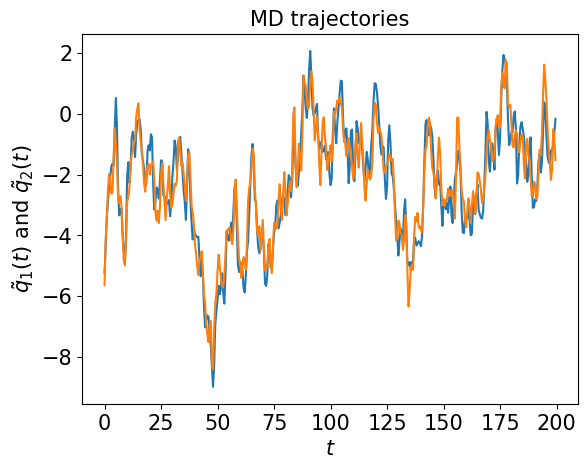

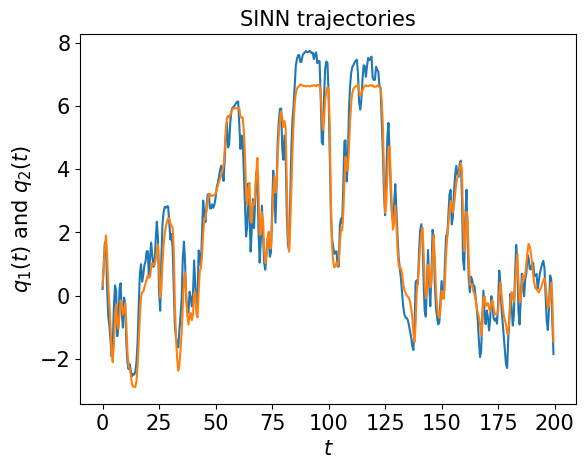

In [36]:
test1(model)

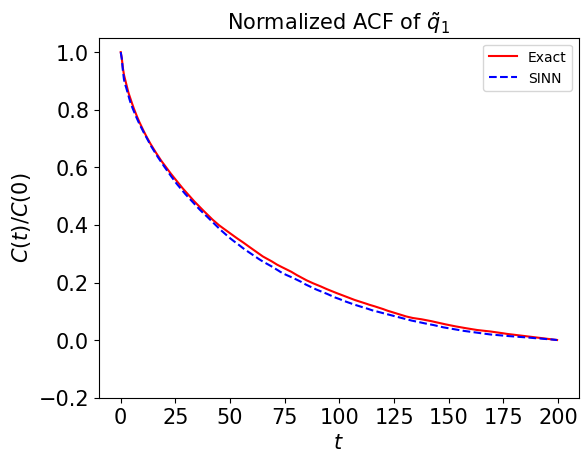

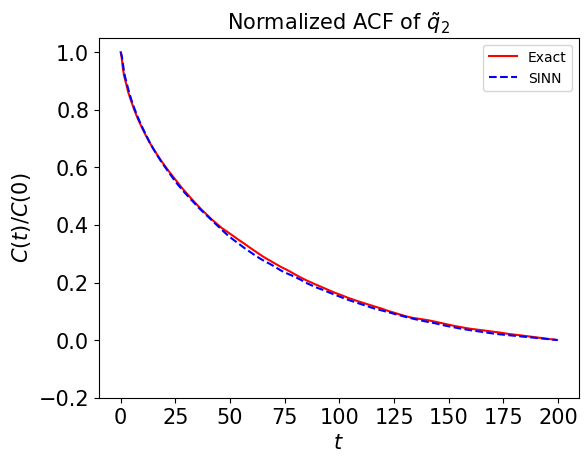

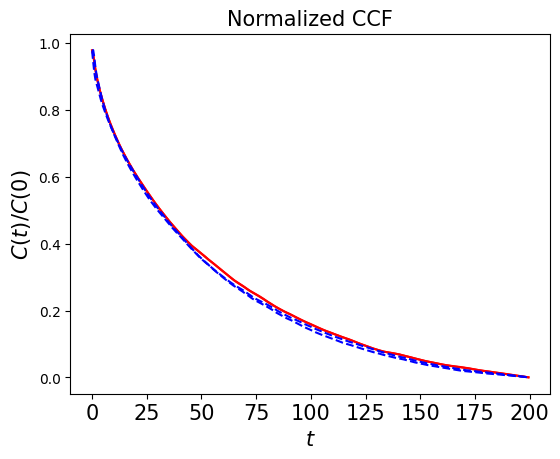

In [37]:
test2(model)

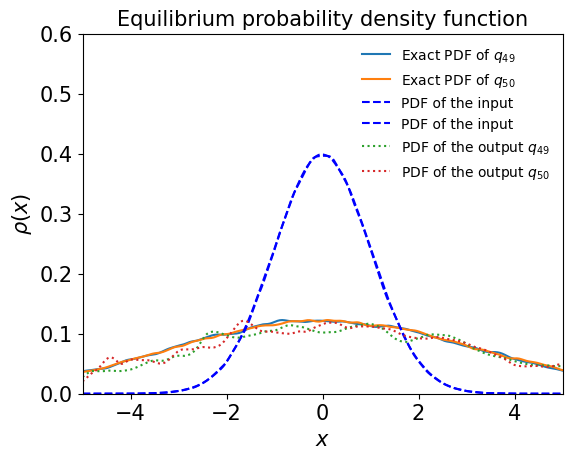

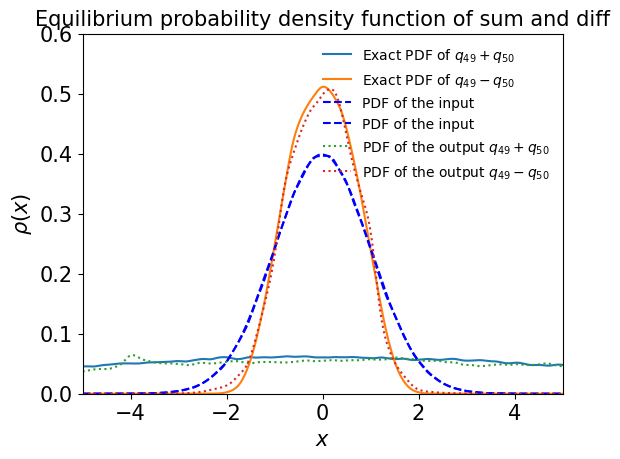

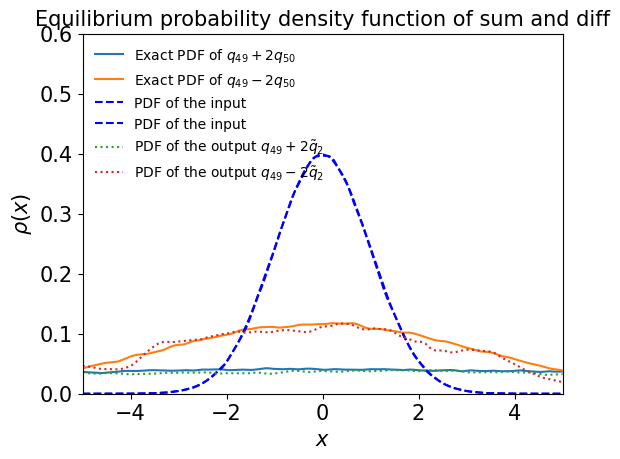

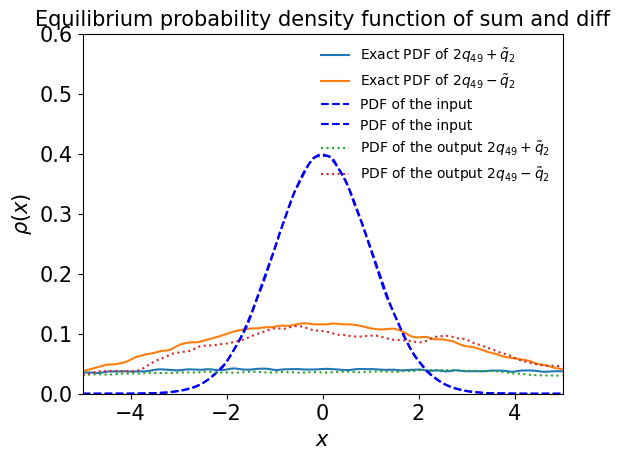

In [38]:
test3(model)

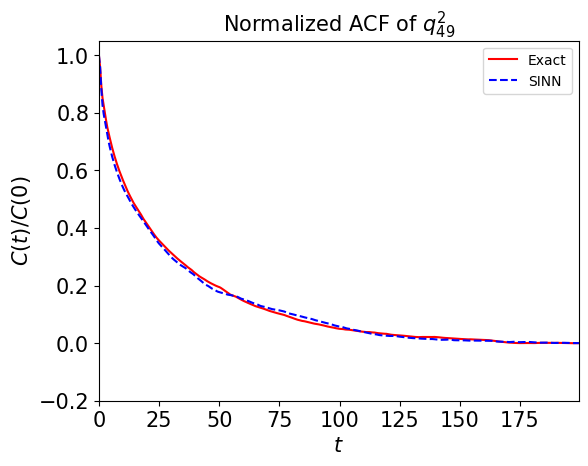

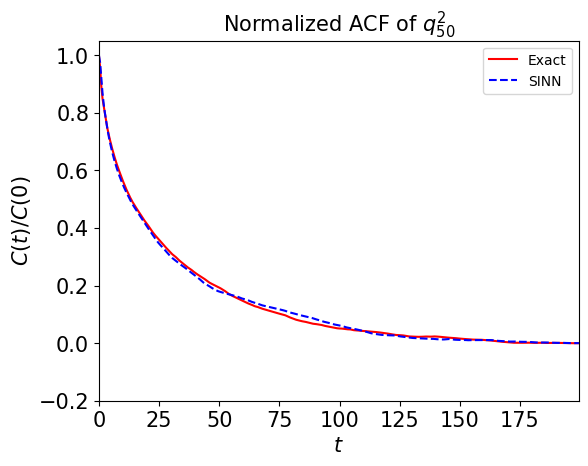

In [39]:
test4(model)

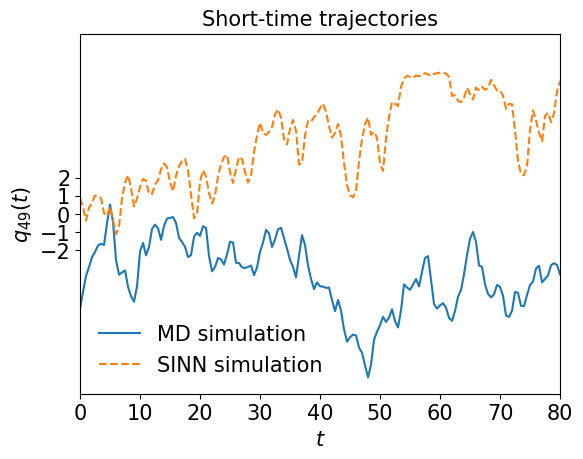

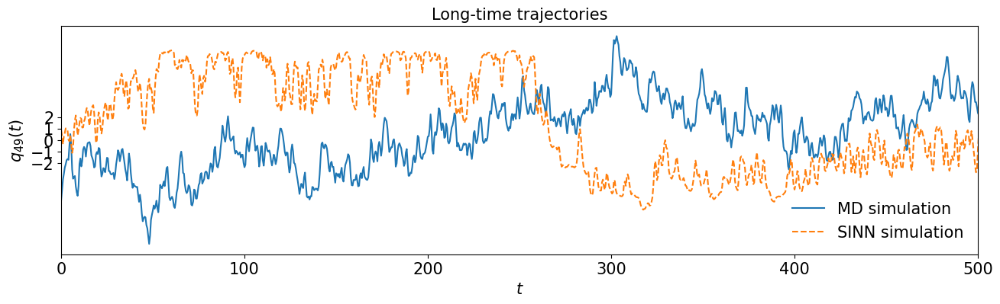

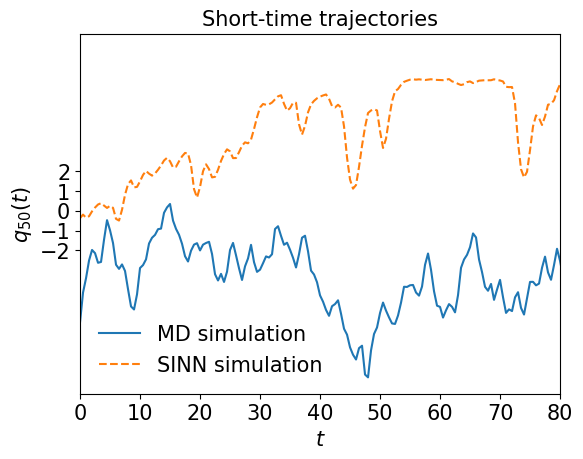

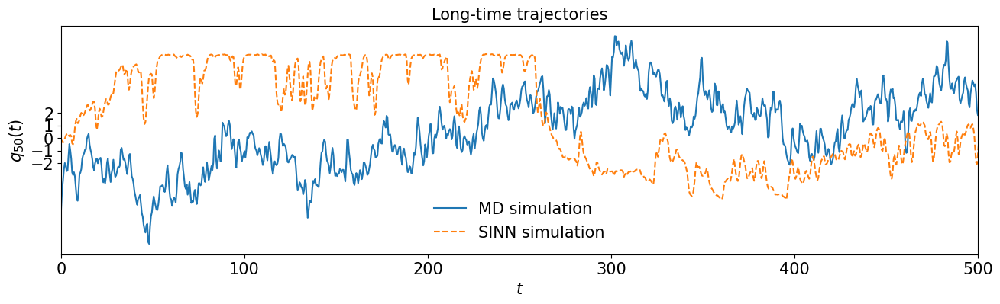

In [40]:
test5(model)

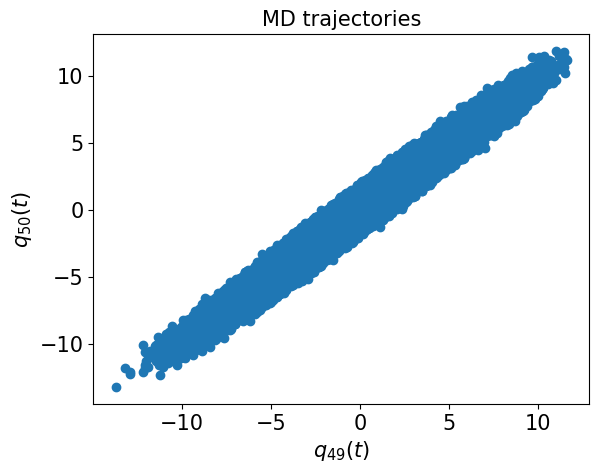

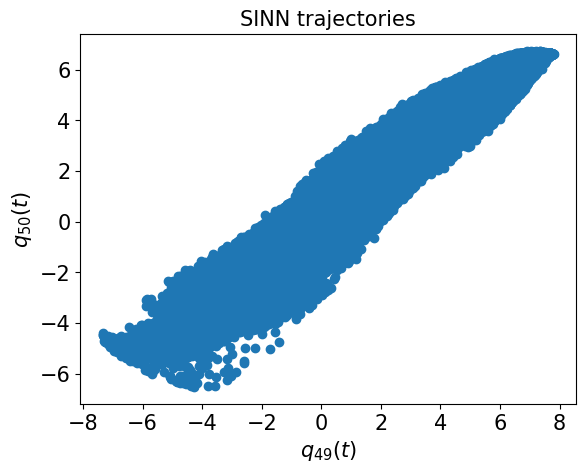

In [41]:
test6(model)

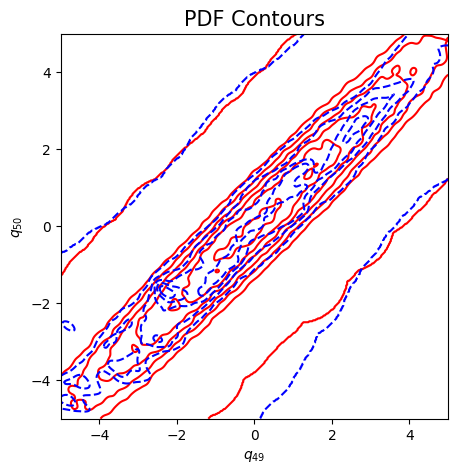

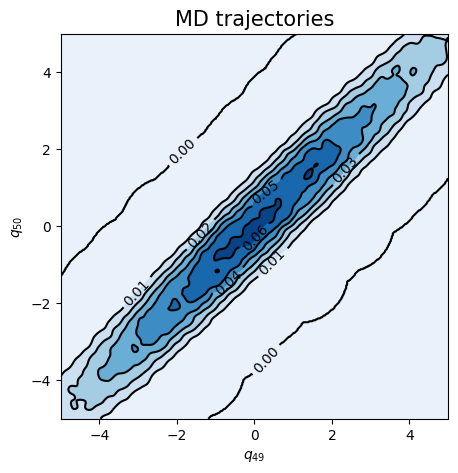

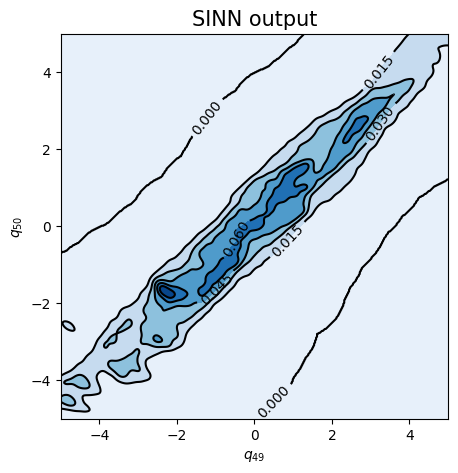

In [42]:
test7(model)

In [43]:
### Defining SINN model
net1 = SINN(2, 100, 4, 2).to(device) # input dimension, hidden size, number of layers, output dimension
model1 = Model(net=net1)
model1.train()

[0]-th step loss: 0.8620, 0.8340, acf: 0.09508, ccf: 0.11644, pdf: 0.29324, pdf2: 0.28992, acf2: 0.03936
[50]-th step loss: 0.1108, 0.1095, acf: 0.03518, ccf: 0.03514, pdf: 0.02213, pdf2: 0.01181, acf2: 0.00521
[100]-th step loss: 0.0434, 0.0676, acf: 0.02590, ccf: 0.02625, pdf: 0.00615, pdf2: 0.00476, acf2: 0.00459
[150]-th step loss: 0.0980, 0.0988, acf: 0.04254, ccf: 0.04266, pdf: 0.00564, pdf2: 0.00234, acf2: 0.00560
[200]-th step loss: 0.1200, 0.0992, acf: 0.03980, ccf: 0.04008, pdf: 0.00941, pdf2: 0.00753, acf2: 0.00235
[250]-th step loss: 0.1581, 0.1411, acf: 0.03887, ccf: 0.03882, pdf: 0.03009, pdf2: 0.02658, acf2: 0.00678
[300]-th step loss: 0.0602, 0.0728, acf: 0.00080, ccf: 0.00081, pdf: 0.00806, pdf2: 0.04442, acf2: 0.01876
[350]-th step loss: 0.0464, 0.0497, acf: 0.01810, ccf: 0.01854, pdf: 0.00830, pdf2: 0.00409, acf2: 0.00071
[400]-th step loss: 0.0460, 0.0443, acf: 0.01600, ccf: 0.01589, pdf: 0.00829, pdf2: 0.00388, acf2: 0.00027
[450]-th step loss: 0.0446, 0.0493, acf:

[3850]-th step loss: 0.0738, 0.0716, acf: 0.00432, ccf: 0.00432, pdf: 0.00829, pdf2: 0.04475, acf2: 0.00994
[3900]-th step loss: 0.2945, 0.3565, acf: 0.06629, ccf: 0.06641, pdf: 0.05257, pdf2: 0.03209, acf2: 0.13914
[3950]-th step loss: 0.0477, 0.0546, acf: 0.01102, ccf: 0.01099, pdf: 0.00520, pdf2: 0.00489, acf2: 0.02247
[4000]-th step loss: 0.0114, 0.0138, acf: 0.00165, ccf: 0.00166, pdf: 0.00450, pdf2: 0.00375, acf2: 0.00222
[4050]-th step loss: 0.0073, 0.0110, acf: 0.00249, ccf: 0.00254, pdf: 0.00190, pdf2: 0.00120, acf2: 0.00292
[4100]-th step loss: 0.0043, 0.0031, acf: 0.00061, ccf: 0.00063, pdf: 0.00064, pdf2: 0.00079, acf2: 0.00046
[4150]-th step loss: 0.0032, 0.0028, acf: 0.00076, ccf: 0.00070, pdf: 0.00037, pdf2: 0.00057, acf2: 0.00037
[4200]-th step loss: 0.0208, 0.0245, acf: 0.00762, ccf: 0.00782, pdf: 0.00169, pdf2: 0.00071, acf2: 0.00668
[4250]-th step loss: 0.0043, 0.0068, acf: 0.00170, ccf: 0.00171, pdf: 0.00082, pdf2: 0.00060, acf2: 0.00193
[4300]-th step loss: 0.0035,

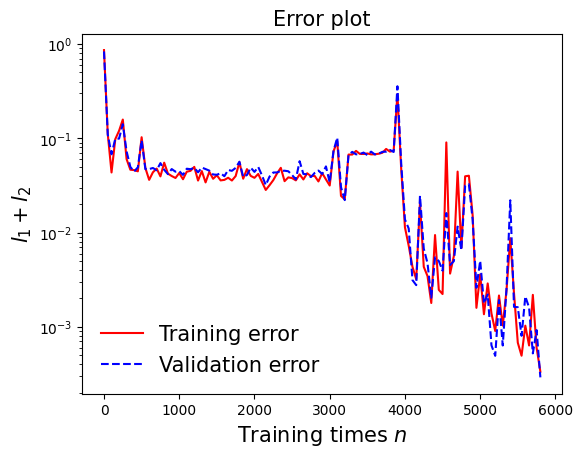

In [44]:
draw_loss(model1)

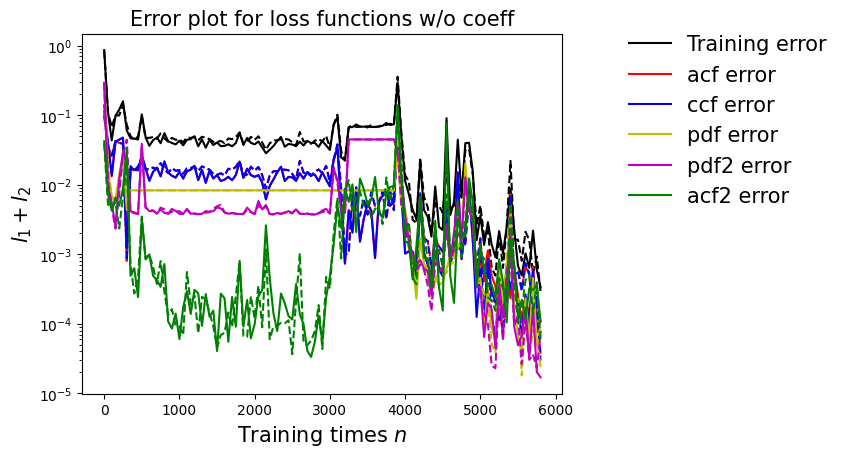

In [45]:
draw_errors(model1)

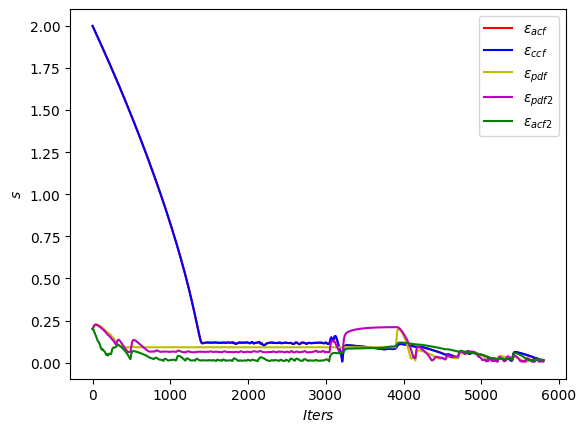

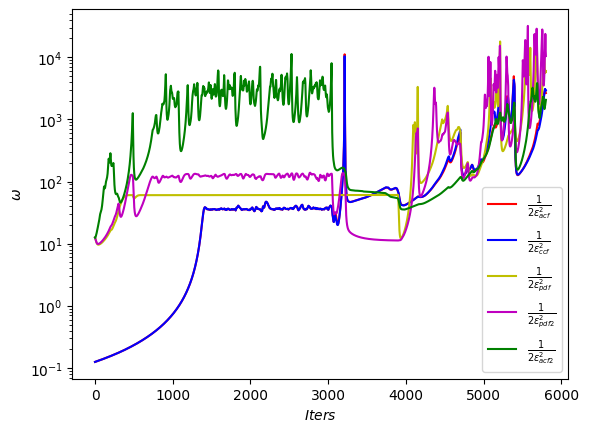

In [46]:
draw_adaptive_w(model1)
draw_epoch_w(model1)

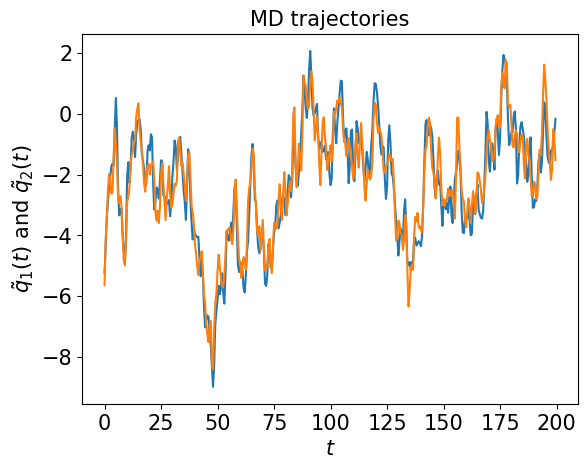

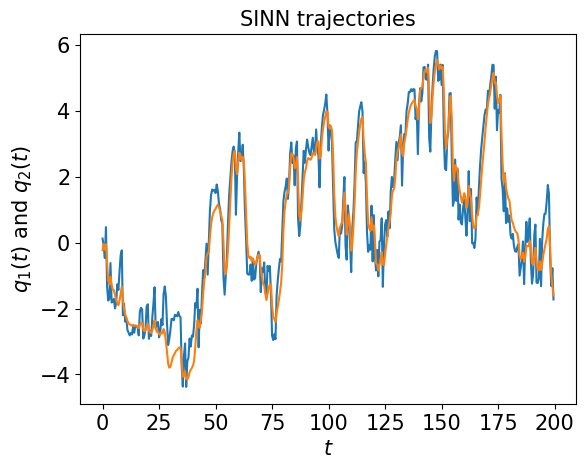

In [47]:
test1(model1)

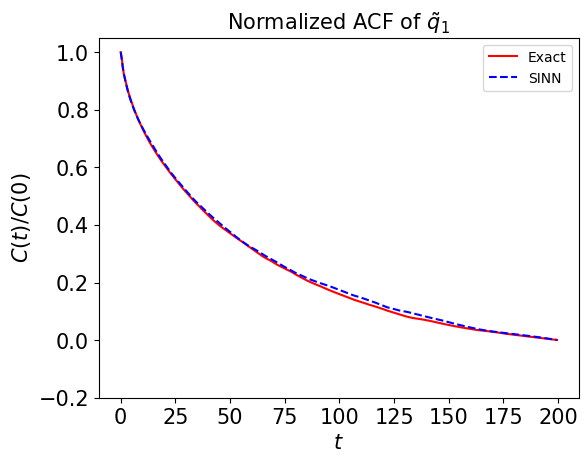

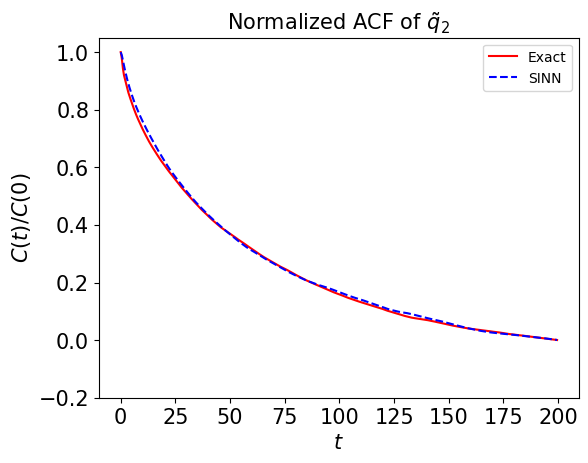

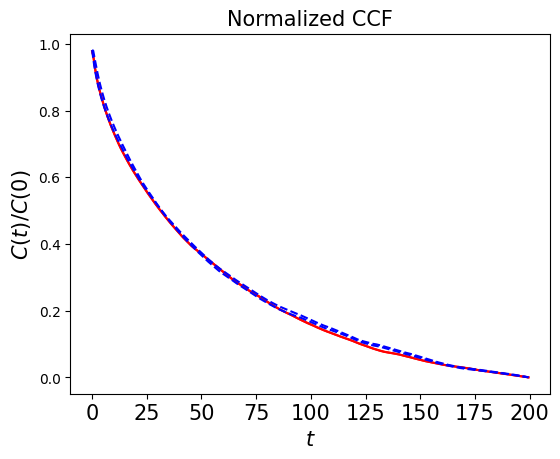

In [48]:
test2(model1)

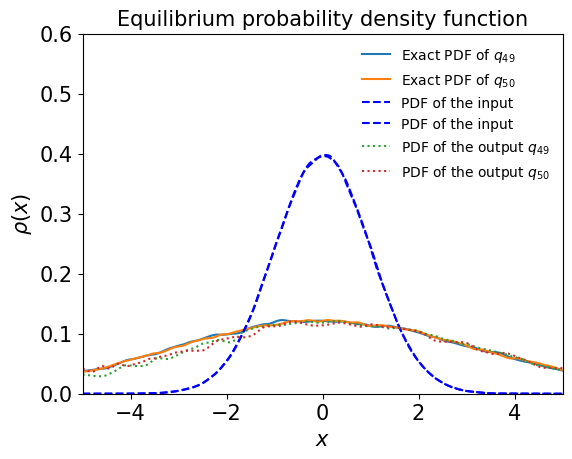

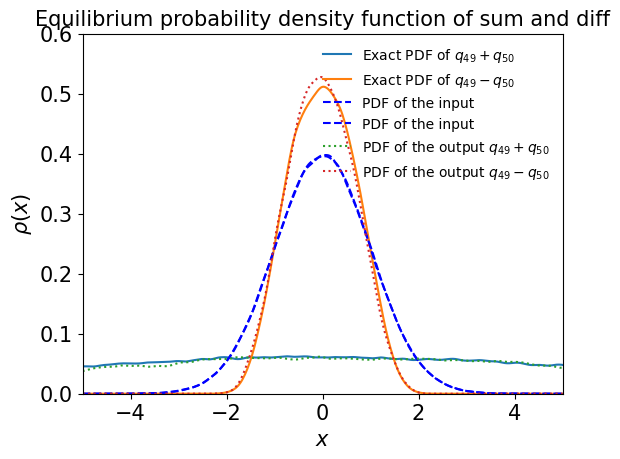

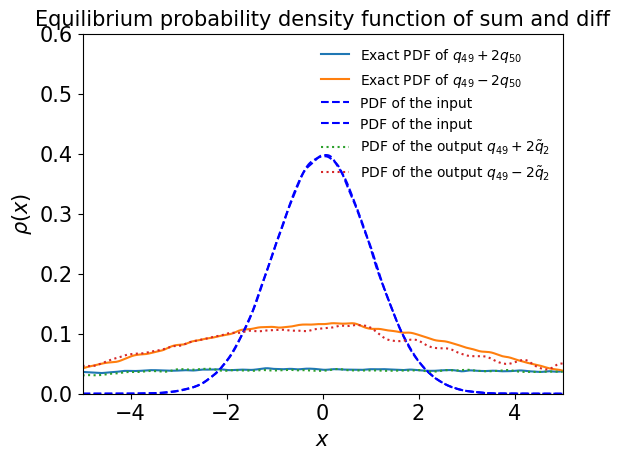

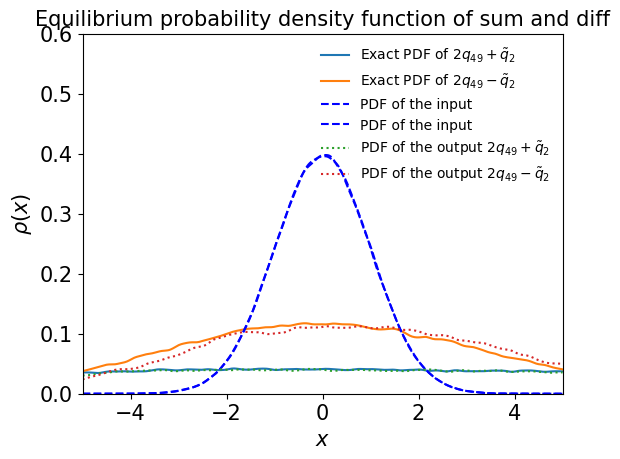

In [49]:
test3(model1)

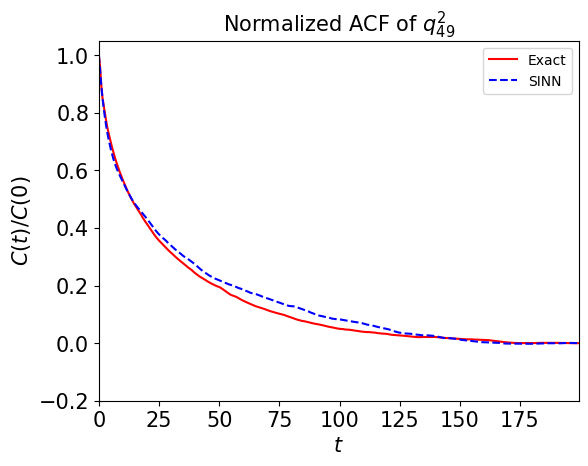

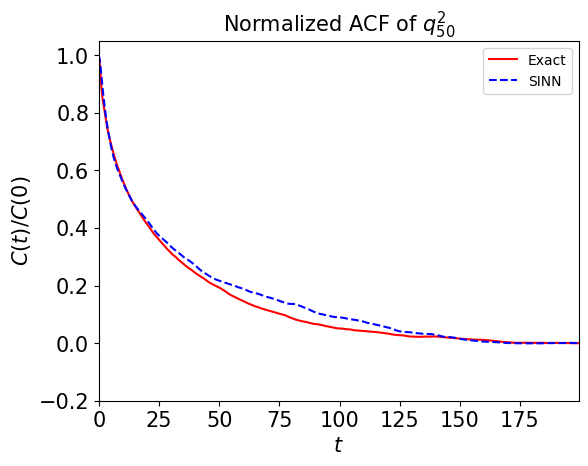

In [50]:
test4(model1)

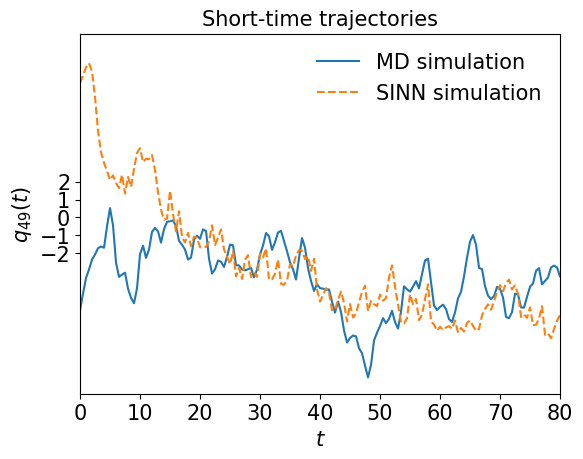

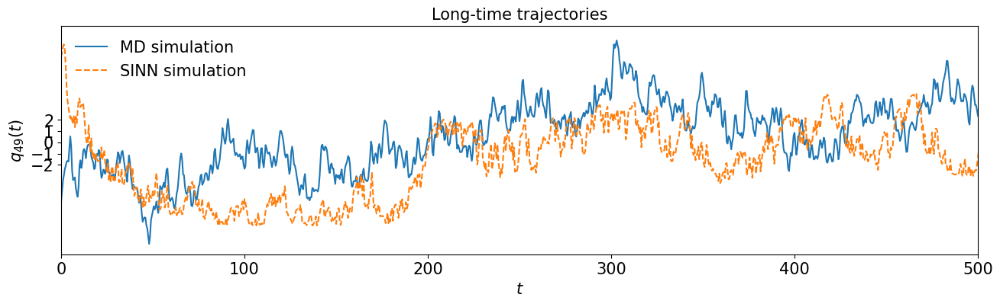

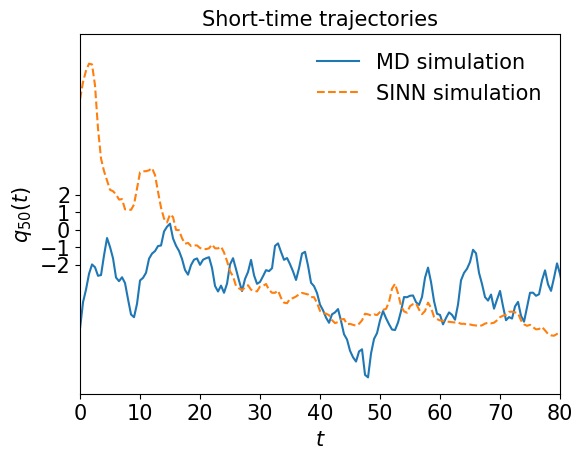

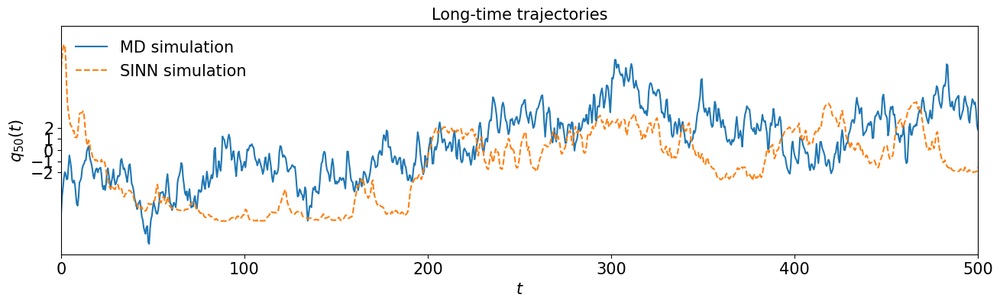

In [51]:
test5(model1)

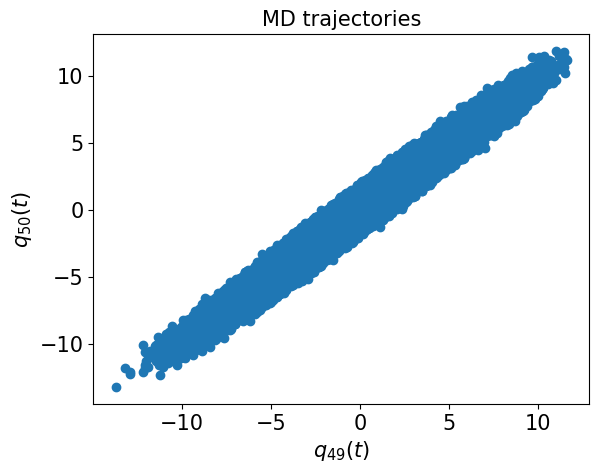

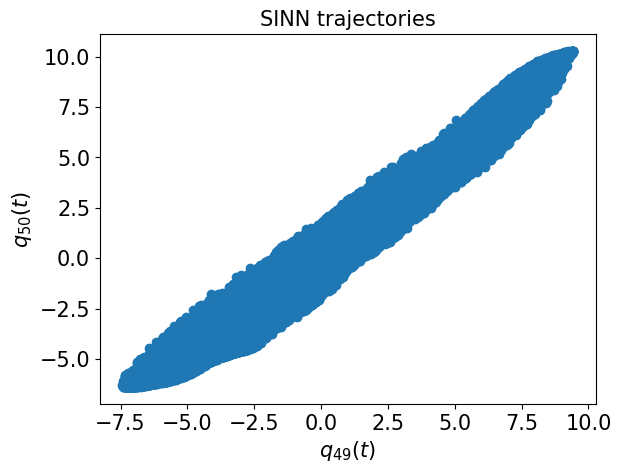

In [52]:
test6(model1)

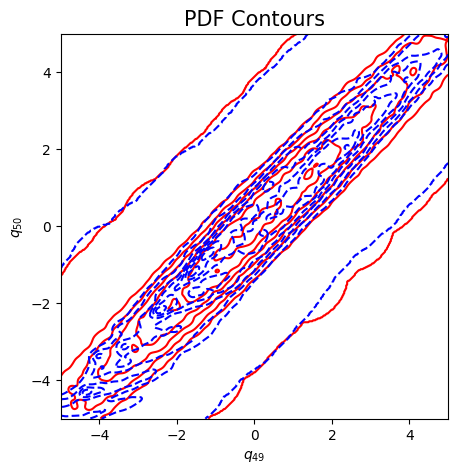

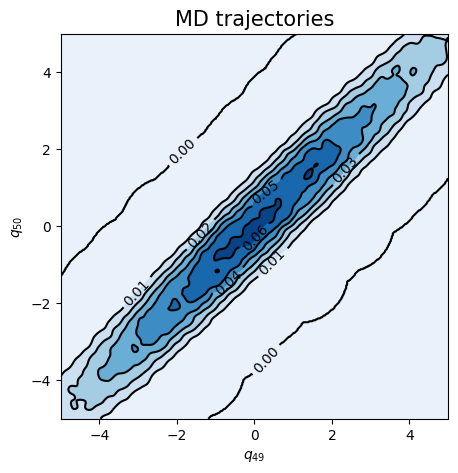

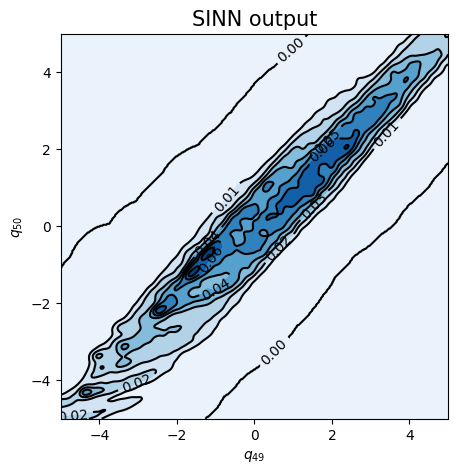

In [53]:
test7(model1)

In [54]:
### Defining SINN model
net2 = SINN(2, 100, 4, 2).to(device) # input dimension, hidden size, number of layers, output dimension
model2 = Model(net=net2)
model2.train()

[0]-th step loss: 0.8376, 0.8301, acf: 0.09511, ccf: 0.11256, pdf: 0.29316, pdf2: 0.28994, acf2: 0.03938
[50]-th step loss: 0.0962, 0.0929, acf: 0.02950, ccf: 0.02987, pdf: 0.01650, pdf2: 0.00747, acf2: 0.00959
[100]-th step loss: 0.0234, 0.0284, acf: 0.00384, ccf: 0.00267, pdf: 0.00765, pdf2: 0.01000, acf2: 0.00422
[150]-th step loss: 0.1235, 0.0659, acf: 0.01624, ccf: 0.00557, pdf: 0.02487, pdf2: 0.01403, acf2: 0.00514
[200]-th step loss: 0.0239, 0.0220, acf: 0.00443, ccf: 0.00577, pdf: 0.00608, pdf2: 0.00545, acf2: 0.00024
[250]-th step loss: 0.0668, 0.0775, acf: 0.02895, ccf: 0.02887, pdf: 0.01183, pdf2: 0.00675, acf2: 0.00109
[300]-th step loss: 0.0780, 0.0673, acf: 0.02700, ccf: 0.02693, pdf: 0.00746, pdf2: 0.00535, acf2: 0.00059
[350]-th step loss: 0.0795, 0.0401, acf: 0.01411, ccf: 0.01406, pdf: 0.00670, pdf2: 0.00485, acf2: 0.00042
[400]-th step loss: 0.0357, 0.0309, acf: 0.01084, ccf: 0.01080, pdf: 0.00434, pdf2: 0.00462, acf2: 0.00032
[450]-th step loss: 0.0316, 0.0258, acf:

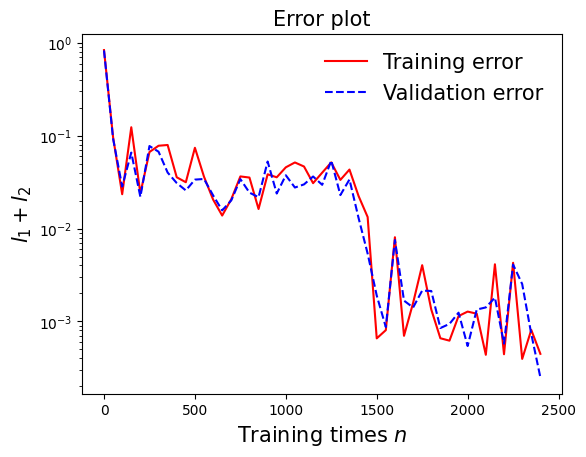

In [55]:
draw_loss(model2)

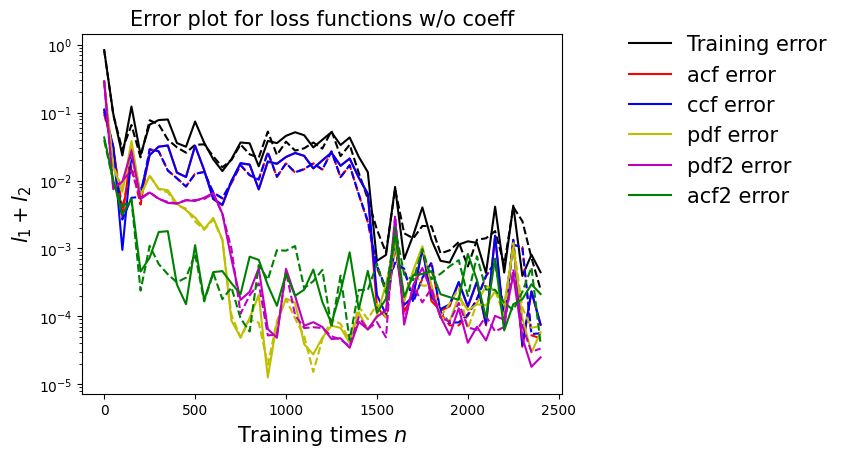

In [56]:
draw_errors(model2)

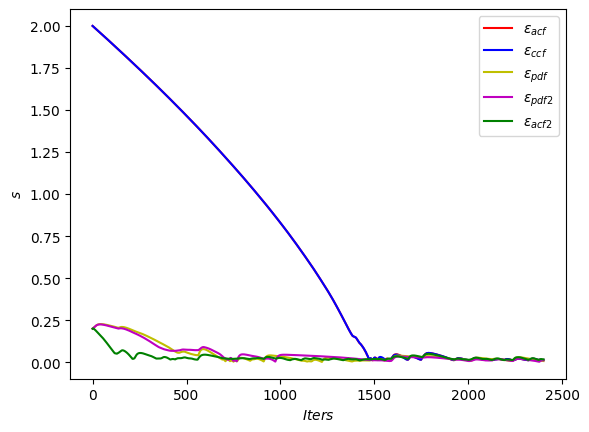

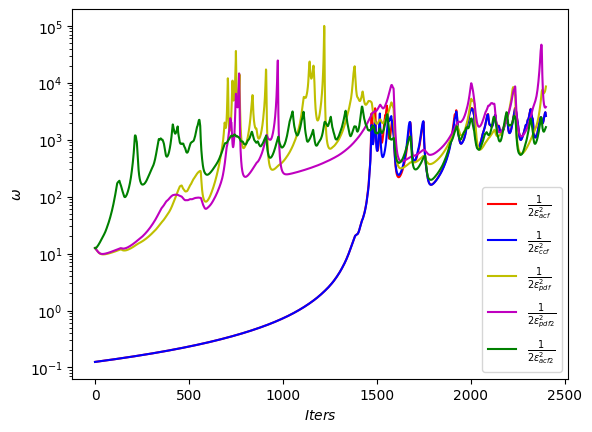

In [57]:
draw_adaptive_w(model2)
draw_epoch_w(model2)

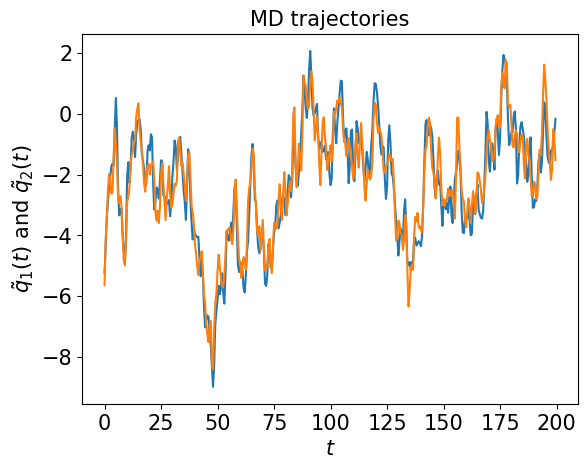

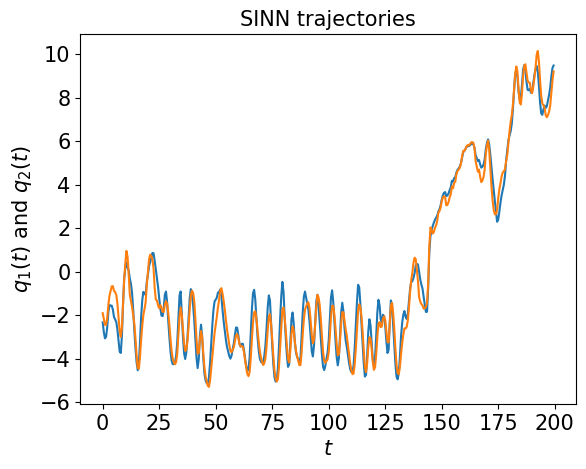

In [58]:
test1(model2)

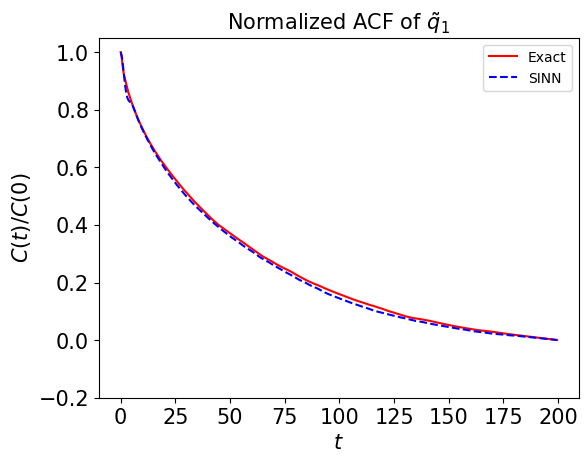

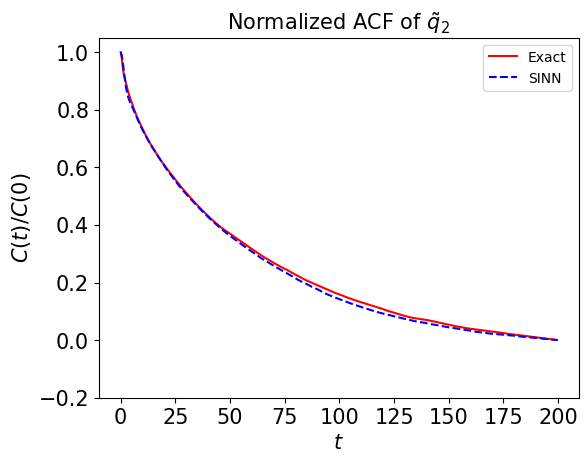

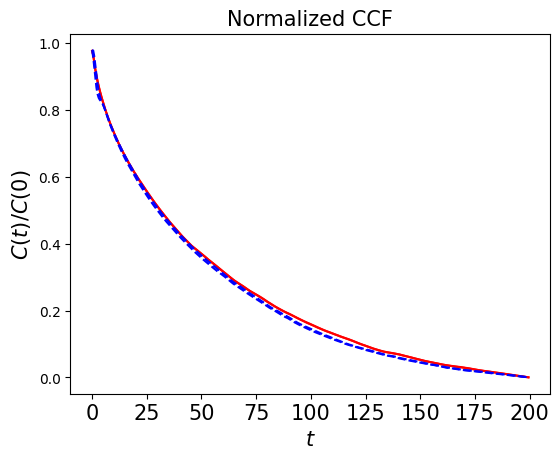

In [59]:
test2(model2)

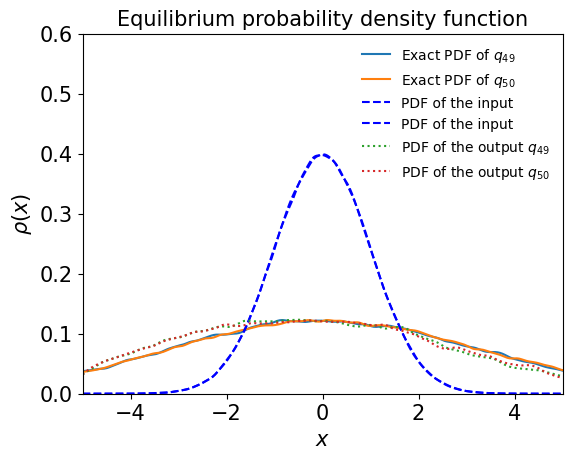

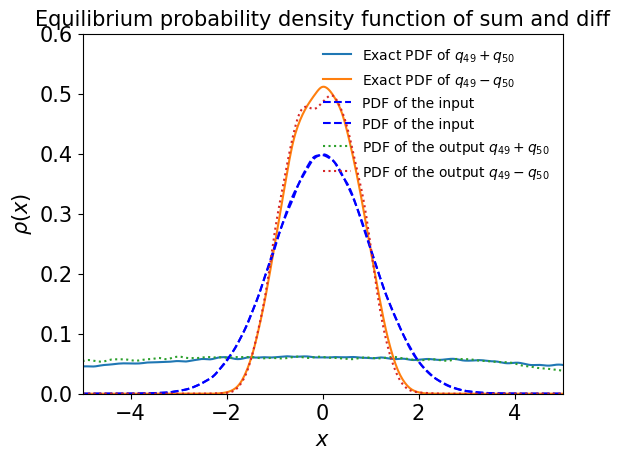

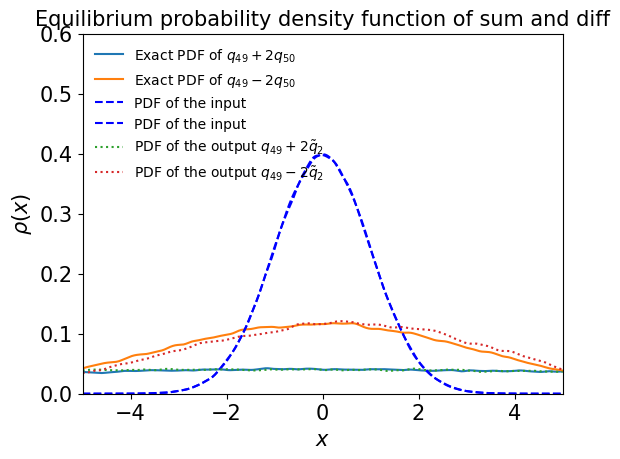

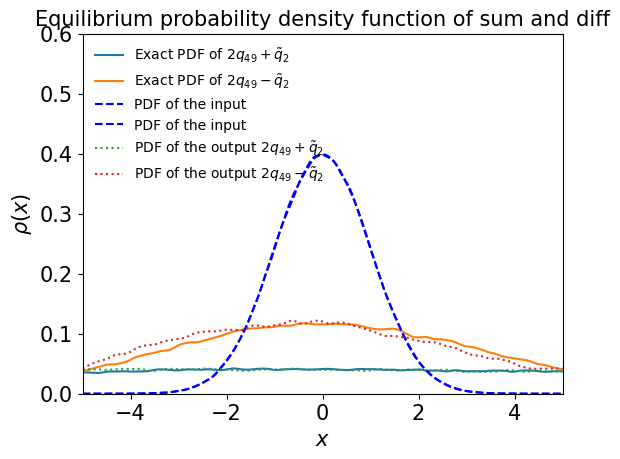

In [60]:
test3(model2)

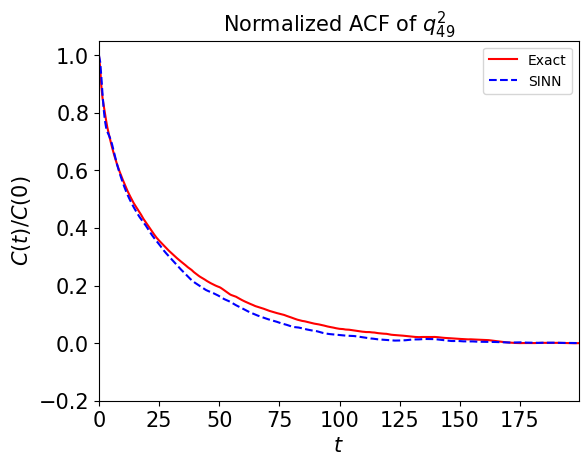

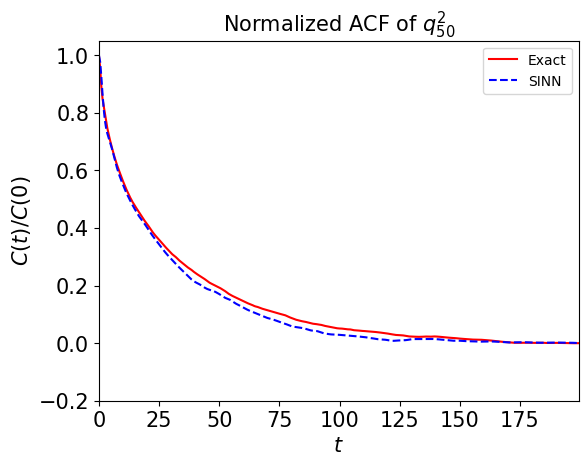

In [61]:
test4(model2)

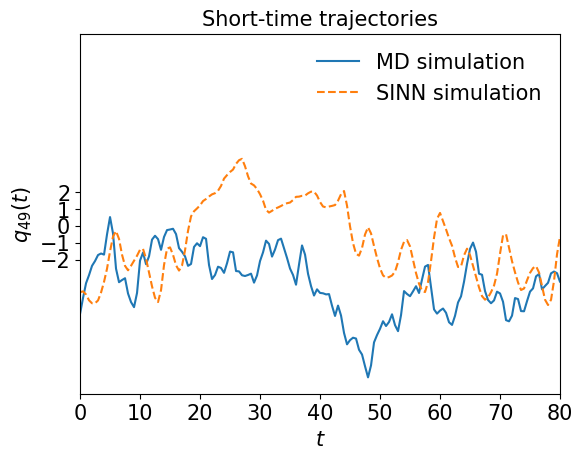

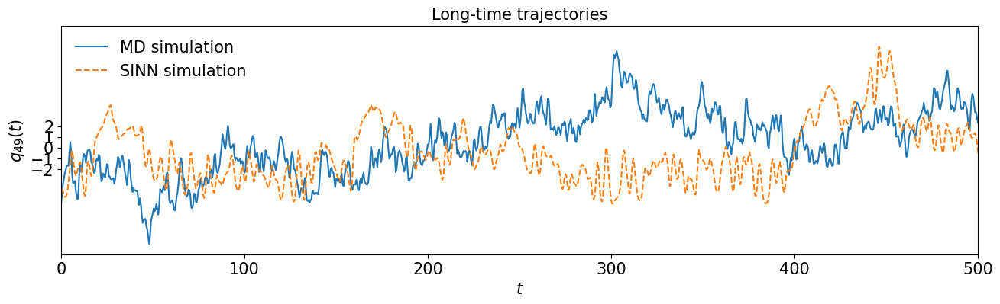

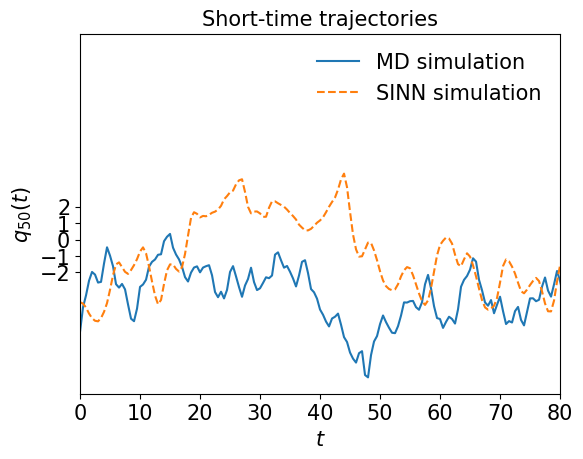

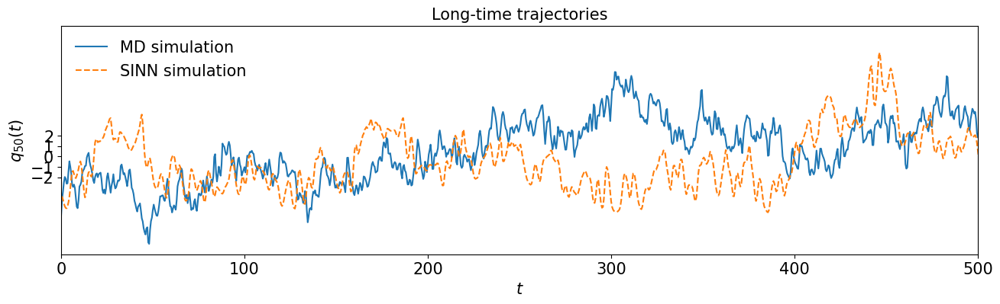

In [62]:
test5(model2)

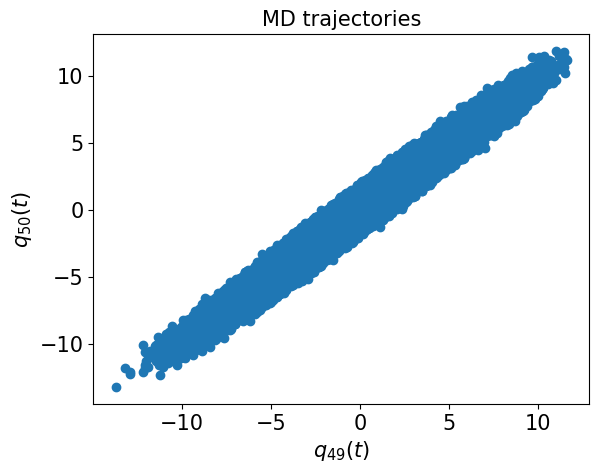

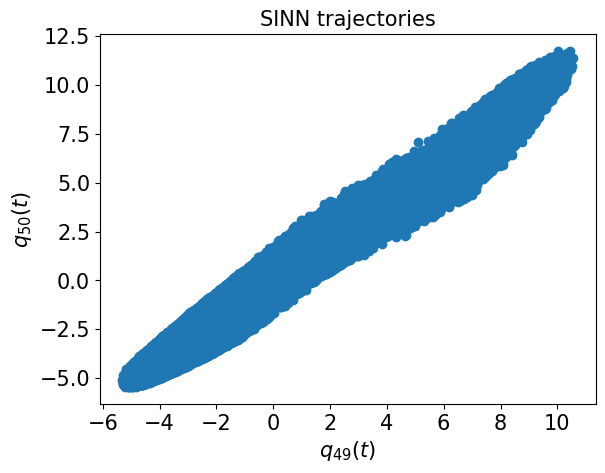

In [63]:
test6(model2)

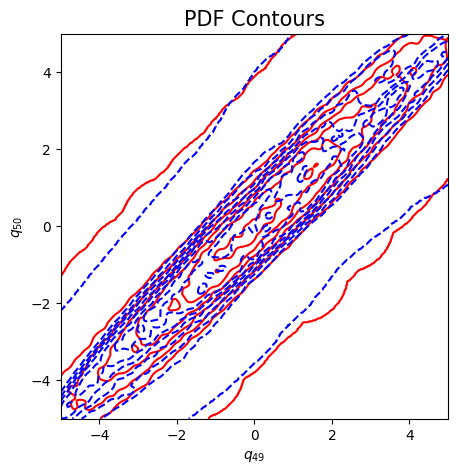

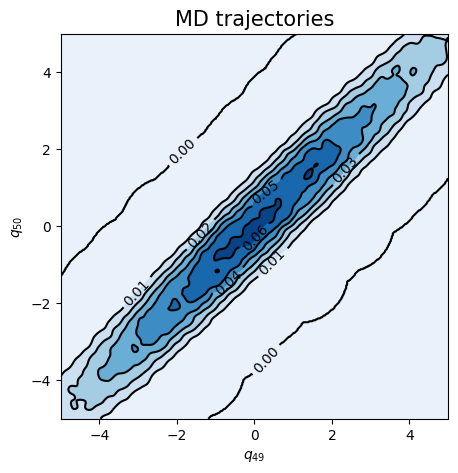

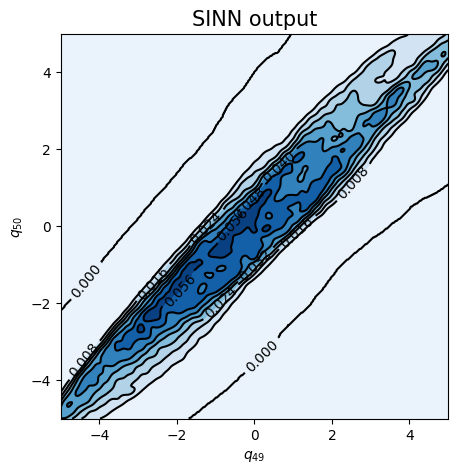

In [64]:
test7(model2)

In [65]:
### Defining SINN model
net3 = SINN(2, 100, 4, 2).to(device) # input dimension, hidden size, number of layers, output dimension
model3 = Model(net=net3)
model3.train()

[0]-th step loss: 0.8551, 0.8613, acf: 0.09501, ccf: 0.14364, pdf: 0.29316, pdf2: 0.29008, acf2: 0.03937
[50]-th step loss: 0.3525, 0.3507, acf: 0.05202, ccf: 0.25870, pdf: 0.01489, pdf2: 0.01110, acf2: 0.01398
[100]-th step loss: 0.4398, 0.4660, acf: 0.00546, ccf: 0.43568, pdf: 0.01053, pdf2: 0.01043, acf2: 0.00390
[150]-th step loss: 0.4064, 0.4257, acf: 0.01157, ccf: 0.38740, pdf: 0.01092, pdf2: 0.01100, acf2: 0.00483
[200]-th step loss: 0.3612, 0.3547, acf: 0.03916, ccf: 0.27527, pdf: 0.02115, pdf2: 0.01498, acf2: 0.00414
[250]-th step loss: 0.3608, 0.3765, acf: 0.01891, ccf: 0.33427, pdf: 0.00961, pdf2: 0.01142, acf2: 0.00229
[300]-th step loss: 0.3073, 0.3033, acf: 0.03959, ccf: 0.25200, pdf: 0.00331, pdf2: 0.00756, acf2: 0.00090
[350]-th step loss: 0.3495, 0.3128, acf: 0.03014, ccf: 0.27204, pdf: 0.00313, pdf2: 0.00724, acf2: 0.00027
[400]-th step loss: 0.3351, 0.3383, acf: 0.01672, ccf: 0.31180, pdf: 0.00252, pdf2: 0.00698, acf2: 0.00024
[450]-th step loss: 0.3532, 0.3561, acf:

[3850]-th step loss: 0.6101, 0.6084, acf: 0.01149, ccf: 0.33568, pdf: 0.15066, pdf2: 0.11030, acf2: 0.00027
[3900]-th step loss: 0.5993, 0.5997, acf: 0.01413, ccf: 0.32454, pdf: 0.15066, pdf2: 0.11030, acf2: 0.00004
[3950]-th step loss: 0.5763, 0.5923, acf: 0.01654, ccf: 0.31476, pdf: 0.15067, pdf2: 0.11030, acf2: 0.00008
[4000]-th step loss: 0.6079, 0.6014, acf: 0.01367, ccf: 0.32664, pdf: 0.15067, pdf2: 0.11031, acf2: 0.00006
[4050]-th step loss: 0.6064, 0.6155, acf: 0.01137, ccf: 0.34277, pdf: 0.15067, pdf2: 0.11030, acf2: 0.00037
[4100]-th step loss: 0.6000, 0.5969, acf: 0.01475, ccf: 0.32117, pdf: 0.15066, pdf2: 0.11030, acf2: 0.00005
[4150]-th step loss: 0.5987, 0.6024, acf: 0.01411, ccf: 0.32731, pdf: 0.15066, pdf2: 0.11030, acf2: 0.00006
[4200]-th step loss: 0.6006, 0.6043, acf: 0.01245, ccf: 0.33069, pdf: 0.15066, pdf2: 0.11030, acf2: 0.00019
[4250]-th step loss: 0.5902, 0.5986, acf: 0.01428, ccf: 0.32335, pdf: 0.15066, pdf2: 0.11030, acf2: 0.00005
[4300]-th step loss: 0.5962,

[7650]-th step loss: 0.5973, 0.6024, acf: 0.01336, ccf: 0.32512, pdf: 0.15470, pdf2: 0.10909, acf2: 0.00011
[7700]-th step loss: 0.5993, 0.6052, acf: 0.01307, ccf: 0.32829, pdf: 0.15465, pdf2: 0.10907, acf2: 0.00010
[7750]-th step loss: 0.5934, 0.6022, acf: 0.01395, ccf: 0.32458, pdf: 0.15456, pdf2: 0.10903, acf2: 0.00005
[7800]-th step loss: 0.6029, 0.6042, acf: 0.01285, ccf: 0.32770, pdf: 0.15446, pdf2: 0.10905, acf2: 0.00014
[7850]-th step loss: 0.6026, 0.6039, acf: 0.01326, ccf: 0.32702, pdf: 0.15446, pdf2: 0.10906, acf2: 0.00010
[7900]-th step loss: 0.5912, 0.5841, acf: 0.01895, ccf: 0.30128, pdf: 0.15430, pdf2: 0.10909, acf2: 0.00046
[7950]-th step loss: 0.5936, 0.6083, acf: 0.01234, ccf: 0.33250, pdf: 0.15428, pdf2: 0.10905, acf2: 0.00016
[8000]-th step loss: 0.6047, 0.6008, acf: 0.01421, ccf: 0.32328, pdf: 0.15424, pdf2: 0.10904, acf2: 0.00005
[8050]-th step loss: 0.6017, 0.6001, acf: 0.01468, ccf: 0.32220, pdf: 0.15414, pdf2: 0.10902, acf2: 0.00004
[8100]-th step loss: 0.5940,

[11450]-th step loss: 0.5111, 0.5025, acf: 0.01242, ccf: 0.32903, pdf: 0.15067, pdf2: 0.01013, acf2: 0.00021
[11500]-th step loss: 0.4927, 0.5005, acf: 0.01336, ccf: 0.32623, pdf: 0.15067, pdf2: 0.01013, acf2: 0.00010
[11550]-th step loss: 0.4928, 0.4950, acf: 0.01548, ccf: 0.31872, pdf: 0.15067, pdf2: 0.01013, acf2: 0.00005
[11600]-th step loss: 0.4951, 0.4965, acf: 0.01406, ccf: 0.32147, pdf: 0.15067, pdf2: 0.01013, acf2: 0.00013
[11650]-th step loss: 0.5190, 0.5044, acf: 0.01275, ccf: 0.33075, pdf: 0.15067, pdf2: 0.01013, acf2: 0.00012
[11700]-th step loss: 0.4997, 0.4937, acf: 0.01535, ccf: 0.31753, pdf: 0.15068, pdf2: 0.01013, acf2: 0.00006
[11750]-th step loss: 0.5028, 0.4990, acf: 0.01419, ccf: 0.32397, pdf: 0.15067, pdf2: 0.01013, acf2: 0.00004
[11800]-th step loss: 0.4936, 0.4932, acf: 0.01555, ccf: 0.31681, pdf: 0.15067, pdf2: 0.01013, acf2: 0.00008
[11850]-th step loss: 0.4966, 0.5018, acf: 0.01344, ccf: 0.32749, pdf: 0.15067, pdf2: 0.01013, acf2: 0.00007
[11900]-th step los

[15250]-th step loss: 0.4991, 0.4962, acf: 0.01593, ccf: 0.31941, pdf: 0.15069, pdf2: 0.01013, acf2: 0.00004
[15300]-th step loss: 0.4912, 0.4964, acf: 0.01499, ccf: 0.32057, pdf: 0.15068, pdf2: 0.01013, acf2: 0.00003
[15350]-th step loss: 0.4950, 0.4960, acf: 0.01479, ccf: 0.32028, pdf: 0.15078, pdf2: 0.01013, acf2: 0.00005
[15400]-th step loss: 0.5062, 0.4994, acf: 0.01383, ccf: 0.32472, pdf: 0.15068, pdf2: 0.01013, acf2: 0.00007
[15450]-th step loss: 0.5033, 0.4988, acf: 0.01446, ccf: 0.32345, pdf: 0.15068, pdf2: 0.01013, acf2: 0.00003
[15500]-th step loss: 0.5011, 0.5046, acf: 0.01241, ccf: 0.33121, pdf: 0.15068, pdf2: 0.01013, acf2: 0.00015
[15550]-th step loss: 0.4999, 0.4983, acf: 0.01437, ccf: 0.32305, pdf: 0.15068, pdf2: 0.01013, acf2: 0.00004
[15600]-th step loss: 0.5024, 0.4946, acf: 0.01556, ccf: 0.31813, pdf: 0.15067, pdf2: 0.01013, acf2: 0.00006
[15650]-th step loss: 0.5046, 0.4970, acf: 0.01442, ccf: 0.32169, pdf: 0.15068, pdf2: 0.01013, acf2: 0.00005
[15700]-th step los

[19050]-th step loss: 0.4917, 0.4945, acf: 0.01563, ccf: 0.31798, pdf: 0.15068, pdf2: 0.01013, acf2: 0.00006
[19100]-th step loss: 0.4837, 0.5029, acf: 0.01334, ccf: 0.32869, pdf: 0.15068, pdf2: 0.01013, acf2: 0.00007
[19150]-th step loss: 0.4963, 0.5031, acf: 0.01293, ccf: 0.32923, pdf: 0.15068, pdf2: 0.01013, acf2: 0.00010
[19200]-th step loss: 0.5007, 0.5036, acf: 0.01244, ccf: 0.33022, pdf: 0.15068, pdf2: 0.01013, acf2: 0.00016
[19250]-th step loss: 0.5103, 0.4961, acf: 0.01523, ccf: 0.32000, pdf: 0.15068, pdf2: 0.01013, acf2: 0.00003
[19300]-th step loss: 0.4960, 0.4995, acf: 0.01448, ccf: 0.32415, pdf: 0.15068, pdf2: 0.01013, acf2: 0.00003
[19350]-th step loss: 0.4959, 0.4972, acf: 0.01466, ccf: 0.32171, pdf: 0.15068, pdf2: 0.01013, acf2: 0.00005
[19400]-th step loss: 0.4983, 0.4998, acf: 0.01332, ccf: 0.32559, pdf: 0.15068, pdf2: 0.01013, acf2: 0.00011
[19450]-th step loss: 0.4985, 0.4994, acf: 0.01383, ccf: 0.32473, pdf: 0.15068, pdf2: 0.01013, acf2: 0.00006
[19500]-th step los

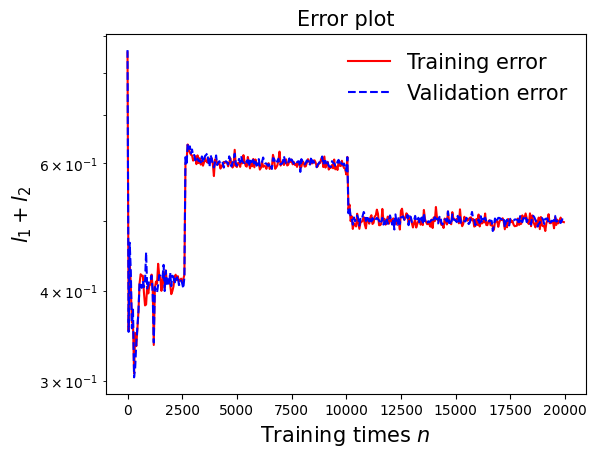

In [66]:
draw_loss(model3)

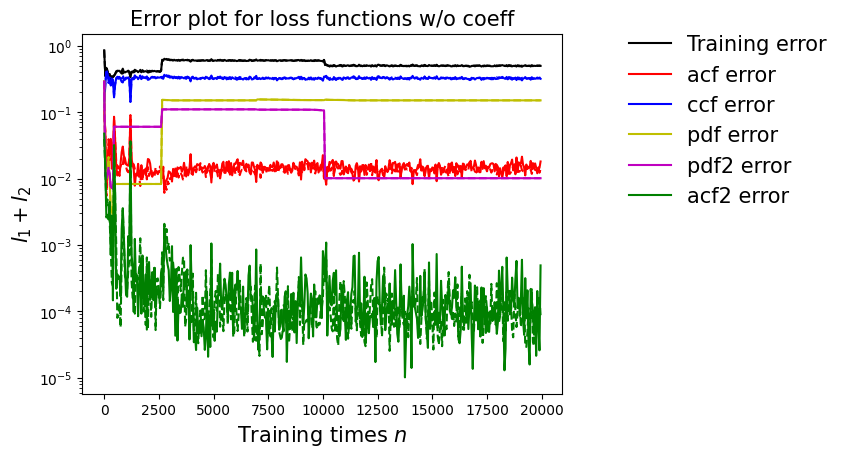

In [67]:
draw_errors(model3)

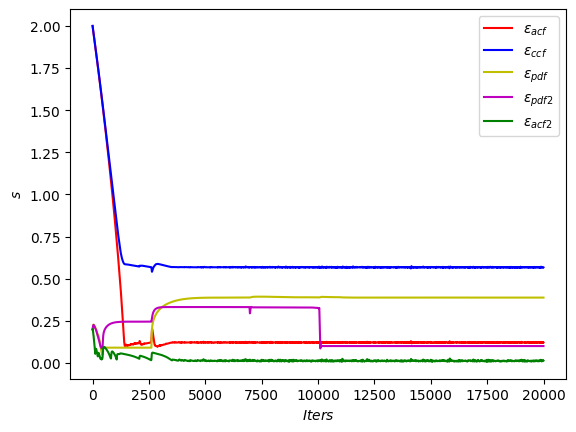

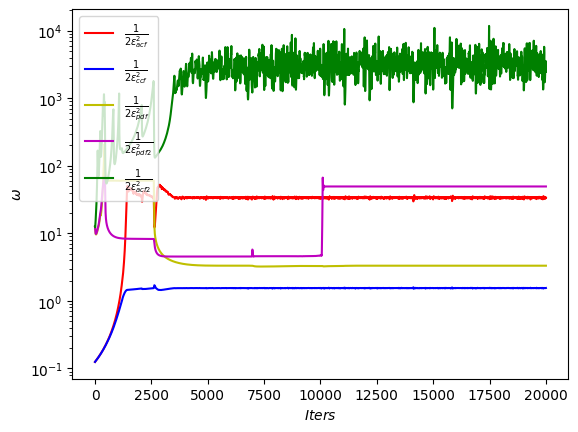

In [68]:
draw_adaptive_w(model3)
draw_epoch_w(model3)

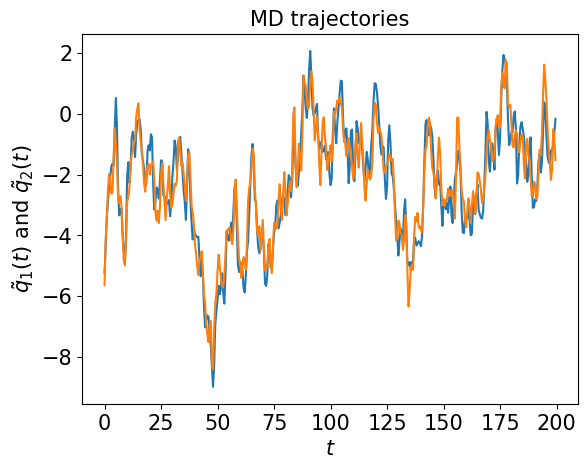

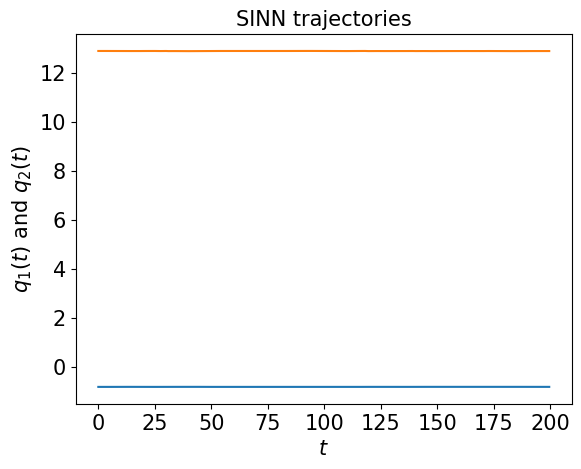

In [69]:
test1(model3)

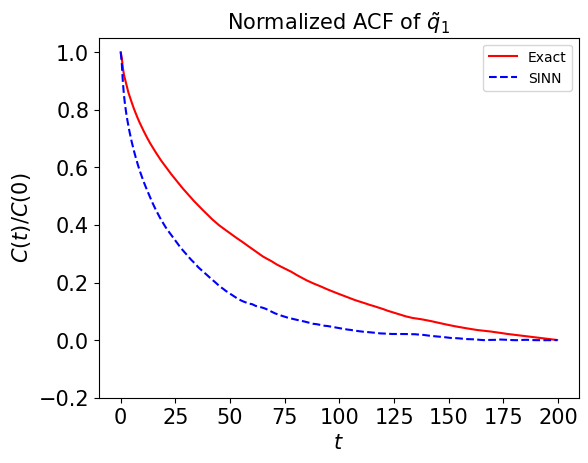

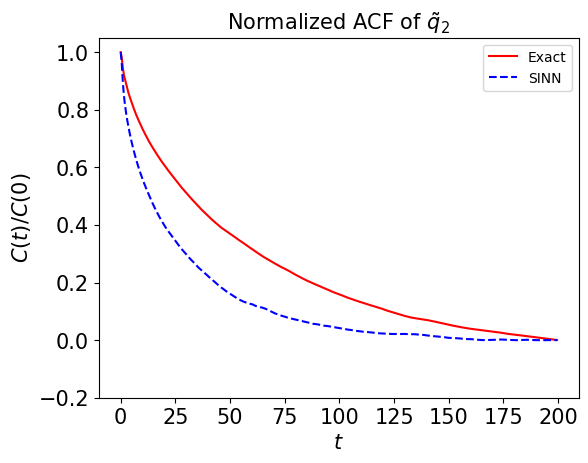

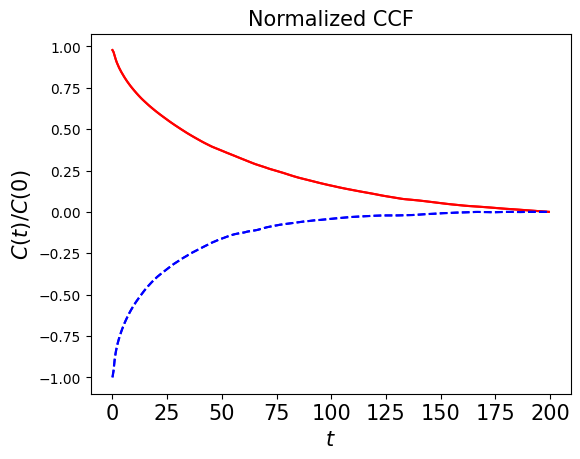

In [70]:
test2(model3)

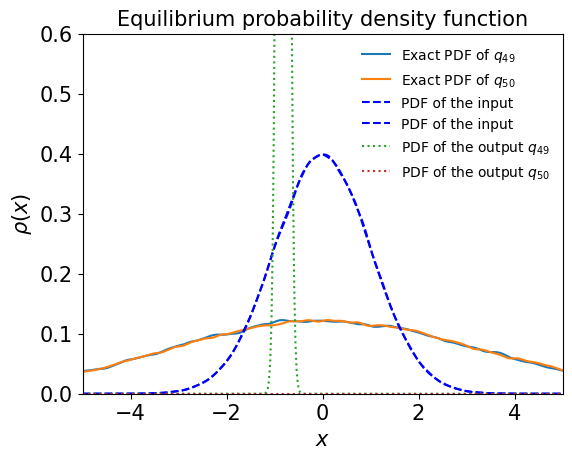

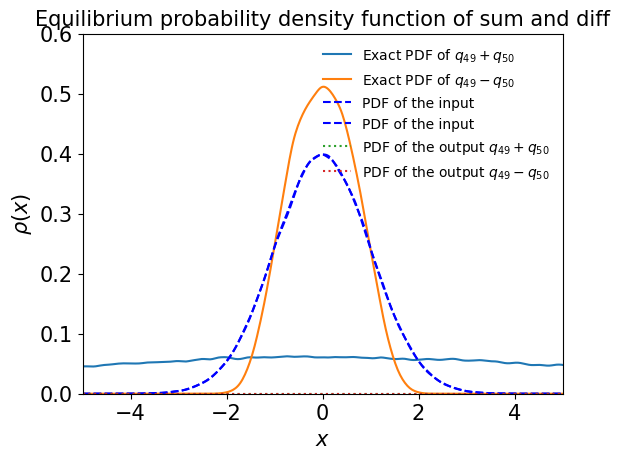

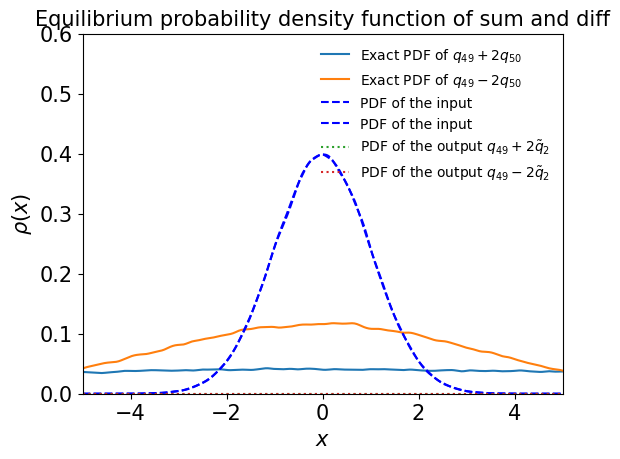

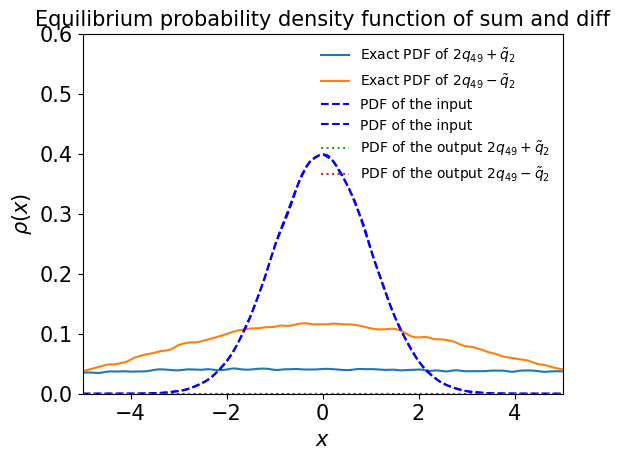

In [71]:
test3(model3)

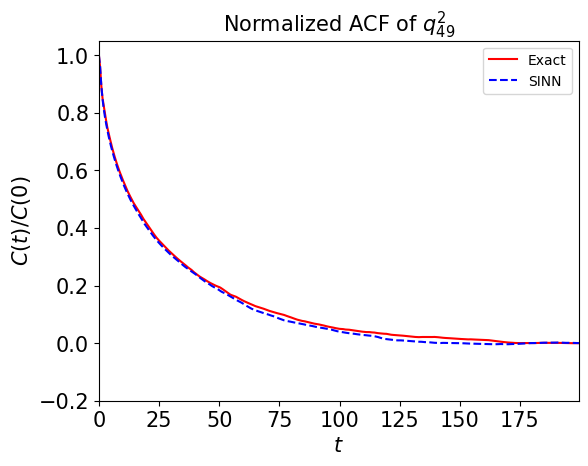

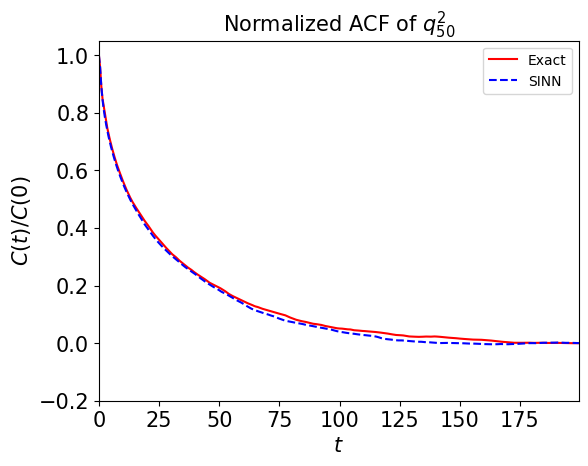

In [72]:
test4(model3)

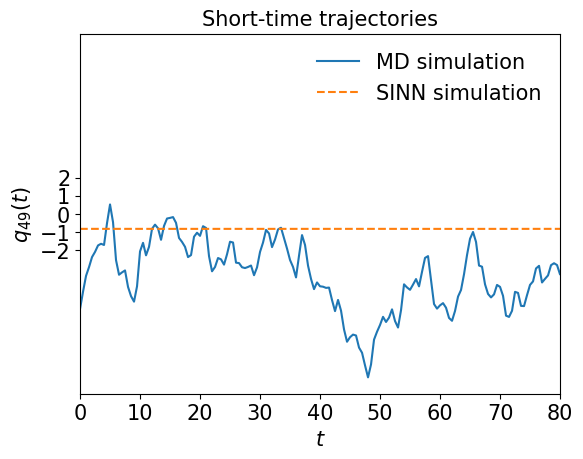

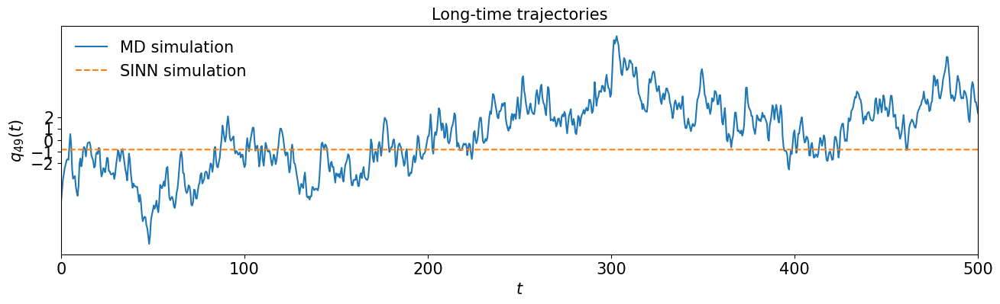

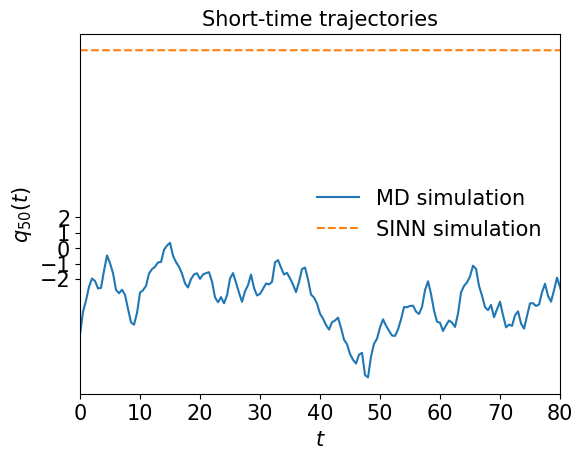

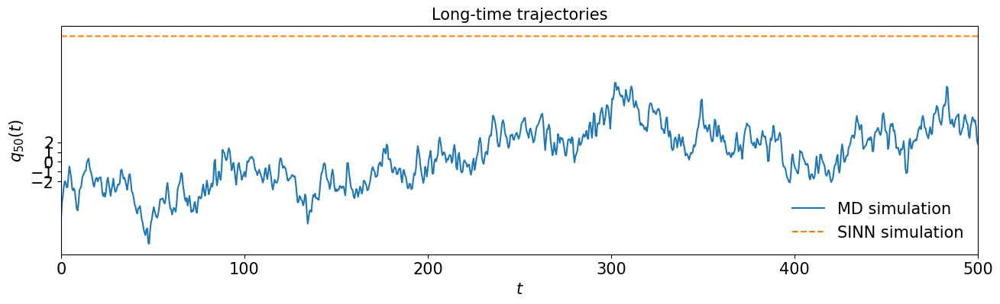

In [73]:
test5(model3)

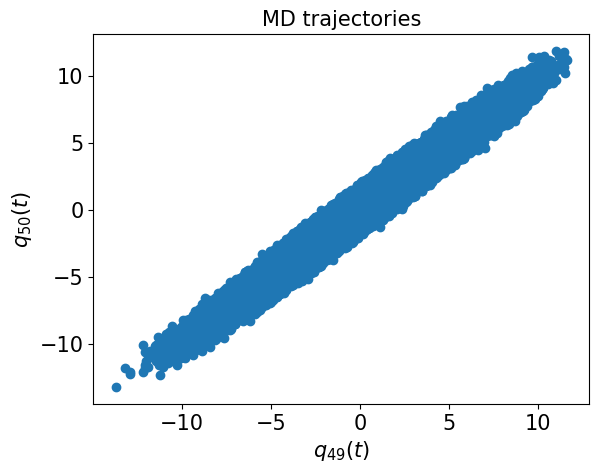

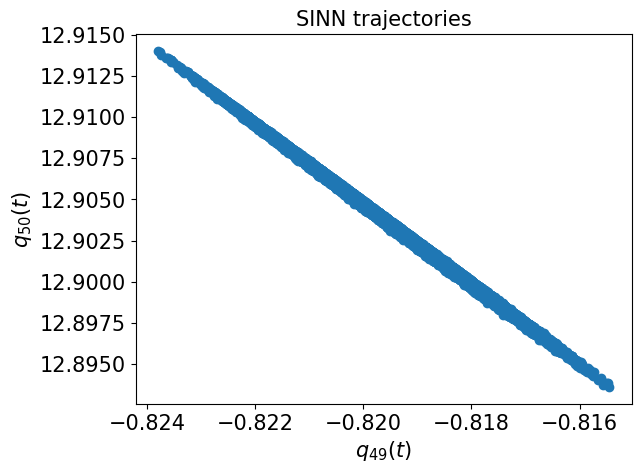

In [74]:
test6(model3)

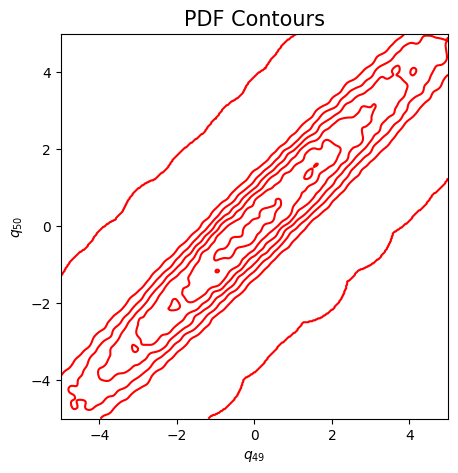

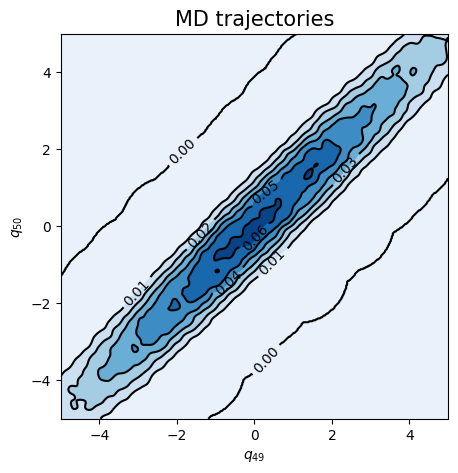

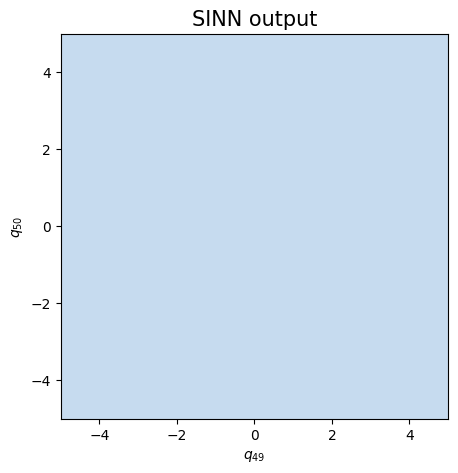

In [75]:
test7(model3)

In [76]:
### Defining SINN model
net4 = SINN(2, 100, 4, 2).to(device) # input dimension, hidden size, number of layers, output dimension
model4 = Model(net=net4)
model4.train()

[0]-th step loss: 0.8504, 0.8263, acf: 0.09636, ccf: 0.10655, pdf: 0.29320, pdf2: 0.28988, acf2: 0.04034
[50]-th step loss: 0.1421, 0.1360, acf: 0.05161, ccf: 0.05150, pdf: 0.00915, pdf2: 0.00710, acf2: 0.01662
[100]-th step loss: 0.0548, 0.1058, acf: 0.03216, ccf: 0.03209, pdf: 0.01339, pdf2: 0.01488, acf2: 0.01329
[150]-th step loss: 0.2467, 0.2429, acf: 0.08327, ccf: 0.08310, pdf: 0.00829, pdf2: 0.03729, acf2: 0.03091
[200]-th step loss: 0.0549, 0.0473, acf: 0.01587, ccf: 0.01603, pdf: 0.00829, pdf2: 0.00480, acf2: 0.00226
[250]-th step loss: 0.0520, 0.0394, acf: 0.01314, ccf: 0.01329, pdf: 0.00829, pdf2: 0.00388, acf2: 0.00076
[300]-th step loss: 0.0403, 0.0382, acf: 0.01265, ccf: 0.01264, pdf: 0.00829, pdf2: 0.00412, acf2: 0.00054
[350]-th step loss: 0.0466, 0.0289, acf: 0.00758, ccf: 0.00765, pdf: 0.00829, pdf2: 0.00381, acf2: 0.00161
[400]-th step loss: 0.0563, 0.0529, acf: 0.01980, ccf: 0.01983, pdf: 0.00823, pdf2: 0.00420, acf2: 0.00081
[450]-th step loss: 0.0467, 0.0376, acf:

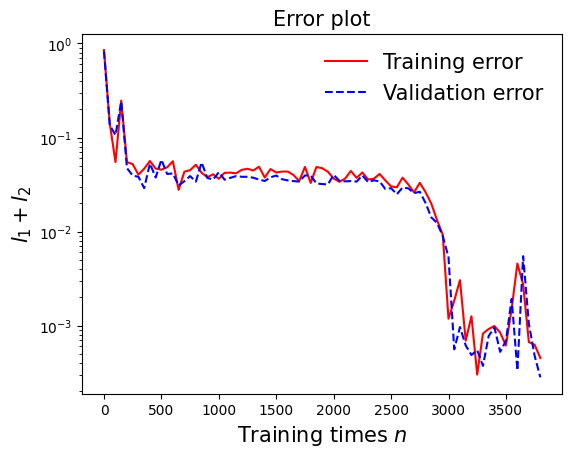

In [77]:
draw_loss(model4)

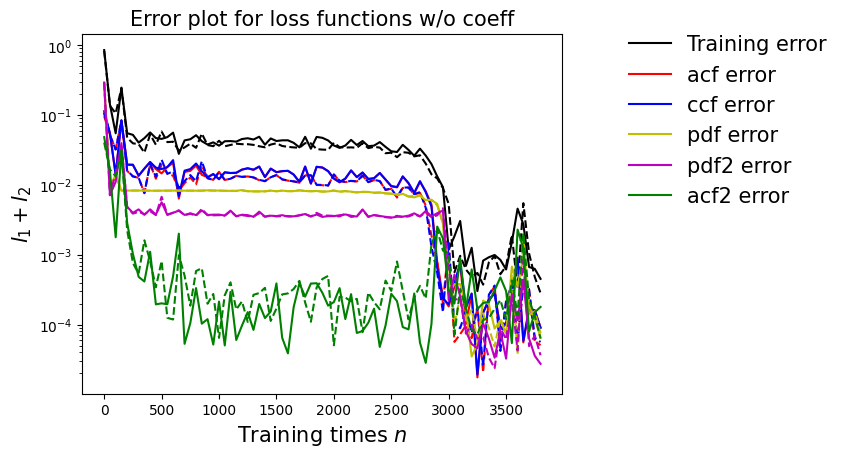

In [78]:
draw_errors(model4)

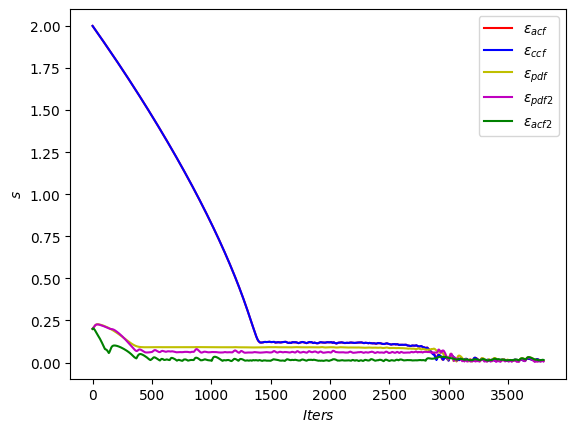

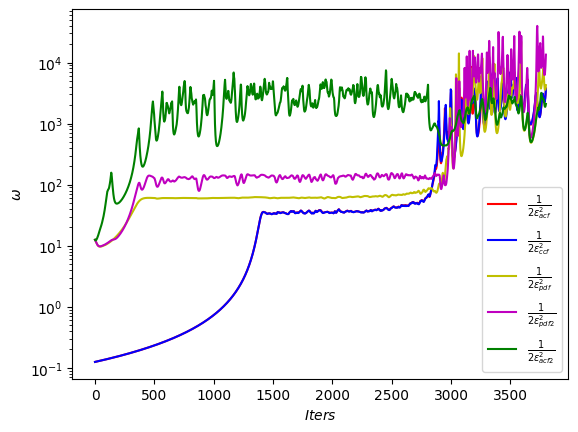

In [79]:
draw_adaptive_w(model4)
draw_epoch_w(model4)

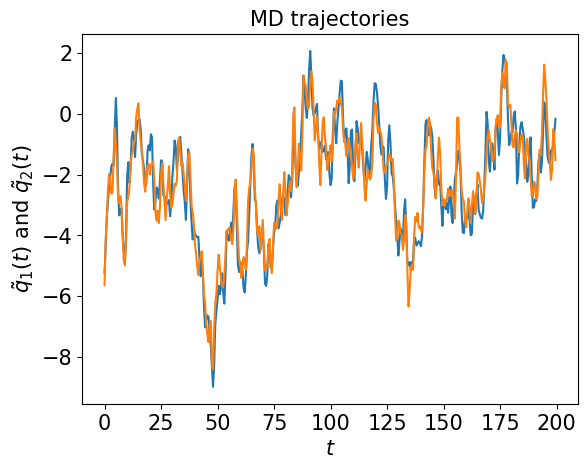

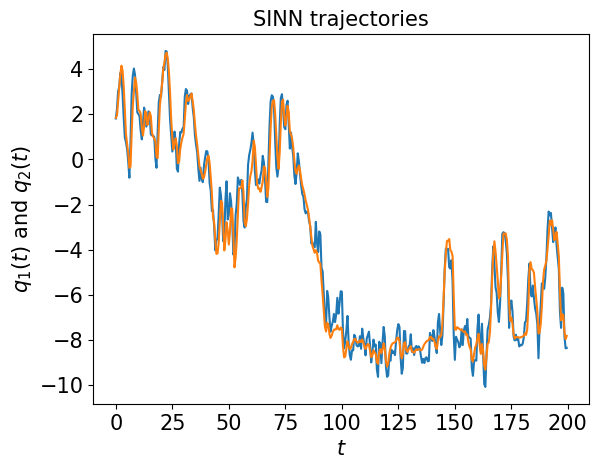

In [80]:
test1(model4)

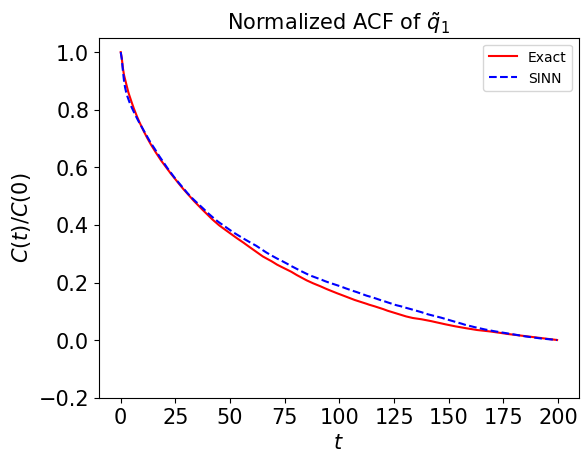

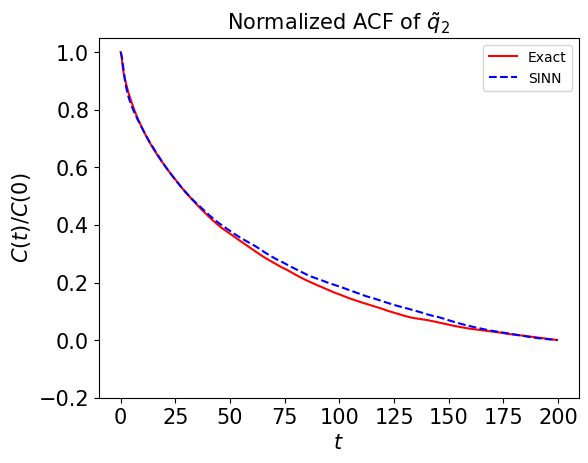

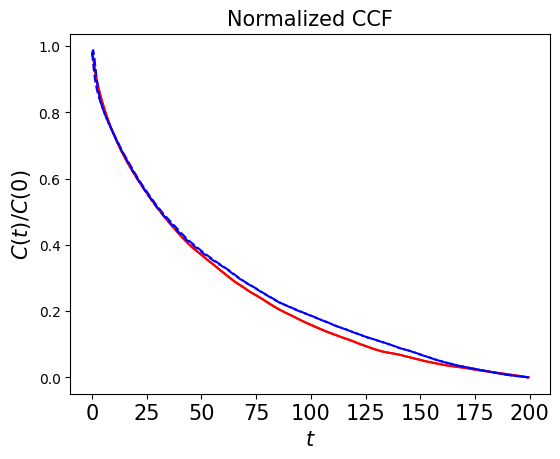

In [81]:
test2(model4)

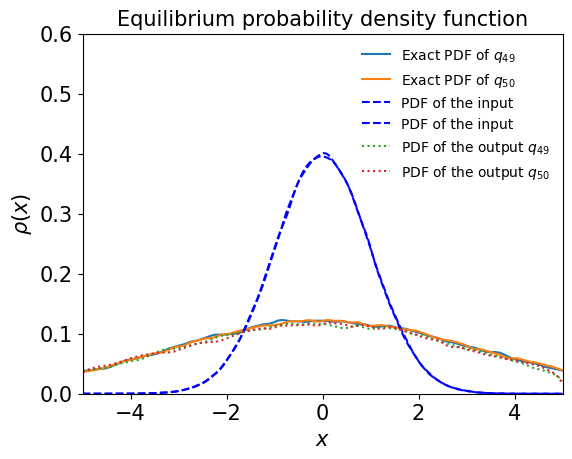

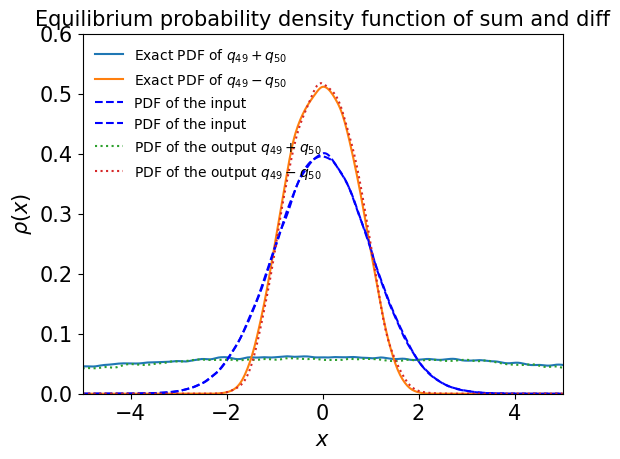

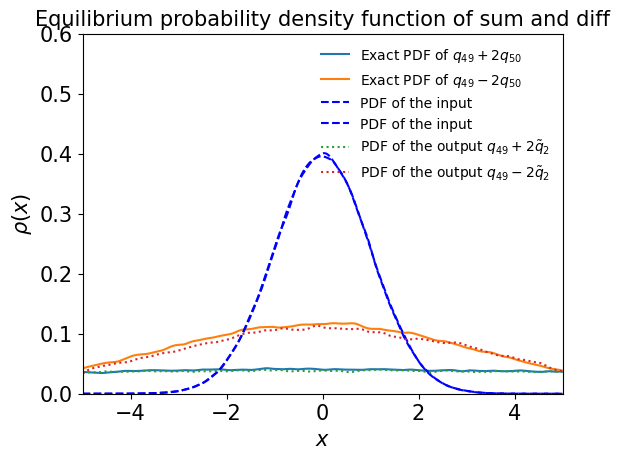

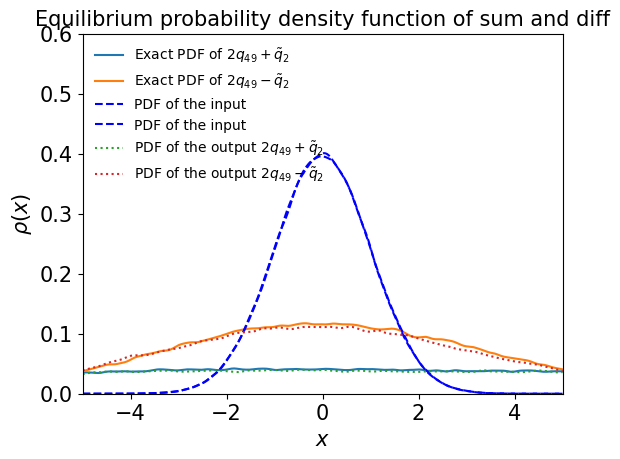

In [82]:
test3(model4)

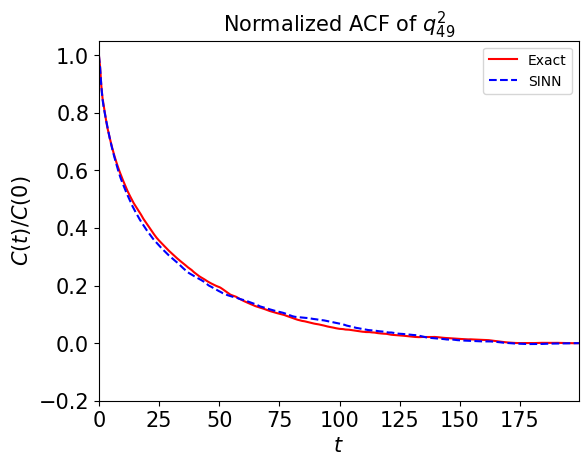

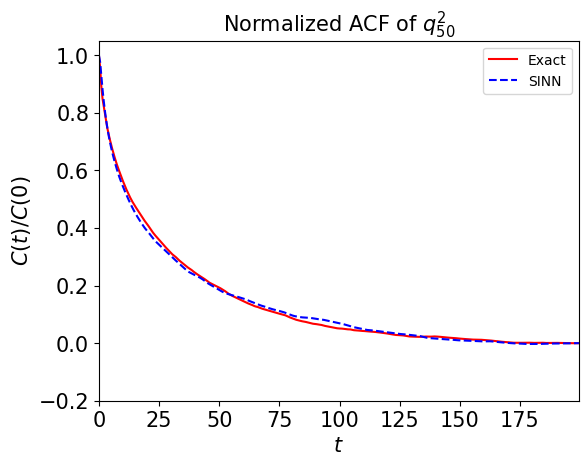

In [83]:
test4(model4)

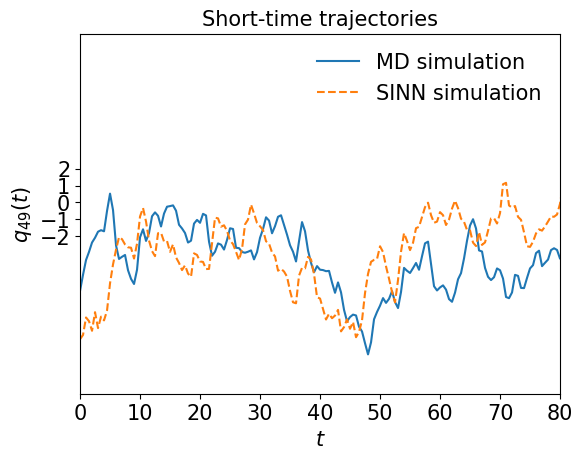

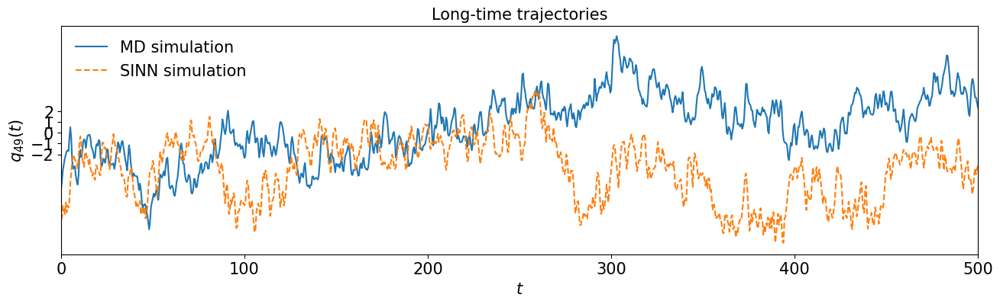

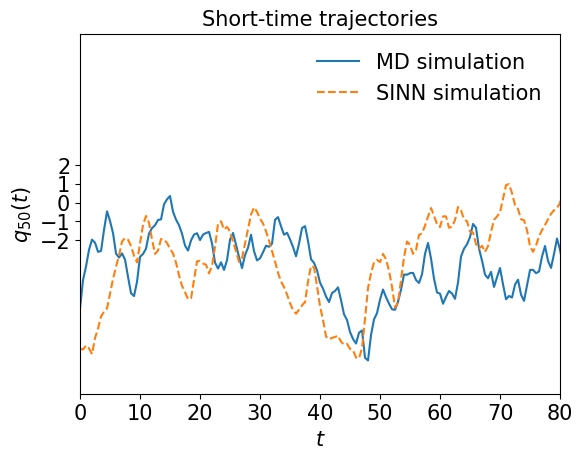

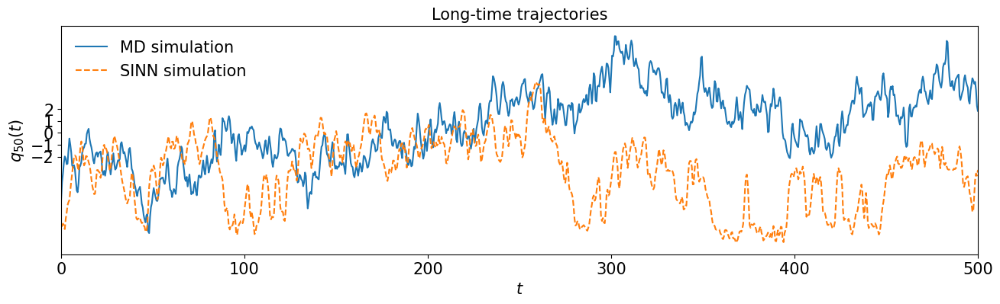

In [84]:
test5(model4)

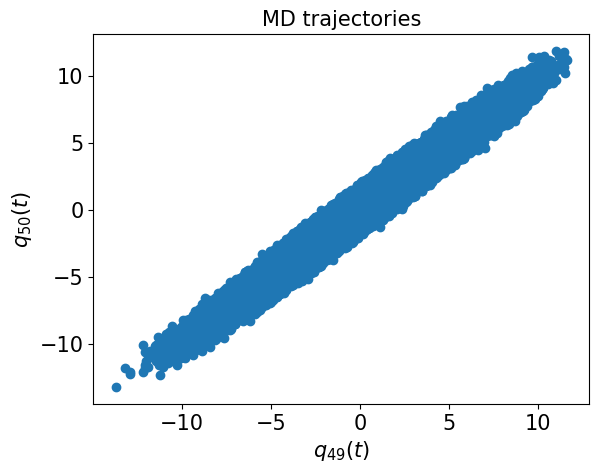

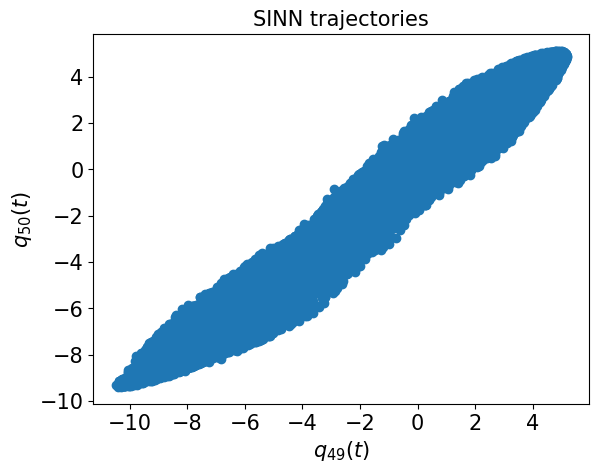

In [85]:
test6(model4)

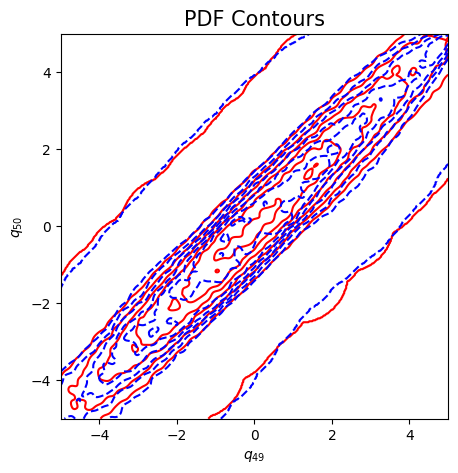

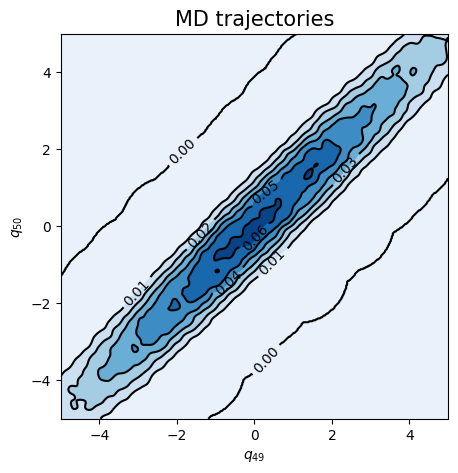

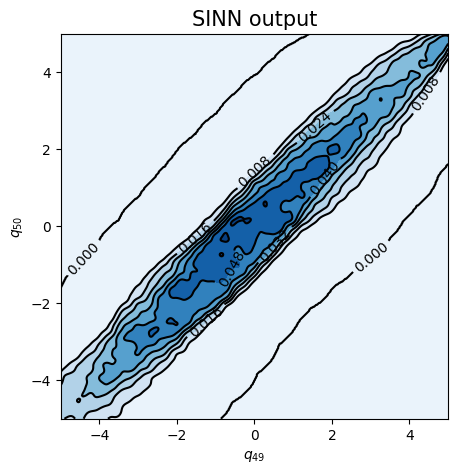

In [86]:
test7(model4)

In [87]:
### Defining SINN model
net5 = SINN(2, 100, 4, 2).to(device) # input dimension, hidden size, number of layers, output dimension
model5 = Model(net=net5)
model5.train()

[0]-th step loss: 0.8286, 0.8145, acf: 0.09499, ccf: 0.09721, pdf: 0.29321, pdf2: 0.28988, acf2: 0.03921
[50]-th step loss: 0.0937, 0.0633, acf: 0.01060, ccf: 0.01057, pdf: 0.02268, pdf2: 0.01447, acf2: 0.00502
[100]-th step loss: 0.3533, 0.3498, acf: 0.03922, ccf: 0.03925, pdf: 0.15297, pdf2: 0.11016, acf2: 0.00817
[150]-th step loss: 0.6031, 0.6063, acf: 0.01793, ccf: 0.32516, pdf: 0.15232, pdf2: 0.11026, acf2: 0.00063
[200]-th step loss: 0.5865, 0.5832, acf: 0.02294, ccf: 0.29690, pdf: 0.15223, pdf2: 0.11023, acf2: 0.00093
[250]-th step loss: 0.5903, 0.5911, acf: 0.01920, ccf: 0.30924, pdf: 0.15199, pdf2: 0.11026, acf2: 0.00039
[300]-th step loss: 0.6048, 0.6044, acf: 0.01490, ccf: 0.32722, pdf: 0.15198, pdf2: 0.11018, acf2: 0.00014
[350]-th step loss: 0.6033, 0.5971, acf: 0.01621, ccf: 0.31881, pdf: 0.15205, pdf2: 0.10993, acf2: 0.00011
[400]-th step loss: 0.6088, 0.5955, acf: 0.01518, ccf: 0.31830, pdf: 0.15207, pdf2: 0.10985, acf2: 0.00014
[450]-th step loss: 0.6026, 0.5926, acf:

[3850]-th step loss: 0.5888, 0.5922, acf: 0.01747, ccf: 0.31315, pdf: 0.15196, pdf2: 0.10943, acf2: 0.00015
[3900]-th step loss: 0.6011, 0.6007, acf: 0.01421, ccf: 0.32509, pdf: 0.15196, pdf2: 0.10938, acf2: 0.00006
[3950]-th step loss: 0.6050, 0.6009, acf: 0.01490, ccf: 0.32476, pdf: 0.15196, pdf2: 0.10925, acf2: 0.00007
[4000]-th step loss: 0.5847, 0.5840, acf: 0.02006, ccf: 0.30236, pdf: 0.15192, pdf2: 0.10919, acf2: 0.00045
[4050]-th step loss: 0.5903, 0.5923, acf: 0.01604, ccf: 0.31493, pdf: 0.15193, pdf2: 0.10926, acf2: 0.00009
[4100]-th step loss: 0.6041, 0.5928, acf: 0.01624, ccf: 0.31534, pdf: 0.15190, pdf2: 0.10922, acf2: 0.00008
[4150]-th step loss: 0.6001, 0.6060, acf: 0.01282, ccf: 0.33178, pdf: 0.15198, pdf2: 0.10931, acf2: 0.00012
[4200]-th step loss: 0.6074, 0.6014, acf: 0.01471, ccf: 0.32557, pdf: 0.15188, pdf2: 0.10917, acf2: 0.00005
[4250]-th step loss: 0.6005, 0.5952, acf: 0.01685, ccf: 0.31721, pdf: 0.15190, pdf2: 0.10910, acf2: 0.00010
[4300]-th step loss: 0.6056,

[7650]-th step loss: 0.5952, 0.5990, acf: 0.01513, ccf: 0.32646, pdf: 0.15125, pdf2: 0.10604, acf2: 0.00009
[7700]-th step loss: 0.5955, 0.5919, acf: 0.01537, ccf: 0.31865, pdf: 0.15120, pdf2: 0.10665, acf2: 0.00003
[7750]-th step loss: 0.5976, 0.5999, acf: 0.01323, ccf: 0.32903, pdf: 0.15121, pdf2: 0.10633, acf2: 0.00006
[7800]-th step loss: 0.6021, 0.5993, acf: 0.01383, ccf: 0.32800, pdf: 0.15113, pdf2: 0.10630, acf2: 0.00007
[7850]-th step loss: 0.5010, 0.5049, acf: 0.01257, ccf: 0.33219, pdf: 0.14982, pdf2: 0.01013, acf2: 0.00015
[7900]-th step loss: 0.4932, 0.4928, acf: 0.01628, ccf: 0.31654, pdf: 0.14975, pdf2: 0.01013, acf2: 0.00007
[7950]-th step loss: 0.4931, 0.5016, acf: 0.01466, ccf: 0.32697, pdf: 0.14979, pdf2: 0.01013, acf2: 0.00006
[8000]-th step loss: 0.4865, 0.4918, acf: 0.01634, ccf: 0.31506, pdf: 0.15016, pdf2: 0.01013, acf2: 0.00009
[8050]-th step loss: 0.4964, 0.4917, acf: 0.01688, ccf: 0.31465, pdf: 0.14992, pdf2: 0.01013, acf2: 0.00008
[8100]-th step loss: 0.4961,

[11450]-th step loss: 0.4874, 0.4954, acf: 0.01652, ccf: 0.32000, pdf: 0.14867, pdf2: 0.01013, acf2: 0.00013
[11500]-th step loss: 0.4930, 0.4961, acf: 0.01466, ccf: 0.32208, pdf: 0.14912, pdf2: 0.01013, acf2: 0.00006
[11550]-th step loss: 0.5017, 0.4969, acf: 0.01445, ccf: 0.32298, pdf: 0.14921, pdf2: 0.01013, acf2: 0.00009
[11600]-th step loss: 0.5003, 0.4979, acf: 0.01496, ccf: 0.32400, pdf: 0.14871, pdf2: 0.01013, acf2: 0.00006
[11650]-th step loss: 0.4943, 0.5006, acf: 0.01373, ccf: 0.32781, pdf: 0.14888, pdf2: 0.01013, acf2: 0.00007
[11700]-th step loss: 0.4915, 0.4971, acf: 0.01464, ccf: 0.32344, pdf: 0.14881, pdf2: 0.01013, acf2: 0.00006
[11750]-th step loss: 0.4856, 0.4938, acf: 0.01550, ccf: 0.31901, pdf: 0.14910, pdf2: 0.01013, acf2: 0.00005
[11800]-th step loss: 0.4925, 0.5008, acf: 0.01331, ccf: 0.32845, pdf: 0.14887, pdf2: 0.01013, acf2: 0.00009
[11850]-th step loss: 0.5080, 0.4917, acf: 0.01511, ccf: 0.31722, pdf: 0.14913, pdf2: 0.01013, acf2: 0.00014
[11900]-th step los

[15250]-th step loss: 0.4967, 0.4952, acf: 0.01403, ccf: 0.32660, pdf: 0.14440, pdf2: 0.01013, acf2: 0.00004
[15300]-th step loss: 0.4999, 0.4983, acf: 0.01263, ccf: 0.33131, pdf: 0.14409, pdf2: 0.01013, acf2: 0.00013
[15350]-th step loss: 0.4922, 0.4875, acf: 0.01560, ccf: 0.31829, pdf: 0.14342, pdf2: 0.01013, acf2: 0.00005
[15400]-th step loss: 0.4918, 0.4986, acf: 0.01257, ccf: 0.33218, pdf: 0.14355, pdf2: 0.01013, acf2: 0.00013
[15450]-th step loss: 0.4913, 0.4950, acf: 0.01353, ccf: 0.32884, pdf: 0.14246, pdf2: 0.01013, acf2: 0.00006
[15500]-th step loss: 0.4840, 0.4931, acf: 0.01363, ccf: 0.32708, pdf: 0.14222, pdf2: 0.01013, acf2: 0.00005
[15550]-th step loss: 0.4914, 0.4983, acf: 0.01271, ccf: 0.33266, pdf: 0.14268, pdf2: 0.01013, acf2: 0.00013
[15600]-th step loss: 0.4978, 0.4888, acf: 0.01445, ccf: 0.32055, pdf: 0.14364, pdf2: 0.01013, acf2: 0.00008
[15650]-th step loss: 0.4952, 0.4942, acf: 0.01408, ccf: 0.32756, pdf: 0.14236, pdf2: 0.01013, acf2: 0.00004
[15700]-th step los

[19050]-th step loss: 0.4653, 0.4580, acf: 0.01519, ccf: 0.32138, pdf: 0.11129, pdf2: 0.01013, acf2: 0.00005
[19100]-th step loss: 0.4616, 0.4604, acf: 0.01353, ccf: 0.33053, pdf: 0.10617, pdf2: 0.01013, acf2: 0.00006
[19150]-th step loss: 0.4503, 0.4527, acf: 0.01508, ccf: 0.32443, pdf: 0.10300, pdf2: 0.01013, acf2: 0.00005
[19200]-th step loss: 0.4572, 0.4576, acf: 0.01345, ccf: 0.33075, pdf: 0.10323, pdf2: 0.01013, acf2: 0.00006
[19250]-th step loss: 0.4492, 0.4480, acf: 0.01548, ccf: 0.32086, pdf: 0.10153, pdf2: 0.01013, acf2: 0.00004
[19300]-th step loss: 0.4404, 0.4443, acf: 0.01672, ccf: 0.31603, pdf: 0.10137, pdf2: 0.01013, acf2: 0.00010
[19350]-th step loss: 0.4535, 0.4522, acf: 0.01447, ccf: 0.32634, pdf: 0.10124, pdf2: 0.01013, acf2: 0.00003
[19400]-th step loss: 0.4564, 0.4498, acf: 0.01426, ccf: 0.32636, pdf: 0.09902, pdf2: 0.01013, acf2: 0.00003
[19450]-th step loss: 0.4489, 0.4574, acf: 0.01276, ccf: 0.33121, pdf: 0.10322, pdf2: 0.01013, acf2: 0.00008
[19500]-th step los

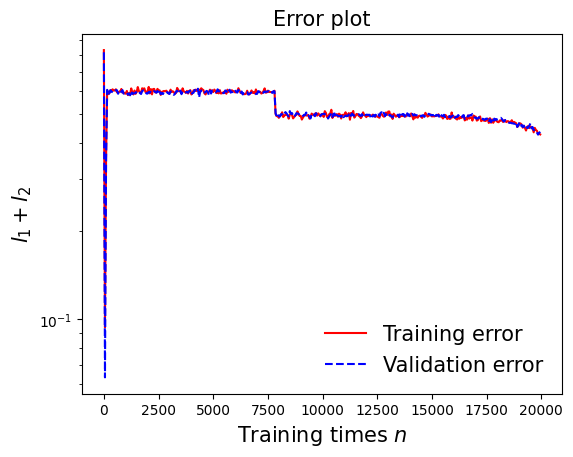

In [88]:
draw_loss(model5)

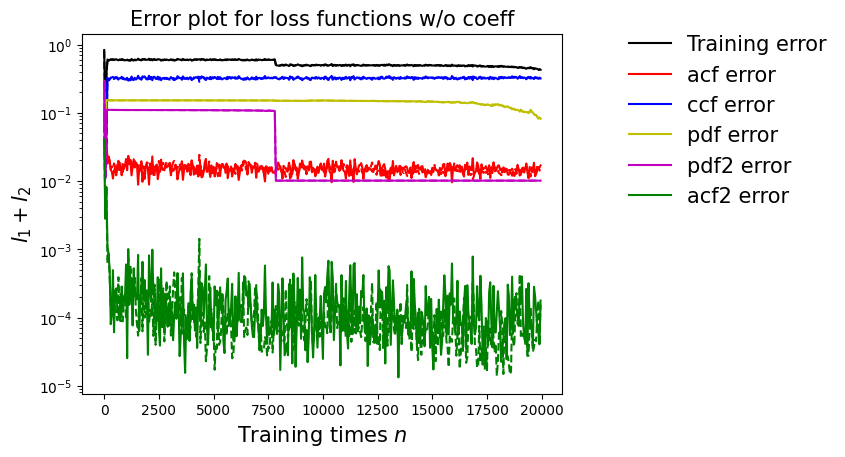

In [89]:
draw_errors(model5)

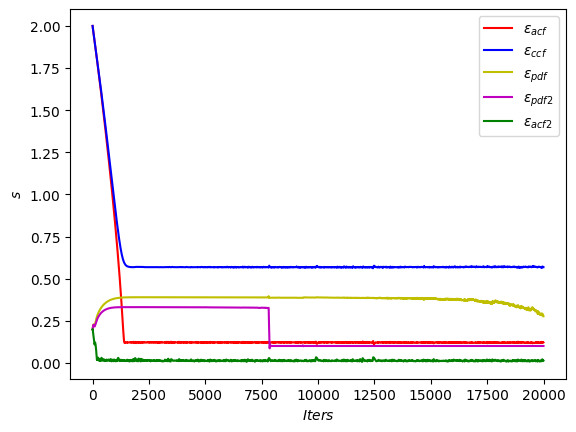

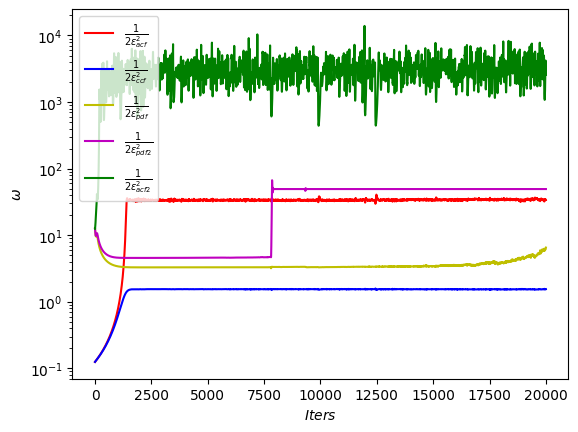

In [90]:
draw_adaptive_w(model5)
draw_epoch_w(model5)

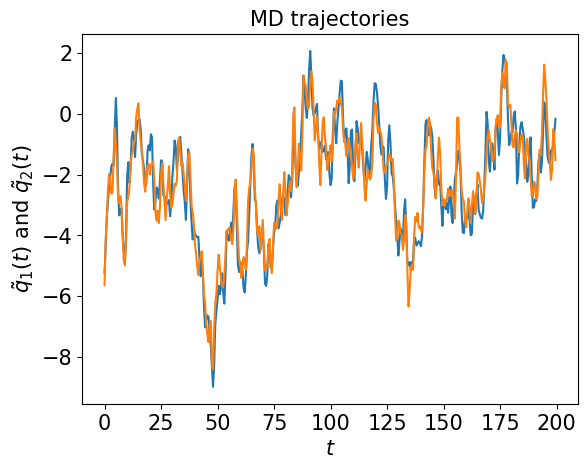

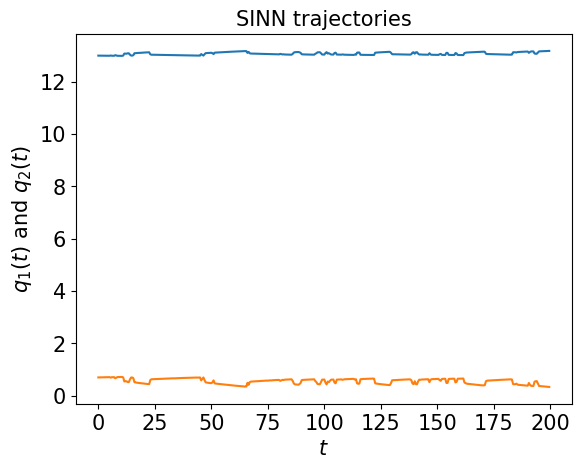

In [91]:
test1(model5)

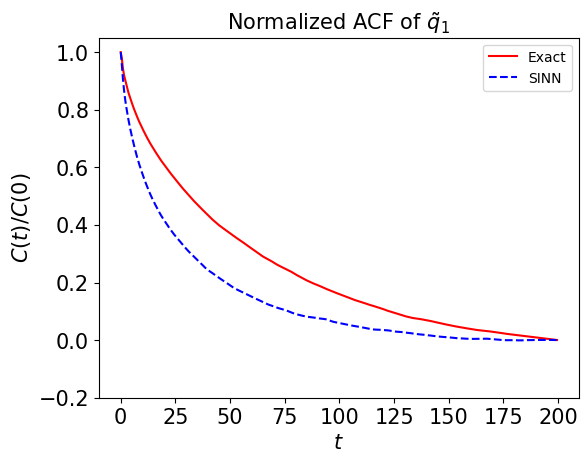

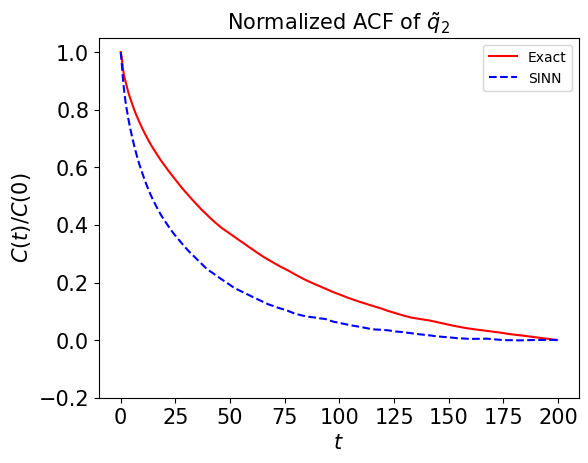

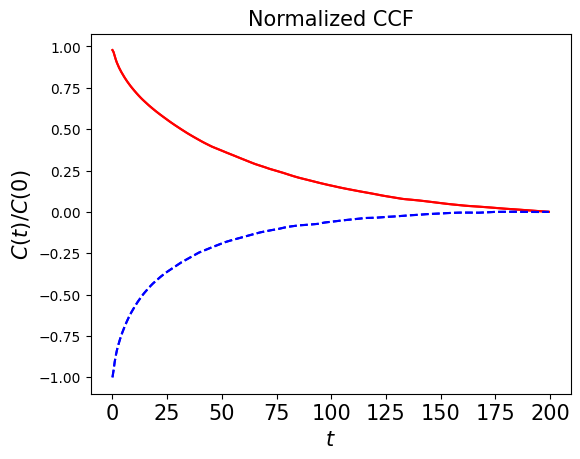

In [92]:
test2(model5)

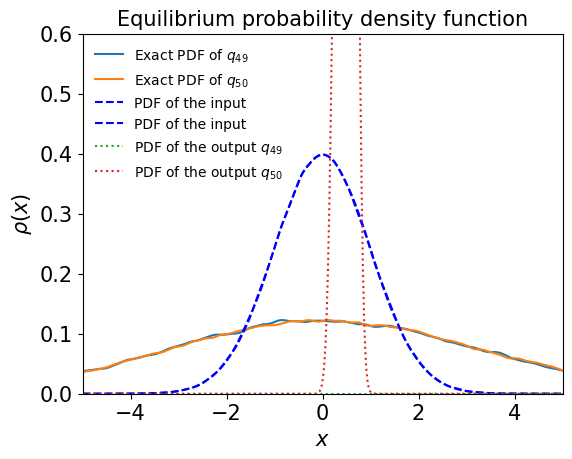

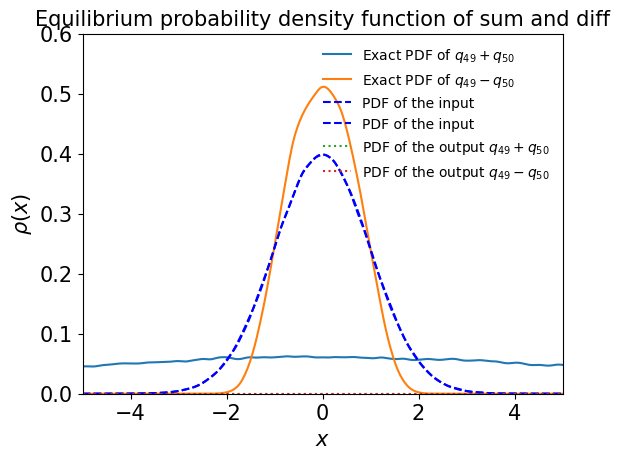

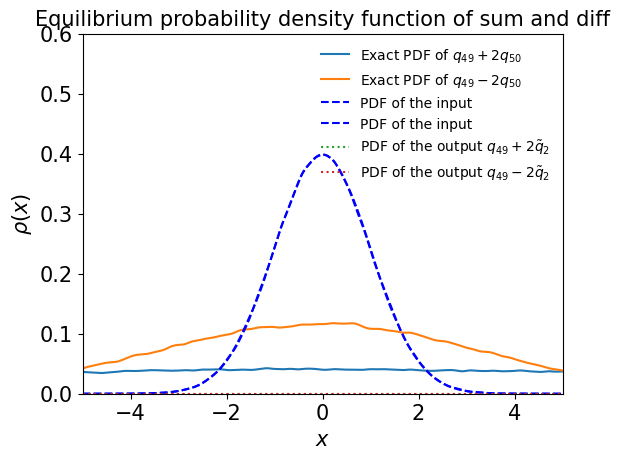

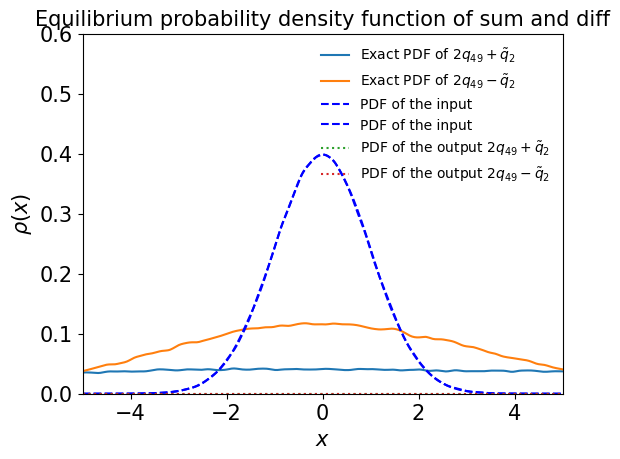

In [93]:
test3(model5)

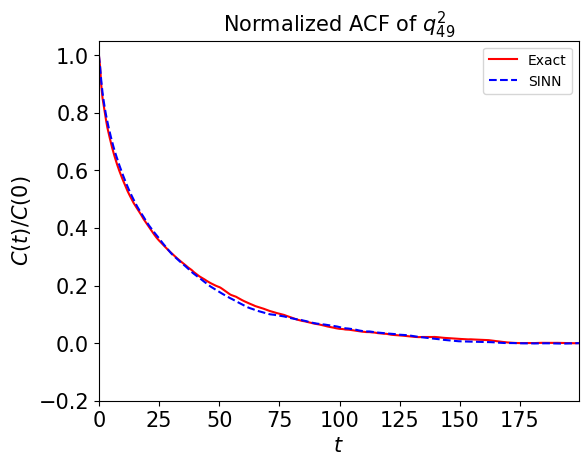

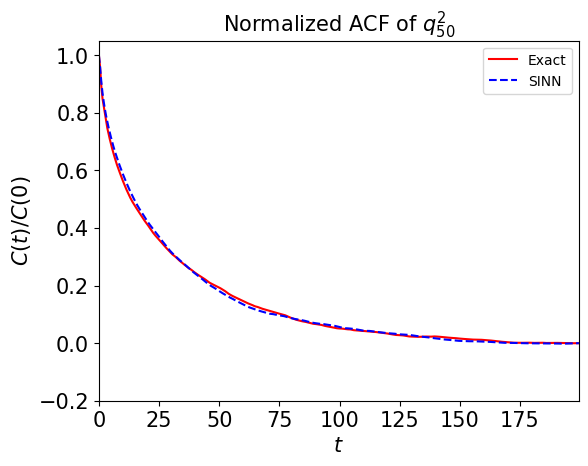

In [94]:
test4(model5)

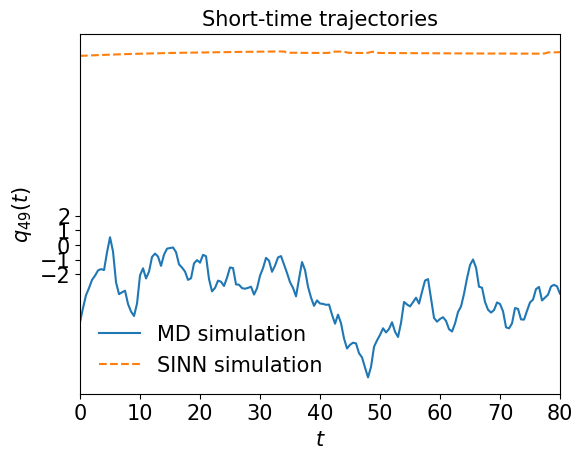

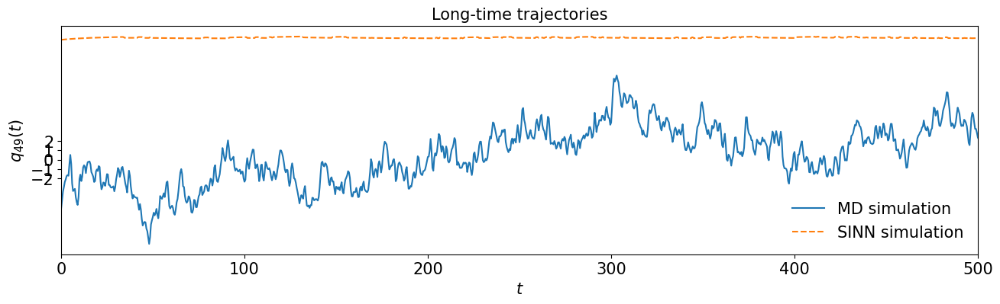

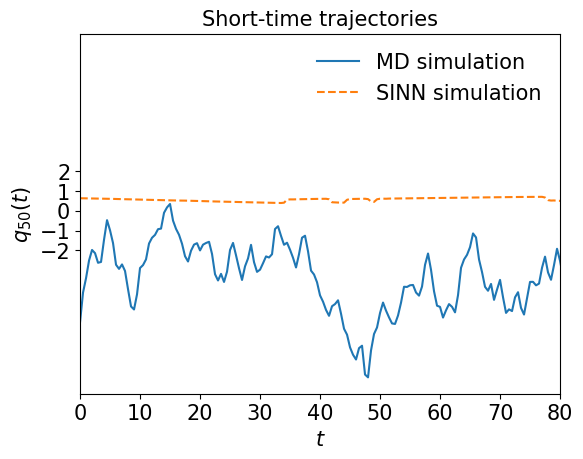

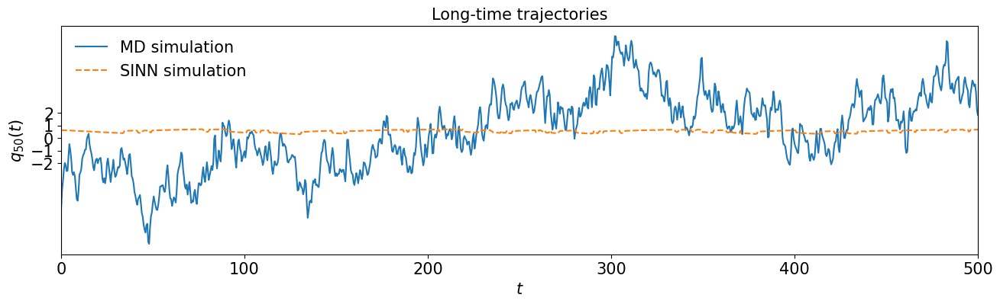

In [95]:
test5(model5)

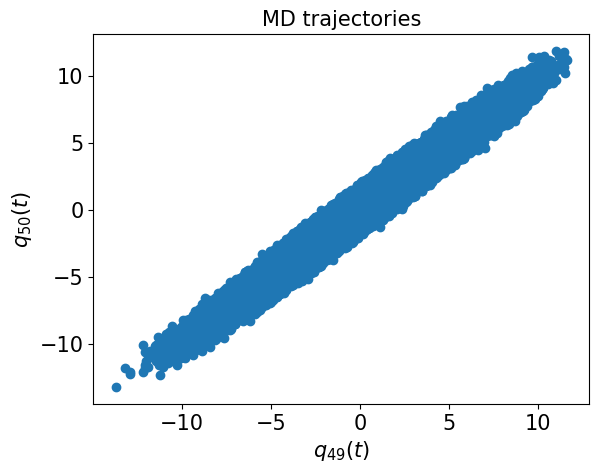

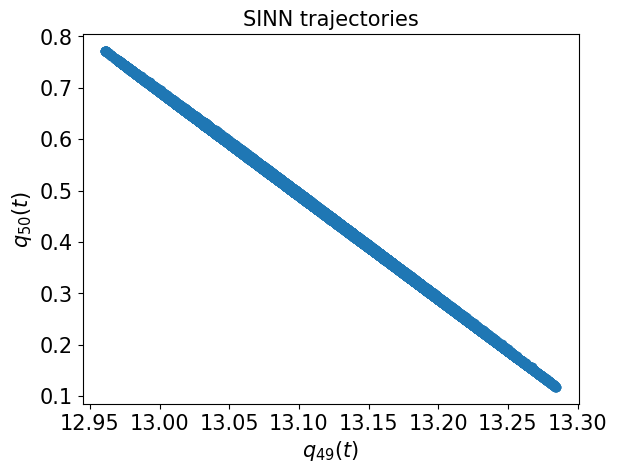

In [96]:
test6(model5)

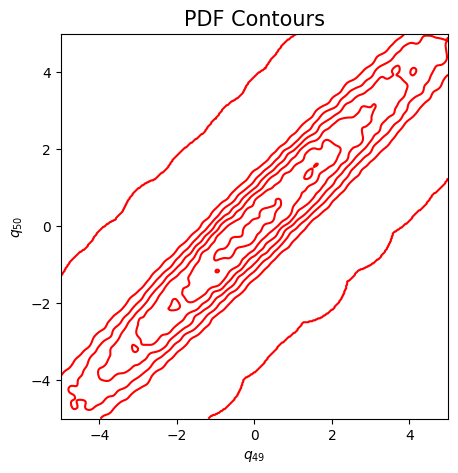

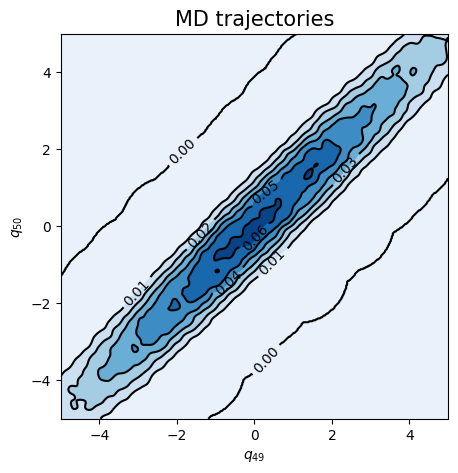

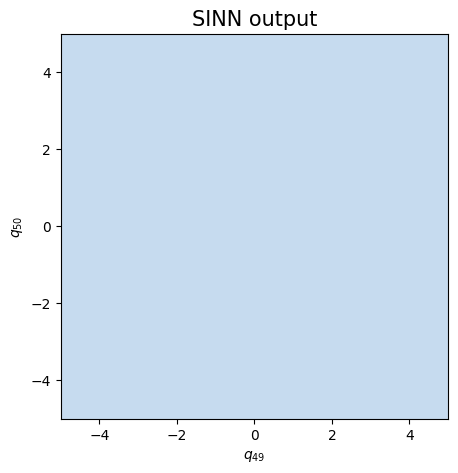

In [97]:
test7(model5)

In [98]:
### Defining SINN model
net6 = SINN(2, 100, 4, 2).to(device) # input dimension, hidden size, number of layers, output dimension
model6 = Model(net=net6)
model6.train()

[0]-th step loss: 0.8370, 0.8313, acf: 0.09557, ccf: 0.11285, pdf: 0.29321, pdf2: 0.28989, acf2: 0.03979
[50]-th step loss: 0.1083, 0.1072, acf: 0.03782, ccf: 0.03775, pdf: 0.01147, pdf2: 0.00837, acf2: 0.01175
[100]-th step loss: 0.0342, 0.0294, acf: 0.01008, ccf: 0.01006, pdf: 0.00382, pdf2: 0.00362, acf2: 0.00177
[150]-th step loss: 0.0470, 0.0342, acf: 0.00333, ccf: 0.00333, pdf: 0.01372, pdf2: 0.01128, acf2: 0.00257
[200]-th step loss: 0.0743, 0.0695, acf: 0.03050, ccf: 0.03043, pdf: 0.00144, pdf2: 0.00338, acf2: 0.00377
[250]-th step loss: 0.0395, 0.0318, acf: 0.01042, ccf: 0.01039, pdf: 0.00494, pdf2: 0.00543, acf2: 0.00059
[300]-th step loss: 0.0173, 0.0203, acf: 0.00751, ccf: 0.00738, pdf: 0.00306, pdf2: 0.00189, acf2: 0.00042
[350]-th step loss: 0.0142, 0.0214, acf: 0.00943, ccf: 0.00941, pdf: 0.00128, pdf2: 0.00101, acf2: 0.00022
[400]-th step loss: 0.0788, 0.0769, acf: 0.03578, ccf: 0.03586, pdf: 0.00048, pdf2: 0.00143, acf2: 0.00336
[450]-th step loss: 0.0328, 0.0290, acf:

[3850]-th step loss: 0.0570, 0.0515, acf: 0.02290, ccf: 0.02284, pdf: 0.00375, pdf2: 0.00185, acf2: 0.00014
[3900]-th step loss: 0.0551, 0.0501, acf: 0.02236, ccf: 0.02230, pdf: 0.00358, pdf2: 0.00171, acf2: 0.00014
[3950]-th step loss: 0.0476, 0.0487, acf: 0.02181, ccf: 0.02175, pdf: 0.00341, pdf2: 0.00162, acf2: 0.00013
[4000]-th step loss: 0.0491, 0.0475, acf: 0.02132, ccf: 0.02126, pdf: 0.00325, pdf2: 0.00153, acf2: 0.00013
[4050]-th step loss: 0.0452, 0.0465, acf: 0.02093, ccf: 0.02087, pdf: 0.00311, pdf2: 0.00142, acf2: 0.00013
[4100]-th step loss: 0.0604, 0.0454, acf: 0.02052, ccf: 0.02046, pdf: 0.00296, pdf2: 0.00134, acf2: 0.00013
[4150]-th step loss: 0.0515, 0.0445, acf: 0.02016, ccf: 0.02010, pdf: 0.00283, pdf2: 0.00126, acf2: 0.00013
[4200]-th step loss: 0.0425, 0.0437, acf: 0.01985, ccf: 0.01979, pdf: 0.00270, pdf2: 0.00118, acf2: 0.00013
[4250]-th step loss: 0.0465, 0.0428, acf: 0.01954, ccf: 0.01948, pdf: 0.00256, pdf2: 0.00112, acf2: 0.00013
[4300]-th step loss: 0.0432,

[7650]-th step loss: 0.0318, 0.0290, acf: 0.01409, ccf: 0.01401, pdf: 0.00055, pdf2: 0.00017, acf2: 0.00021
[7700]-th step loss: 0.0322, 0.0289, acf: 0.01400, ccf: 0.01393, pdf: 0.00054, pdf2: 0.00017, acf2: 0.00022
[7750]-th step loss: 0.0332, 0.0287, acf: 0.01394, ccf: 0.01387, pdf: 0.00053, pdf2: 0.00017, acf2: 0.00022
[7800]-th step loss: 0.0340, 0.0286, acf: 0.01389, ccf: 0.01382, pdf: 0.00052, pdf2: 0.00016, acf2: 0.00022
[7850]-th step loss: 0.0341, 0.0284, acf: 0.01380, ccf: 0.01373, pdf: 0.00051, pdf2: 0.00016, acf2: 0.00022
[7900]-th step loss: 0.0294, 0.0282, acf: 0.01371, ccf: 0.01364, pdf: 0.00050, pdf2: 0.00016, acf2: 0.00022
[7950]-th step loss: 0.0286, 0.0281, acf: 0.01361, ccf: 0.01354, pdf: 0.00048, pdf2: 0.00016, acf2: 0.00026
[8000]-th step loss: 0.0324, 0.0280, acf: 0.01361, ccf: 0.01354, pdf: 0.00047, pdf2: 0.00015, acf2: 0.00022
[8050]-th step loss: 0.0352, 0.0279, acf: 0.01354, ccf: 0.01346, pdf: 0.00046, pdf2: 0.00015, acf2: 0.00024
[8100]-th step loss: 0.0349,

[11450]-th step loss: 0.0254, 0.0255, acf: 0.01246, ccf: 0.01240, pdf: 0.00024, pdf2: 0.00007, acf2: 0.00033
[11500]-th step loss: 0.0236, 0.0256, acf: 0.01251, ccf: 0.01245, pdf: 0.00023, pdf2: 0.00007, acf2: 0.00032
[11550]-th step loss: 0.0335, 0.0257, acf: 0.01256, ccf: 0.01250, pdf: 0.00023, pdf2: 0.00006, acf2: 0.00034
[11600]-th step loss: 0.0287, 0.0258, acf: 0.01261, ccf: 0.01255, pdf: 0.00023, pdf2: 0.00006, acf2: 0.00033
[11650]-th step loss: 0.0283, 0.0258, acf: 0.01264, ccf: 0.01258, pdf: 0.00023, pdf2: 0.00006, acf2: 0.00033
[11700]-th step loss: 0.0305, 0.0259, acf: 0.01265, ccf: 0.01259, pdf: 0.00022, pdf2: 0.00006, acf2: 0.00033
[11750]-th step loss: 0.0234, 0.0260, acf: 0.01271, ccf: 0.01264, pdf: 0.00022, pdf2: 0.00006, acf2: 0.00032
[11800]-th step loss: 0.0291, 0.0260, acf: 0.01274, ccf: 0.01267, pdf: 0.00022, pdf2: 0.00006, acf2: 0.00031
[11850]-th step loss: 0.0277, 0.0260, acf: 0.01273, ccf: 0.01266, pdf: 0.00021, pdf2: 0.00007, acf2: 0.00032
[11900]-th step los

[15250]-th step loss: 0.0353, 0.0340, acf: 0.01687, ccf: 0.01679, pdf: 0.00007, pdf2: 0.00001, acf2: 0.00024
[15300]-th step loss: 0.0341, 0.0336, acf: 0.01667, ccf: 0.01659, pdf: 0.00007, pdf2: 0.00001, acf2: 0.00022
[15350]-th step loss: 0.0315, 0.0329, acf: 0.01633, ccf: 0.01625, pdf: 0.00007, pdf2: 0.00002, acf2: 0.00022
[15400]-th step loss: 0.0295, 0.0327, acf: 0.01625, ccf: 0.01617, pdf: 0.00007, pdf2: 0.00002, acf2: 0.00021
[15450]-th step loss: 0.0306, 0.0328, acf: 0.01630, ccf: 0.01622, pdf: 0.00007, pdf2: 0.00001, acf2: 0.00022
[15500]-th step loss: 0.0301, 0.0331, acf: 0.01642, ccf: 0.01635, pdf: 0.00007, pdf2: 0.00001, acf2: 0.00022
[15550]-th step loss: 0.0410, 0.0331, acf: 0.01642, ccf: 0.01634, pdf: 0.00007, pdf2: 0.00002, acf2: 0.00022
[15600]-th step loss: 0.0312, 0.0339, acf: 0.01681, ccf: 0.01673, pdf: 0.00007, pdf2: 0.00002, acf2: 0.00023
[15650]-th step loss: 0.0413, 0.0338, acf: 0.01678, ccf: 0.01670, pdf: 0.00007, pdf2: 0.00001, acf2: 0.00023
[15700]-th step los

[19050]-th step loss: 0.0320, 0.0370, acf: 0.01836, ccf: 0.01828, pdf: 0.00005, pdf2: 0.00001, acf2: 0.00025
[19100]-th step loss: 0.0427, 0.0372, acf: 0.01848, ccf: 0.01839, pdf: 0.00004, pdf2: 0.00001, acf2: 0.00024
[19150]-th step loss: 0.0347, 0.0377, acf: 0.01877, ccf: 0.01868, pdf: 0.00005, pdf2: 0.00001, acf2: 0.00021
[19200]-th step loss: 0.0371, 0.0389, acf: 0.01936, ccf: 0.01928, pdf: 0.00005, pdf2: 0.00001, acf2: 0.00019
[19250]-th step loss: 0.0312, 0.0380, acf: 0.01891, ccf: 0.01883, pdf: 0.00004, pdf2: 0.00001, acf2: 0.00020
[19300]-th step loss: 0.0338, 0.0381, acf: 0.01898, ccf: 0.01889, pdf: 0.00004, pdf2: 0.00001, acf2: 0.00019
[19350]-th step loss: 0.0377, 0.0384, acf: 0.01910, ccf: 0.01902, pdf: 0.00005, pdf2: 0.00001, acf2: 0.00020
[19400]-th step loss: 0.0364, 0.0372, acf: 0.01851, ccf: 0.01843, pdf: 0.00004, pdf2: 0.00001, acf2: 0.00023
[19450]-th step loss: 0.0383, 0.0407, acf: 0.02026, ccf: 0.02017, pdf: 0.00007, pdf2: 0.00002, acf2: 0.00021
[19500]-th step los

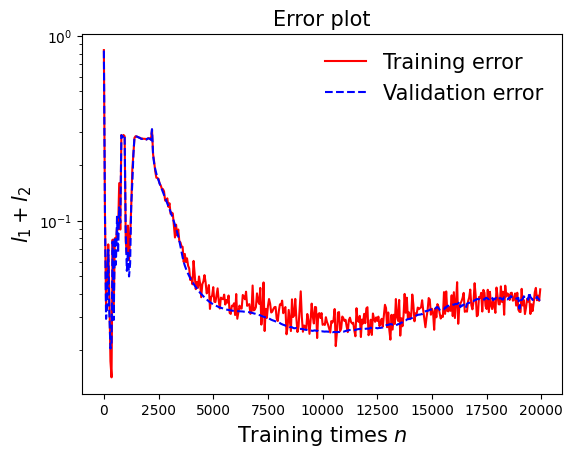

In [99]:
draw_loss(model6)

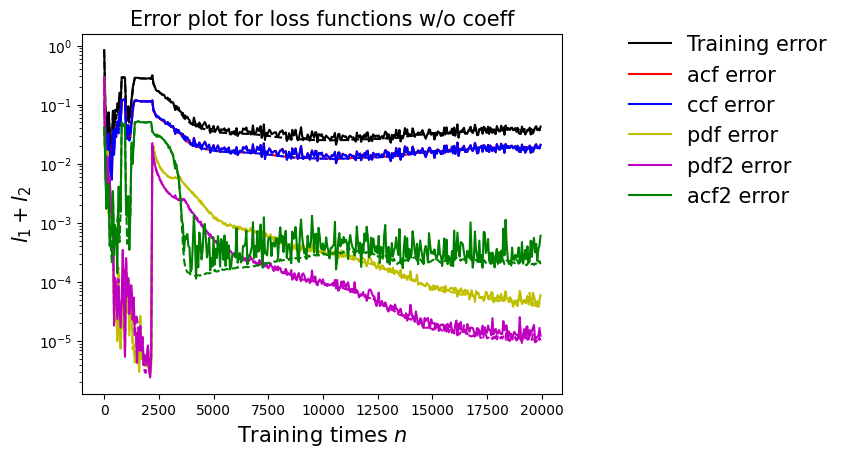

In [100]:
draw_errors(model6)

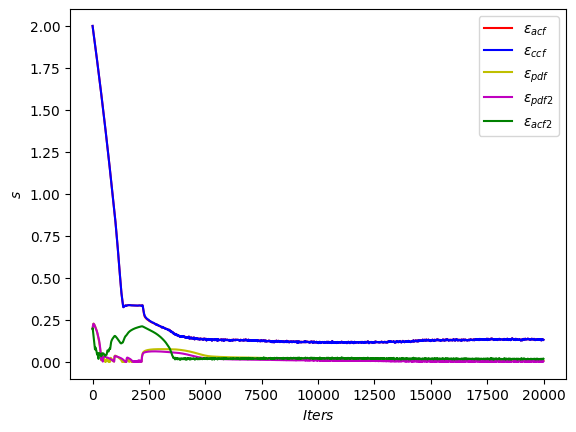

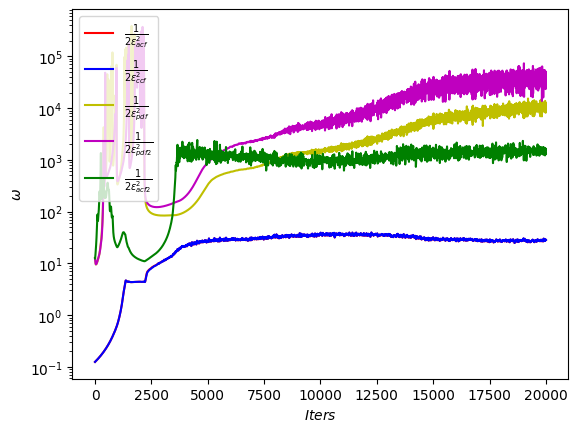

In [101]:
draw_adaptive_w(model6)
draw_epoch_w(model6)

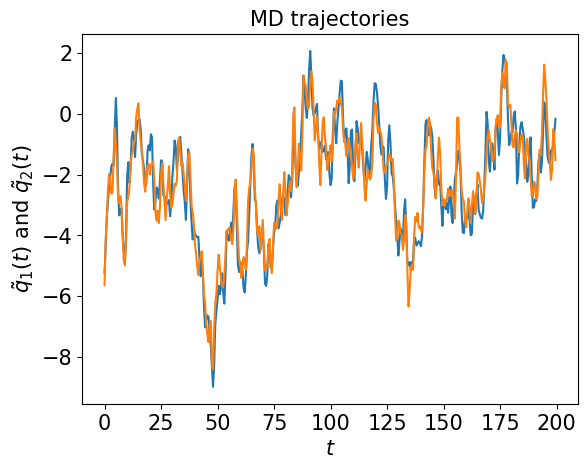

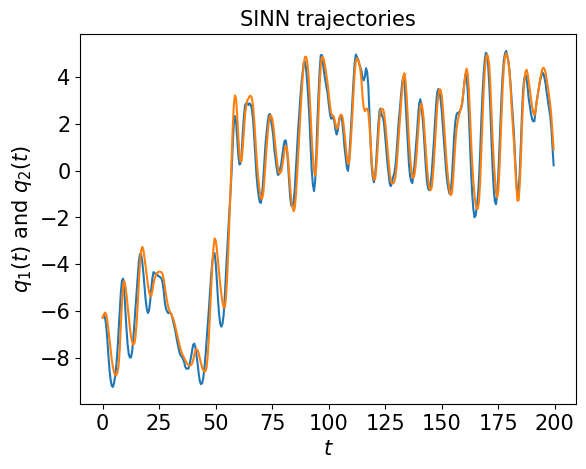

In [102]:
test1(model6)

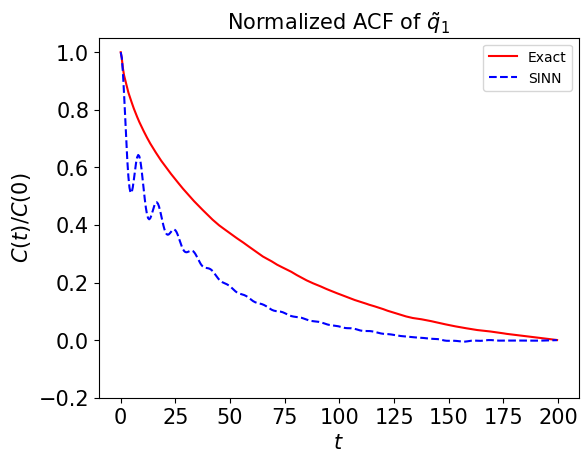

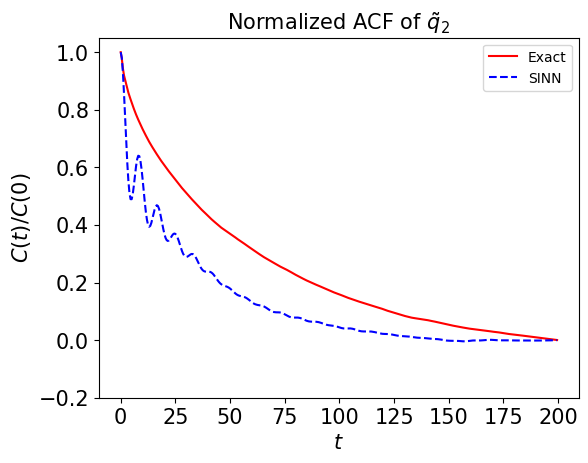

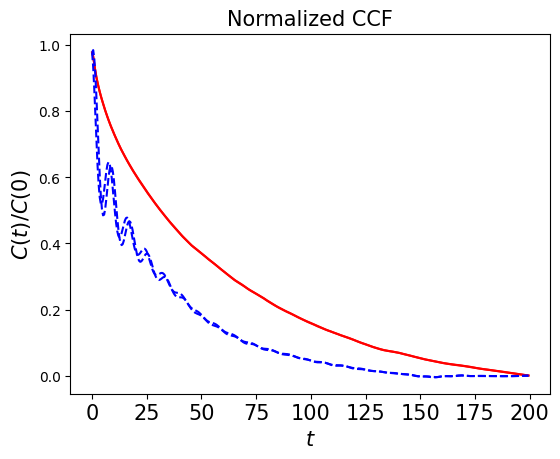

In [103]:
test2(model6)

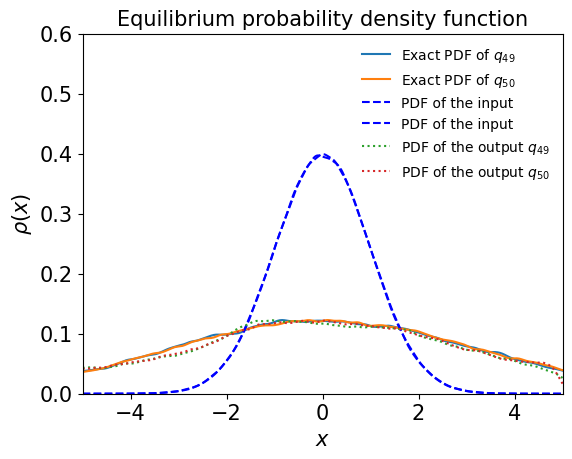

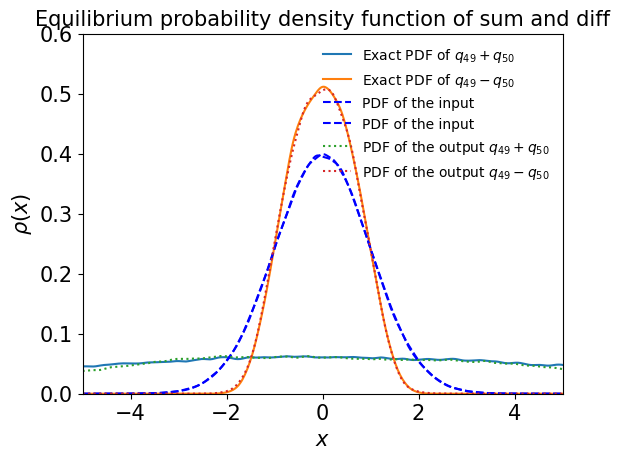

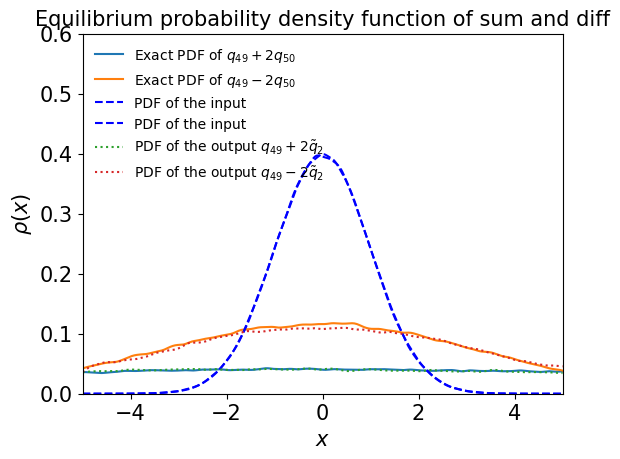

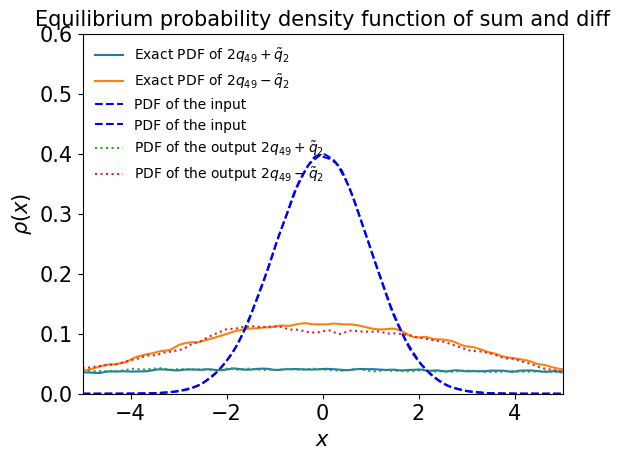

In [104]:
test3(model6)

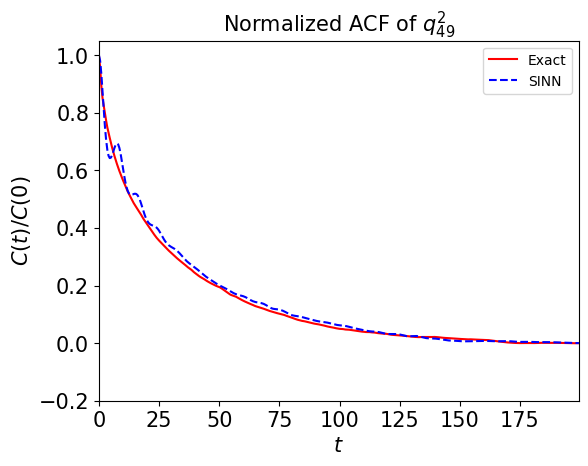

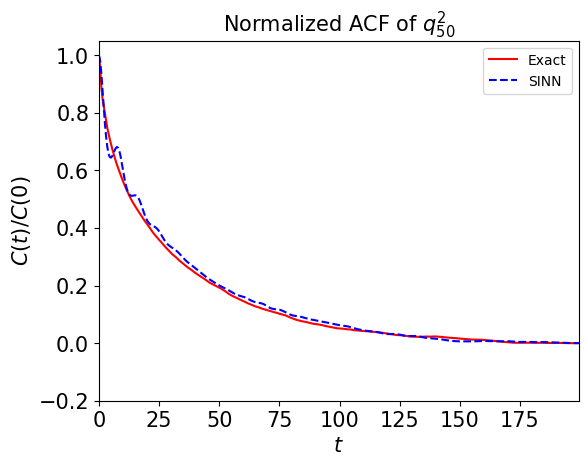

In [105]:
test4(model6)

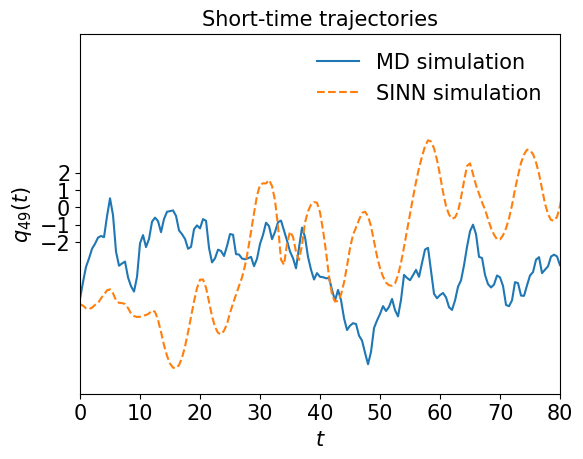

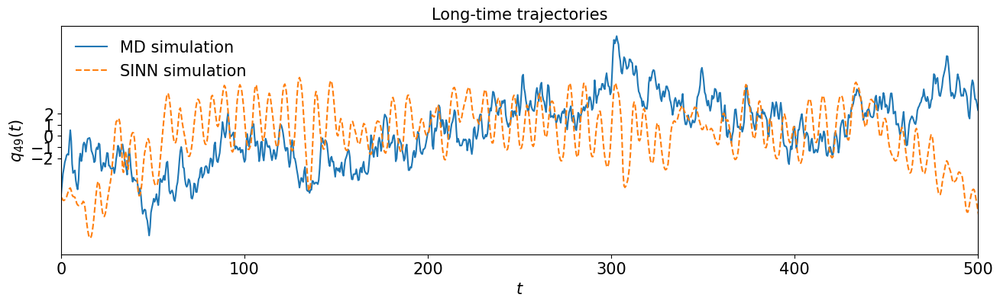

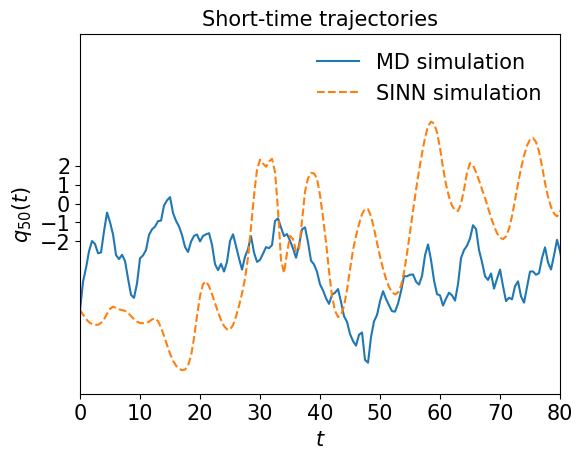

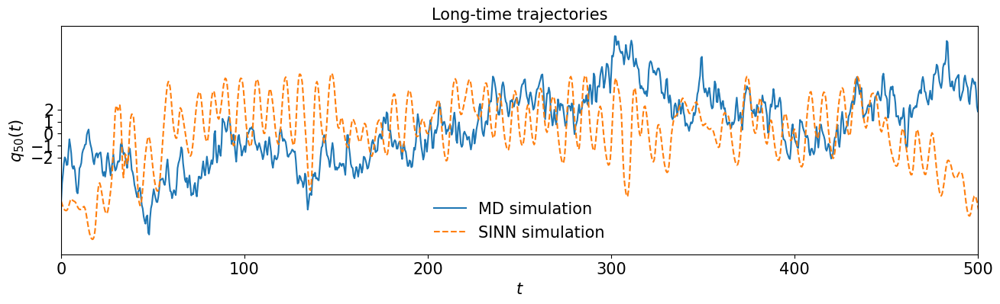

In [106]:
test5(model6)

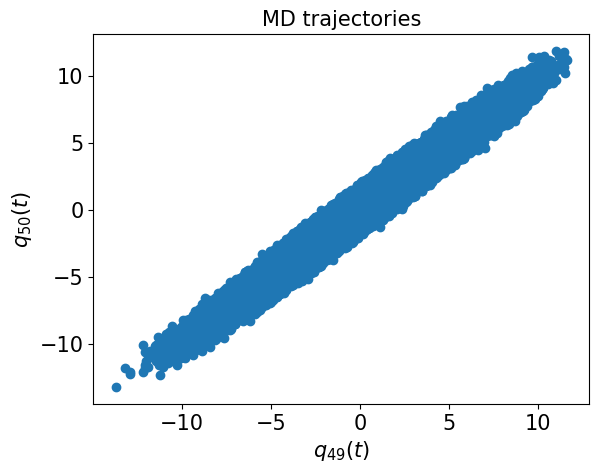

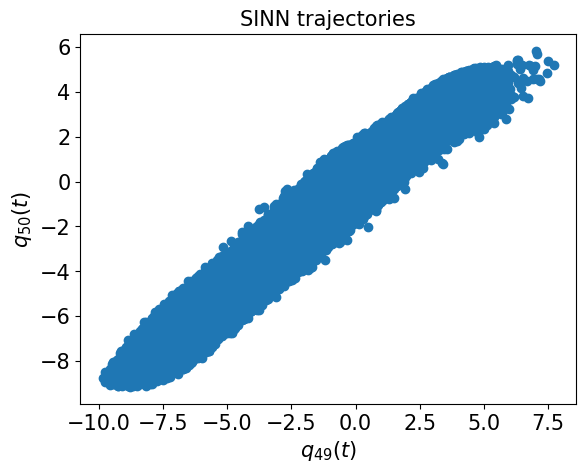

In [107]:
test6(model6)

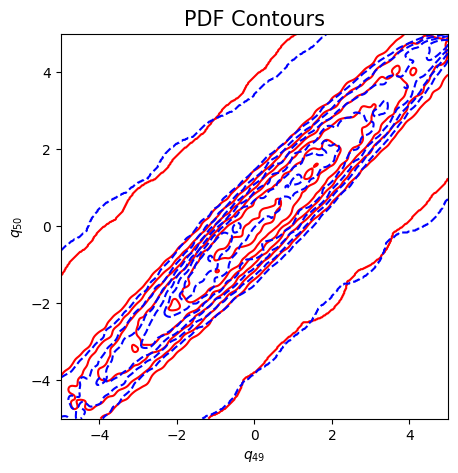

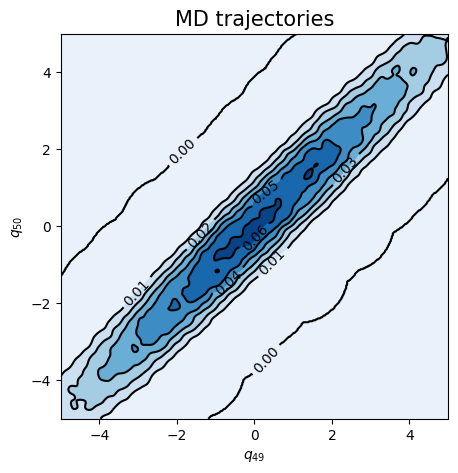

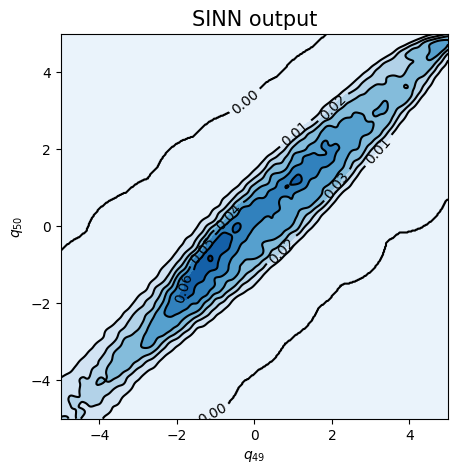

In [108]:
test7(model6)

In [109]:
### Defining SINN model
net7 = SINN(2, 100, 4, 2).to(device) # input dimension, hidden size, number of layers, output dimension
model7 = Model(net=net7)
model7.train()

[0]-th step loss: 0.8367, 0.8264, acf: 0.09518, ccf: 0.10870, pdf: 0.29317, pdf2: 0.28992, acf2: 0.03945
[50]-th step loss: 0.1386, 0.1324, acf: 0.04127, ccf: 0.04122, pdf: 0.02399, pdf2: 0.01659, acf2: 0.00930
[100]-th step loss: 0.1100, 0.0910, acf: 0.00515, ccf: 0.00516, pdf: 0.04813, pdf2: 0.02902, acf2: 0.00352
[150]-th step loss: 0.1215, 0.1074, acf: 0.04434, ccf: 0.04444, pdf: 0.00667, pdf2: 0.00503, acf2: 0.00693
[200]-th step loss: 0.1066, 0.2366, acf: 0.03318, ccf: 0.03312, pdf: 0.12230, pdf2: 0.04559, acf2: 0.00240
[250]-th step loss: 0.2376, 0.2340, acf: 0.03378, ccf: 0.03380, pdf: 0.15072, pdf2: 0.01013, acf2: 0.00553
[300]-th step loss: 0.2053, 0.1959, acf: 0.01733, ccf: 0.01725, pdf: 0.15080, pdf2: 0.01013, acf2: 0.00036
[350]-th step loss: 0.1886, 0.1885, acf: 0.01372, ccf: 0.01366, pdf: 0.15076, pdf2: 0.01013, acf2: 0.00024
[400]-th step loss: 0.1855, 0.1925, acf: 0.01583, ccf: 0.01576, pdf: 0.15074, pdf2: 0.01013, acf2: 0.00008
[450]-th step loss: 0.2002, 0.1958, acf:

[3850]-th step loss: 0.1946, 0.1898, acf: 0.01450, ccf: 0.01443, pdf: 0.15069, pdf2: 0.01013, acf2: 0.00004
[3900]-th step loss: 0.1850, 0.1832, acf: 0.01104, ccf: 0.01098, pdf: 0.15069, pdf2: 0.01013, acf2: 0.00035
[3950]-th step loss: 0.1893, 0.1875, acf: 0.01331, ccf: 0.01324, pdf: 0.15070, pdf2: 0.01013, acf2: 0.00010
[4000]-th step loss: 0.1941, 0.1834, acf: 0.01114, ccf: 0.01108, pdf: 0.15069, pdf2: 0.01013, acf2: 0.00032
[4050]-th step loss: 0.1825, 0.1812, acf: 0.00996, ccf: 0.00990, pdf: 0.15070, pdf2: 0.01013, acf2: 0.00055
[4100]-th step loss: 0.1858, 0.1867, acf: 0.01291, ccf: 0.01285, pdf: 0.15069, pdf2: 0.01013, acf2: 0.00012
[4150]-th step loss: 0.1838, 0.1852, acf: 0.01212, ccf: 0.01206, pdf: 0.15069, pdf2: 0.01013, acf2: 0.00021
[4200]-th step loss: 0.2124, 0.1938, acf: 0.01646, ccf: 0.01639, pdf: 0.15069, pdf2: 0.01013, acf2: 0.00011
[4250]-th step loss: 0.1933, 0.1963, acf: 0.01767, ccf: 0.01759, pdf: 0.15069, pdf2: 0.01013, acf2: 0.00022
[4300]-th step loss: 0.1908,

[7650]-th step loss: 0.1874, 0.1848, acf: 0.01190, ccf: 0.01184, pdf: 0.15070, pdf2: 0.01013, acf2: 0.00021
[7700]-th step loss: 0.1908, 0.1863, acf: 0.01269, ccf: 0.01262, pdf: 0.15069, pdf2: 0.01013, acf2: 0.00015
[7750]-th step loss: 0.1951, 0.1878, acf: 0.01346, ccf: 0.01339, pdf: 0.15069, pdf2: 0.01013, acf2: 0.00009
[7800]-th step loss: 0.1879, 0.1882, acf: 0.01368, ccf: 0.01361, pdf: 0.15069, pdf2: 0.01013, acf2: 0.00007
[7850]-th step loss: 0.1863, 0.1845, acf: 0.01177, ccf: 0.01171, pdf: 0.15069, pdf2: 0.01013, acf2: 0.00023
[7900]-th step loss: 0.1995, 0.1895, acf: 0.01435, ccf: 0.01428, pdf: 0.15070, pdf2: 0.01013, acf2: 0.00005
[7950]-th step loss: 0.1976, 0.1897, acf: 0.01444, ccf: 0.01437, pdf: 0.15069, pdf2: 0.01013, acf2: 0.00004
[8000]-th step loss: 0.1954, 0.1901, acf: 0.01464, ccf: 0.01457, pdf: 0.15069, pdf2: 0.01013, acf2: 0.00004
[8050]-th step loss: 0.1967, 0.1880, acf: 0.01357, ccf: 0.01350, pdf: 0.15069, pdf2: 0.01013, acf2: 0.00009
[8100]-th step loss: 0.1903,

[11450]-th step loss: 0.1932, 0.1895, acf: 0.01396, ccf: 0.01389, pdf: 0.15148, pdf2: 0.01013, acf2: 0.00005
[11500]-th step loss: 0.1909, 0.1896, acf: 0.01403, ccf: 0.01396, pdf: 0.15148, pdf2: 0.01013, acf2: 0.00004
[11550]-th step loss: 0.1967, 0.1928, acf: 0.01559, ccf: 0.01552, pdf: 0.15147, pdf2: 0.01013, acf2: 0.00006
[11600]-th step loss: 0.1898, 0.1895, acf: 0.01395, ccf: 0.01388, pdf: 0.15147, pdf2: 0.01013, acf2: 0.00007
[11650]-th step loss: 0.1877, 0.1878, acf: 0.01311, ccf: 0.01304, pdf: 0.15146, pdf2: 0.01013, acf2: 0.00010
[11700]-th step loss: 0.1890, 0.1881, acf: 0.01323, ccf: 0.01316, pdf: 0.15146, pdf2: 0.01013, acf2: 0.00008
[11750]-th step loss: 0.1856, 0.1871, acf: 0.01272, ccf: 0.01266, pdf: 0.15145, pdf2: 0.01013, acf2: 0.00013
[11800]-th step loss: 0.1947, 0.1872, acf: 0.01281, ccf: 0.01274, pdf: 0.15144, pdf2: 0.01013, acf2: 0.00011
[11850]-th step loss: 0.1985, 0.1894, acf: 0.01394, ccf: 0.01387, pdf: 0.15142, pdf2: 0.01013, acf2: 0.00007
[11900]-th step los

[15250]-th step loss: 0.1909, 0.1905, acf: 0.01487, ccf: 0.01480, pdf: 0.15069, pdf2: 0.01013, acf2: 0.00005
[15300]-th step loss: 0.1915, 0.1900, acf: 0.01458, ccf: 0.01450, pdf: 0.15069, pdf2: 0.01013, acf2: 0.00008
[15350]-th step loss: 0.1867, 0.1873, acf: 0.01325, ccf: 0.01318, pdf: 0.15069, pdf2: 0.01013, acf2: 0.00008
[15400]-th step loss: 0.1879, 0.1868, acf: 0.01295, ccf: 0.01288, pdf: 0.15069, pdf2: 0.01013, acf2: 0.00010
[15450]-th step loss: 0.1927, 0.1868, acf: 0.01294, ccf: 0.01288, pdf: 0.15070, pdf2: 0.01013, acf2: 0.00010
[15500]-th step loss: 0.1911, 0.1897, acf: 0.01446, ccf: 0.01439, pdf: 0.15069, pdf2: 0.01013, acf2: 0.00003
[15550]-th step loss: 0.1823, 0.1878, acf: 0.01349, ccf: 0.01342, pdf: 0.15069, pdf2: 0.01013, acf2: 0.00010
[15600]-th step loss: 0.1907, 0.1880, acf: 0.01360, ccf: 0.01353, pdf: 0.15069, pdf2: 0.01013, acf2: 0.00006
[15650]-th step loss: 0.1878, 0.1865, acf: 0.01284, ccf: 0.01277, pdf: 0.15069, pdf2: 0.01013, acf2: 0.00011
[15700]-th step los

[19050]-th step loss: 0.1852, 0.1880, acf: 0.01356, ccf: 0.01349, pdf: 0.15069, pdf2: 0.01013, acf2: 0.00008
[19100]-th step loss: 0.1828, 0.1869, acf: 0.01300, ccf: 0.01294, pdf: 0.15071, pdf2: 0.01013, acf2: 0.00010
[19150]-th step loss: 0.1806, 0.1885, acf: 0.01380, ccf: 0.01373, pdf: 0.15070, pdf2: 0.01013, acf2: 0.00011
[19200]-th step loss: 0.1933, 0.1856, acf: 0.01235, ccf: 0.01229, pdf: 0.15069, pdf2: 0.01013, acf2: 0.00015
[19250]-th step loss: 0.1829, 0.1889, acf: 0.01406, ccf: 0.01399, pdf: 0.15069, pdf2: 0.01013, acf2: 0.00004
[19300]-th step loss: 0.1857, 0.1899, acf: 0.01458, ccf: 0.01451, pdf: 0.15070, pdf2: 0.01013, acf2: 0.00003
[19350]-th step loss: 0.1915, 0.1882, acf: 0.01369, ccf: 0.01362, pdf: 0.15069, pdf2: 0.01013, acf2: 0.00006
[19400]-th step loss: 0.1875, 0.1868, acf: 0.01300, ccf: 0.01293, pdf: 0.15069, pdf2: 0.01013, acf2: 0.00009
[19450]-th step loss: 0.1834, 0.1850, acf: 0.01202, ccf: 0.01196, pdf: 0.15069, pdf2: 0.01013, acf2: 0.00019
[19500]-th step los

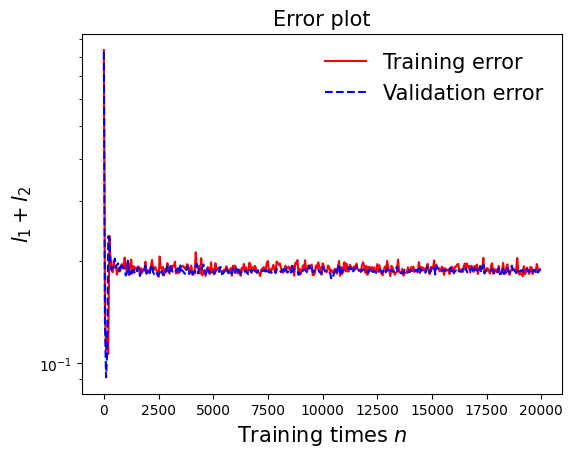

In [110]:
draw_loss(model7)

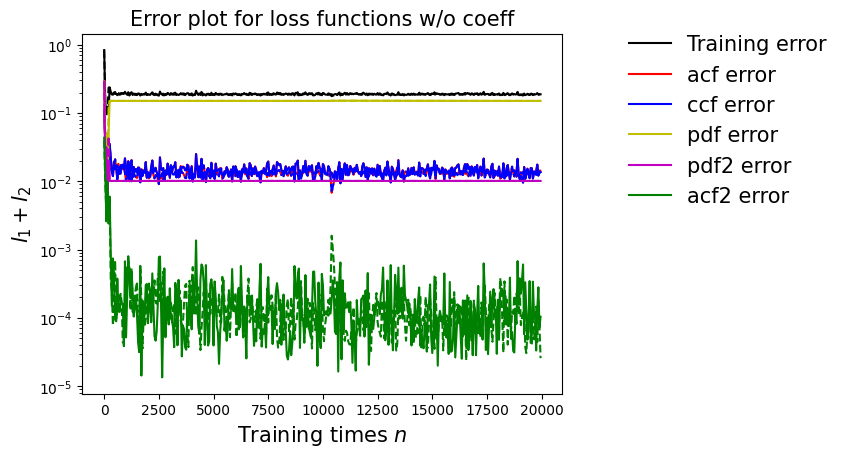

In [111]:
draw_errors(model7)

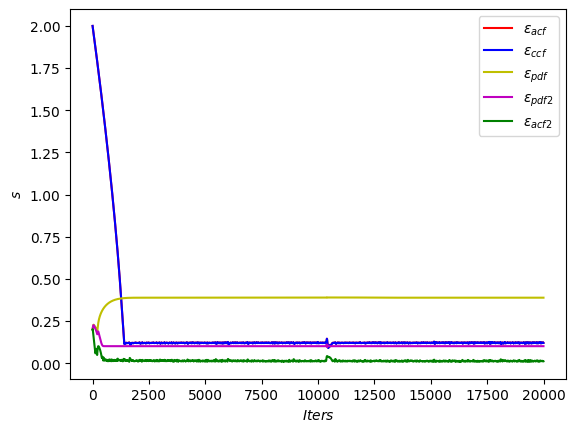

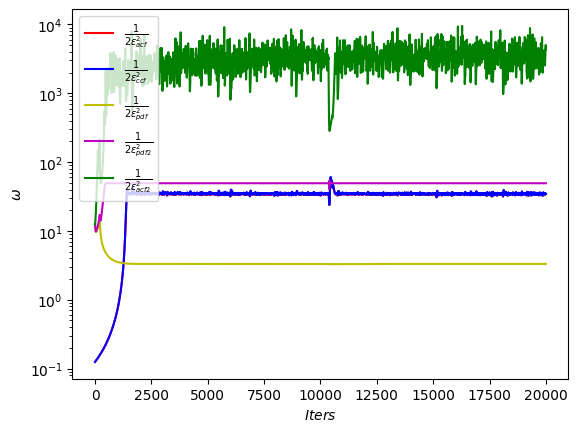

In [112]:
draw_adaptive_w(model7)
draw_epoch_w(model7)

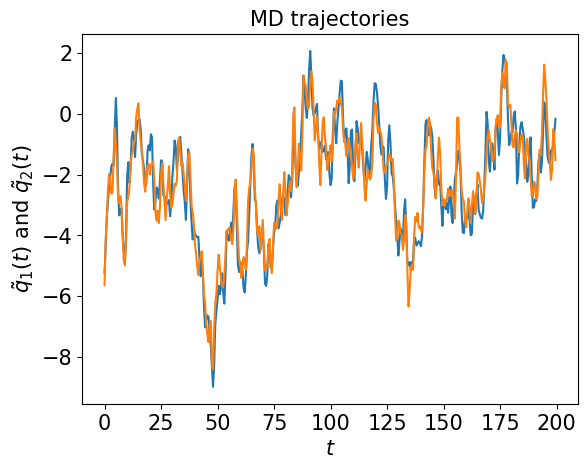

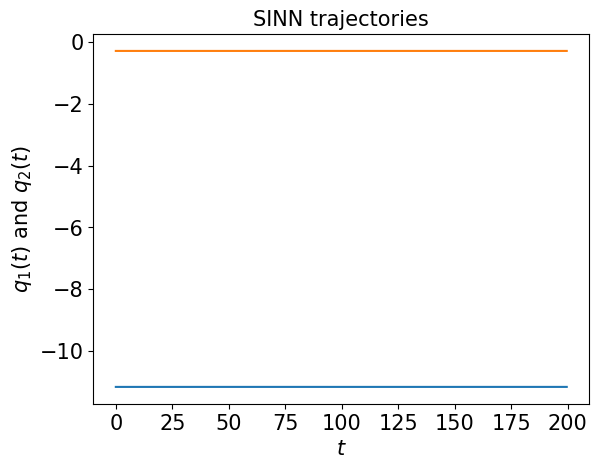

In [113]:
test1(model7)

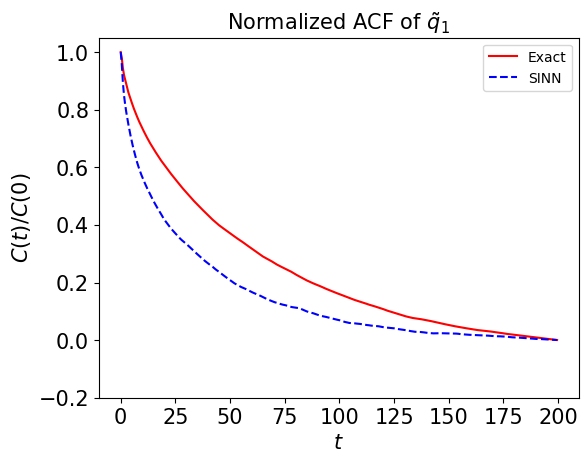

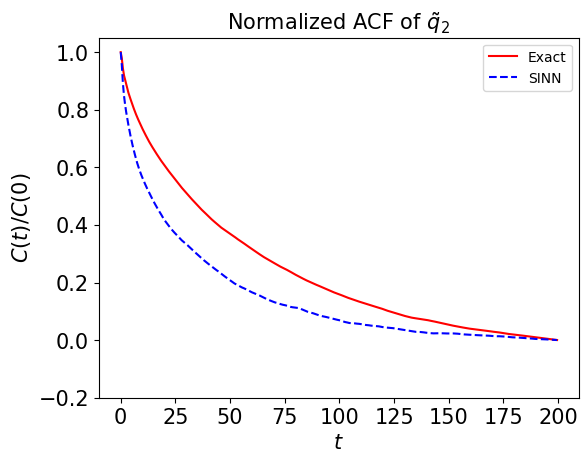

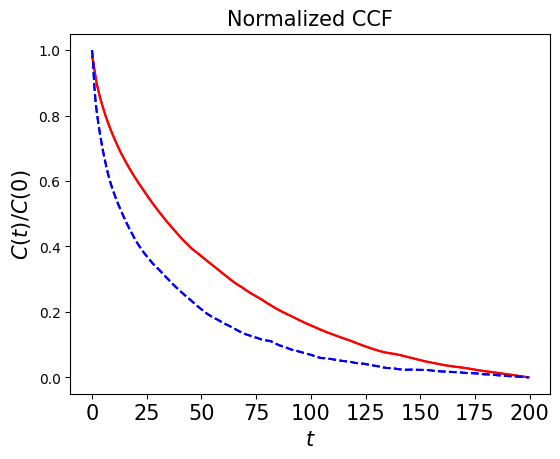

In [114]:
test2(model7)

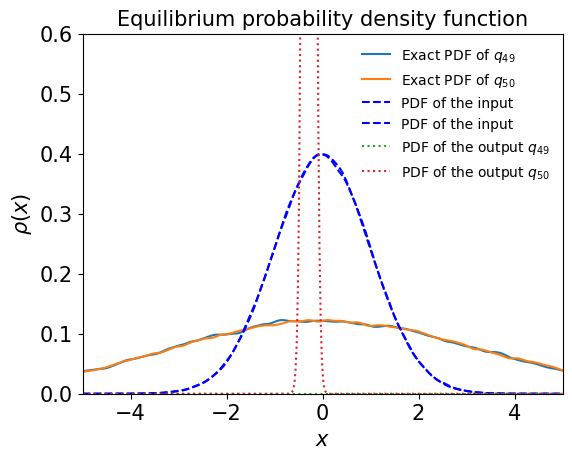

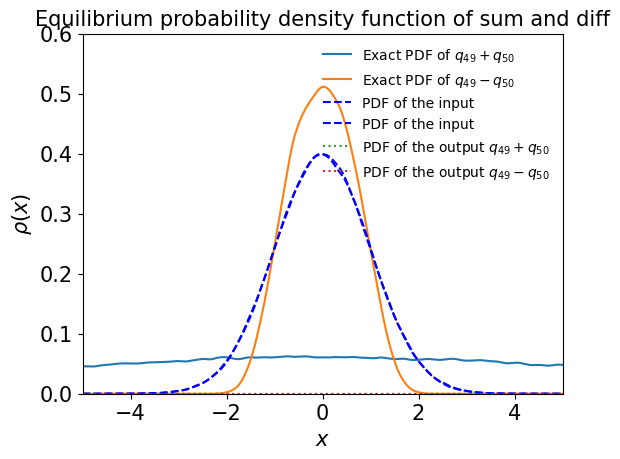

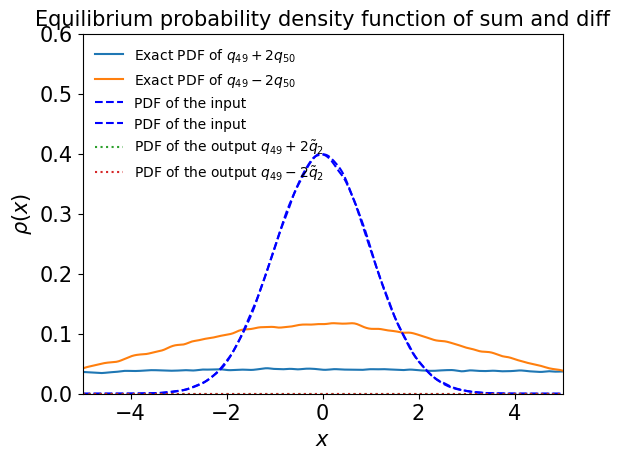

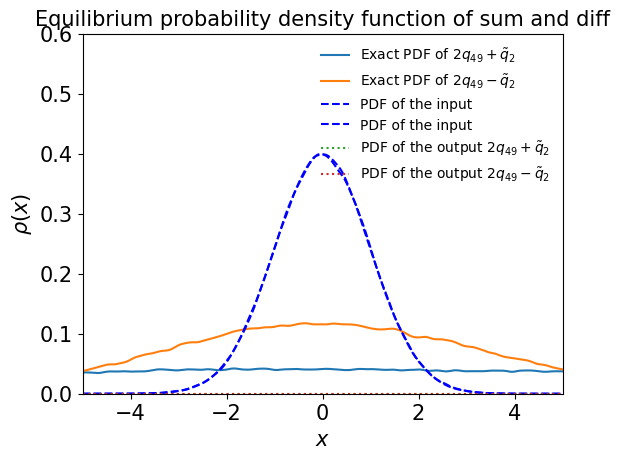

In [115]:
test3(model7)

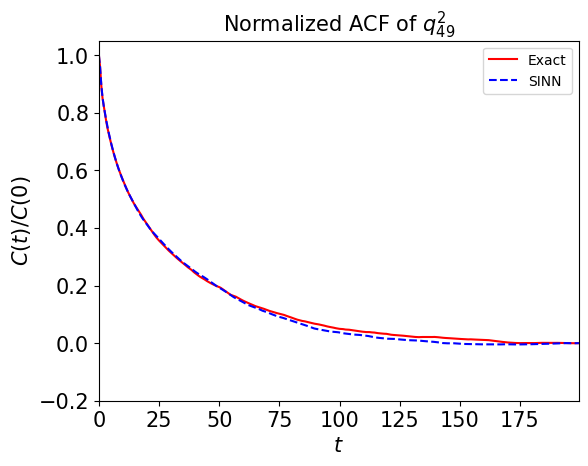

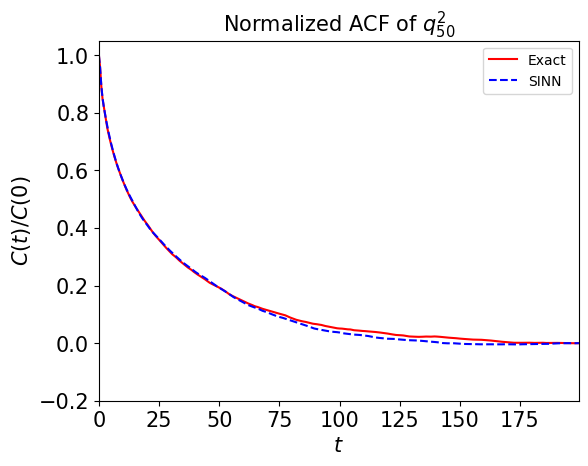

In [116]:
test4(model7)

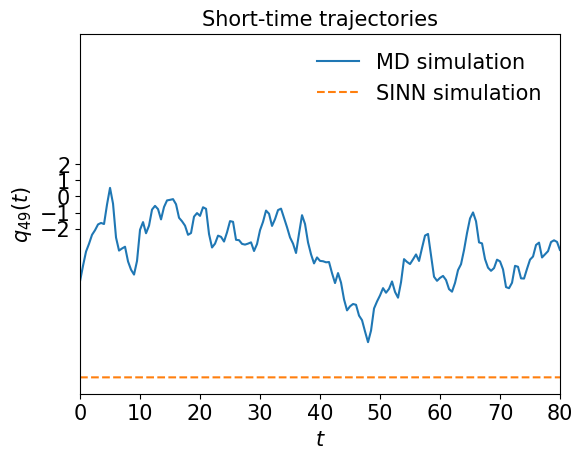

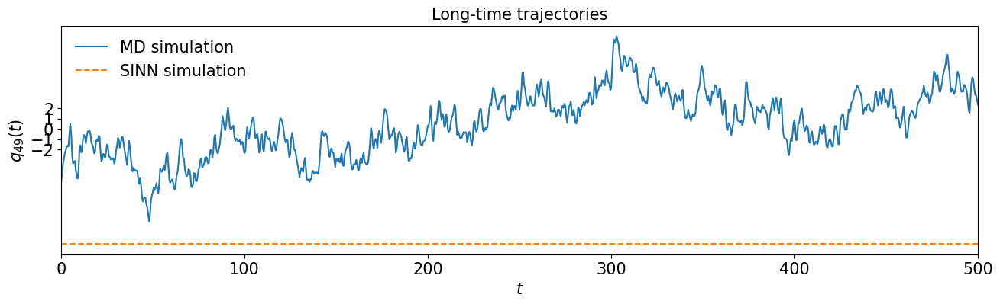

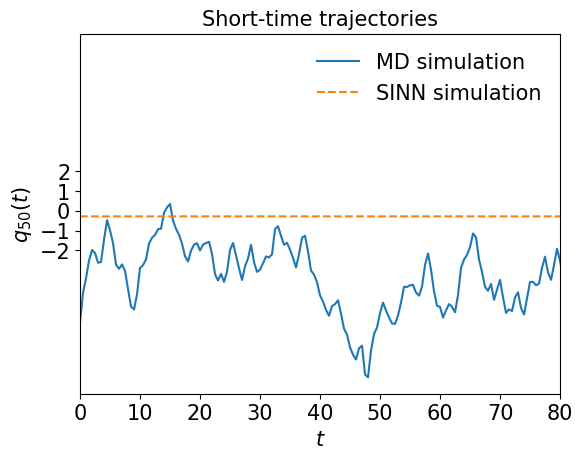

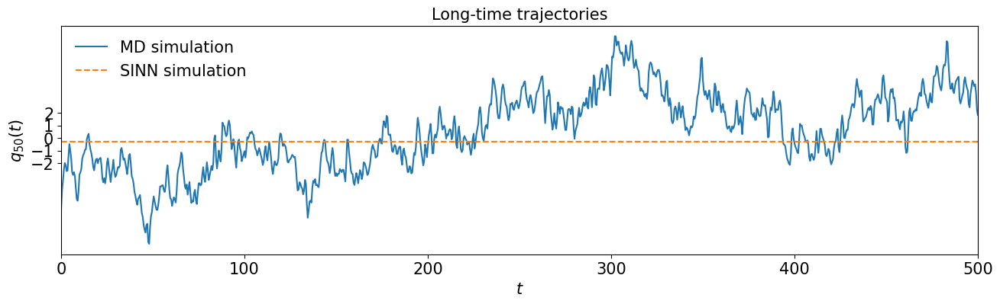

In [117]:
test5(model7)

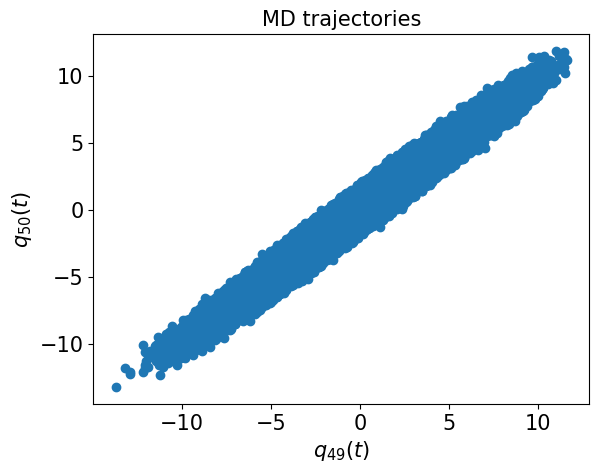

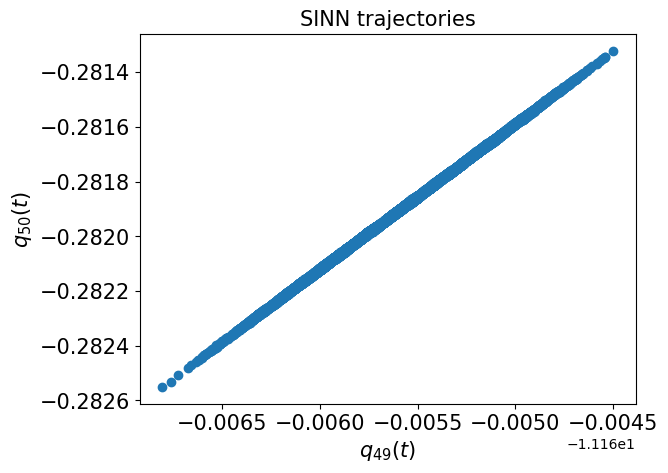

In [118]:
test6(model7)

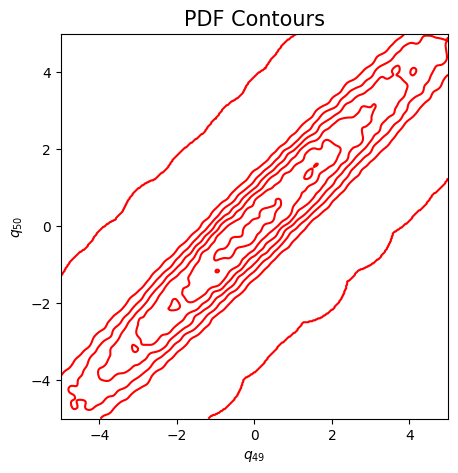

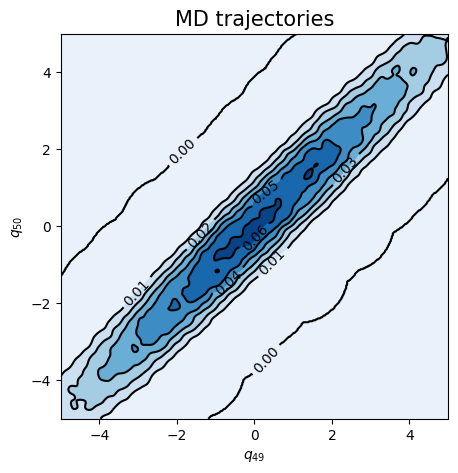

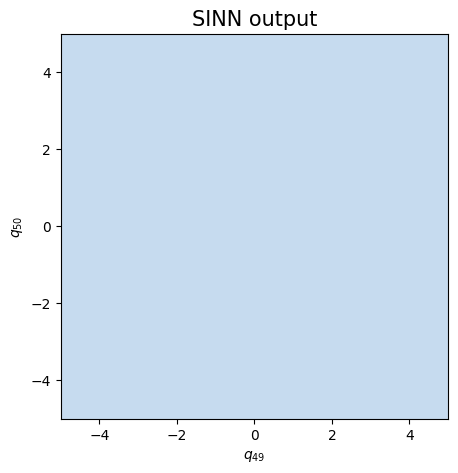

In [119]:
test7(model7)

In [120]:
### Defining SINN model
net8 = SINN(2, 100, 4, 2).to(device) # input dimension, hidden size, number of layers, output dimension
model8 = Model(net=net8)
model8.train()

[0]-th step loss: 0.8444, 0.8524, acf: 0.09604, ccf: 0.13329, pdf: 0.29316, pdf2: 0.28991, acf2: 0.04001
[50]-th step loss: 0.3416, 0.3408, acf: 0.06551, ccf: 0.22448, pdf: 0.00905, pdf2: 0.01880, acf2: 0.02295
[100]-th step loss: 0.3189, 0.2996, acf: 0.03639, ccf: 0.24079, pdf: 0.00636, pdf2: 0.01091, acf2: 0.00511
[150]-th step loss: 0.4249, 0.4505, acf: 0.01595, ccf: 0.37131, pdf: 0.03410, pdf2: 0.02496, acf2: 0.00422
[200]-th step loss: 0.5978, 0.4208, acf: 0.01428, ccf: 0.37072, pdf: 0.01444, pdf2: 0.01686, acf2: 0.00454
[250]-th step loss: 0.3989, 0.3980, acf: 0.01752, ccf: 0.36082, pdf: 0.00737, pdf2: 0.00854, acf2: 0.00370
[300]-th step loss: 0.3930, 0.3951, acf: 0.01201, ccf: 0.36758, pdf: 0.00662, pdf2: 0.00803, acf2: 0.00091
[350]-th step loss: 0.3509, 0.3545, acf: 0.02164, ccf: 0.31675, pdf: 0.00636, pdf2: 0.00865, acf2: 0.00110
[400]-th step loss: 0.3891, 0.3851, acf: 0.02066, ccf: 0.33169, pdf: 0.01822, pdf2: 0.01271, acf2: 0.00186
[450]-th step loss: 0.3365, 0.3409, acf:

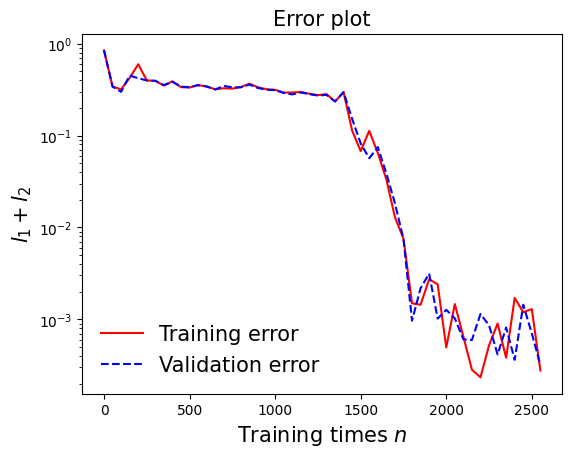

In [121]:
draw_loss(model8)

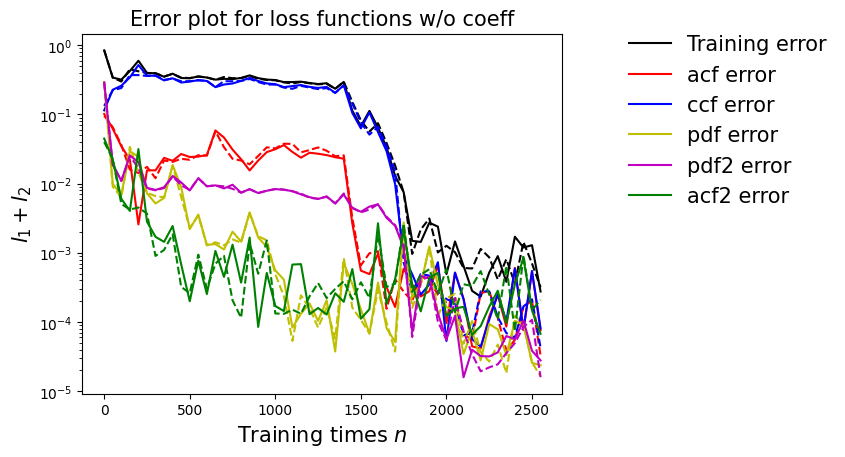

In [122]:
draw_errors(model8)

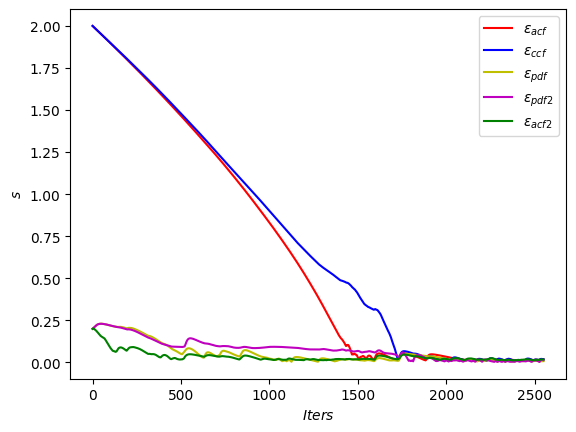

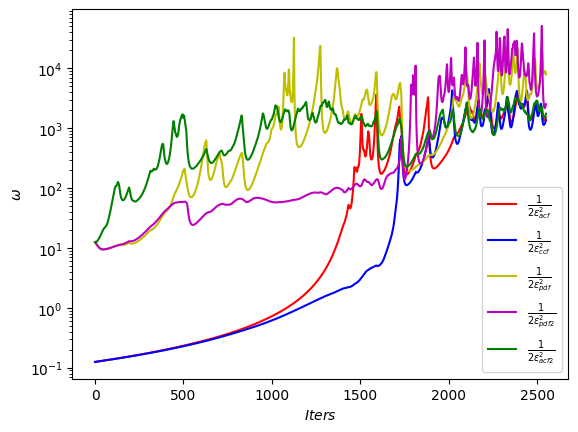

In [123]:
draw_adaptive_w(model8)
draw_epoch_w(model8)

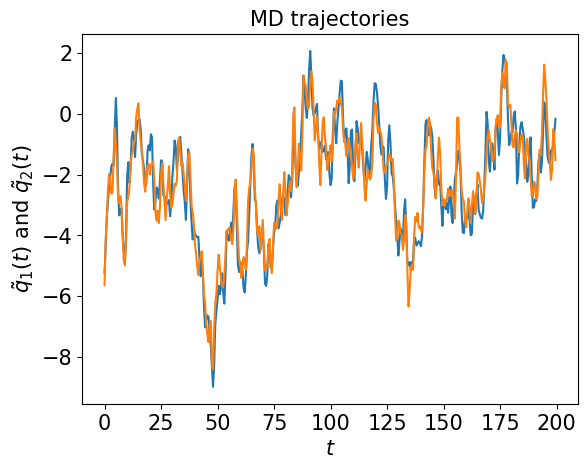

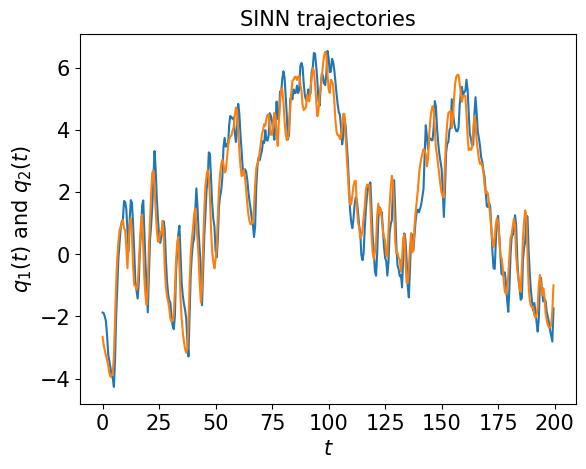

In [124]:
test1(model8)

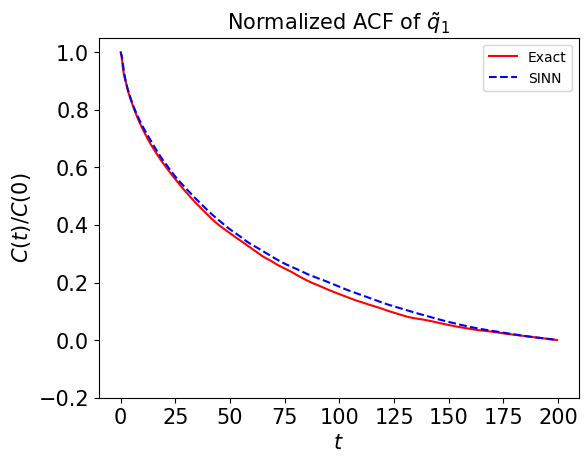

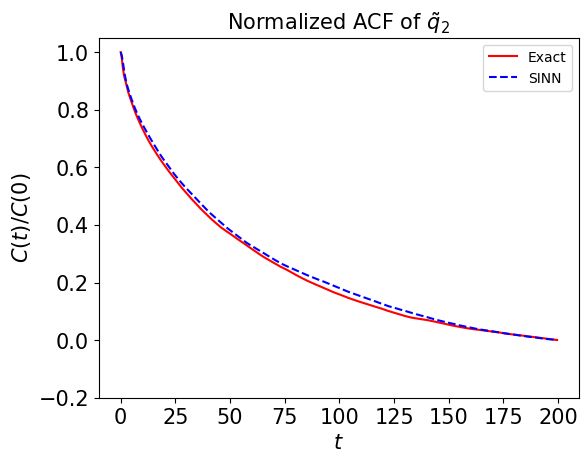

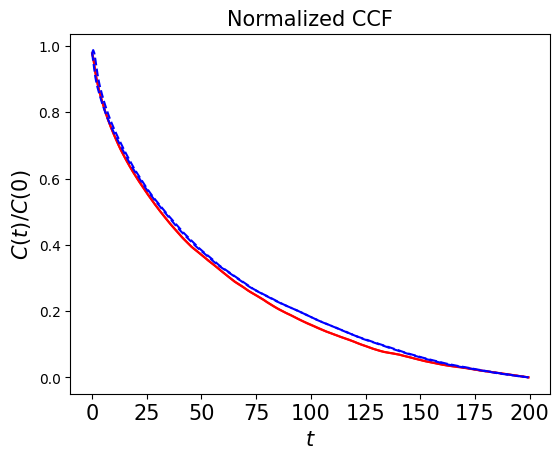

In [125]:
test2(model8)

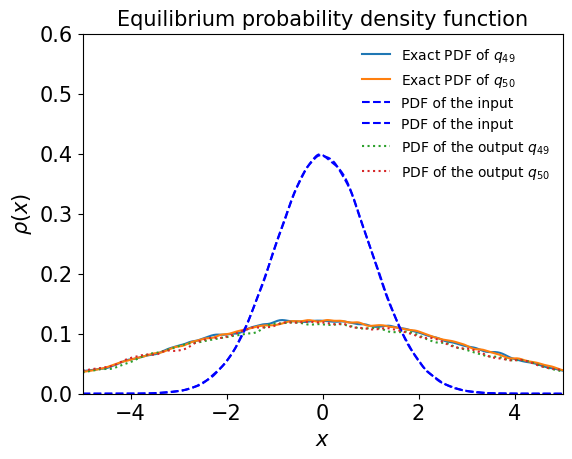

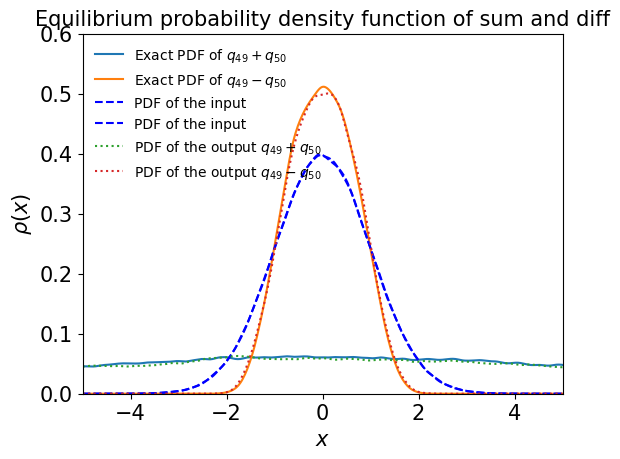

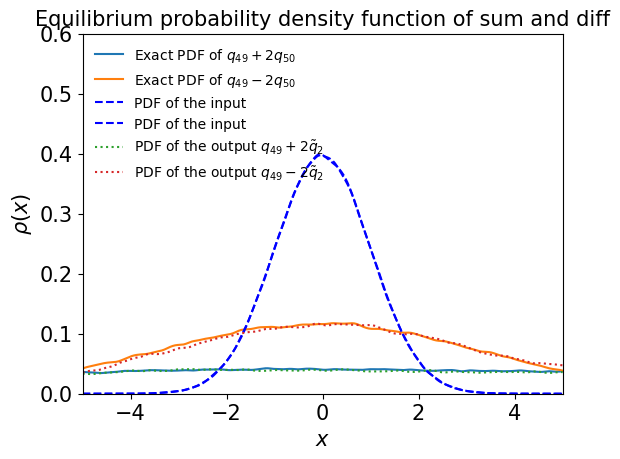

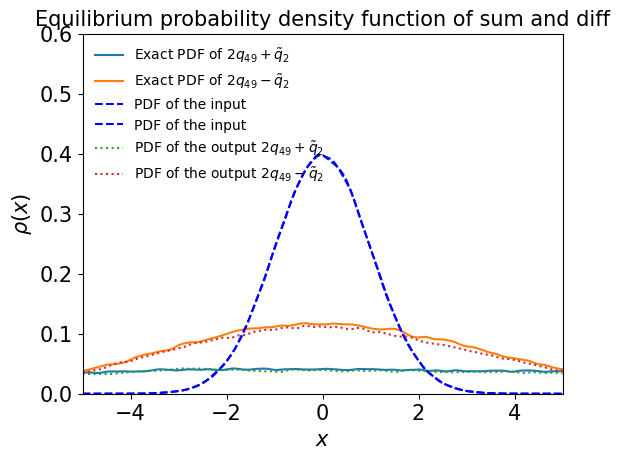

In [126]:
test3(model8)

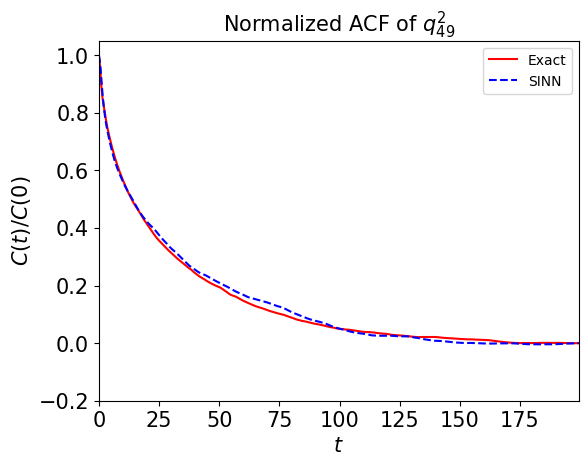

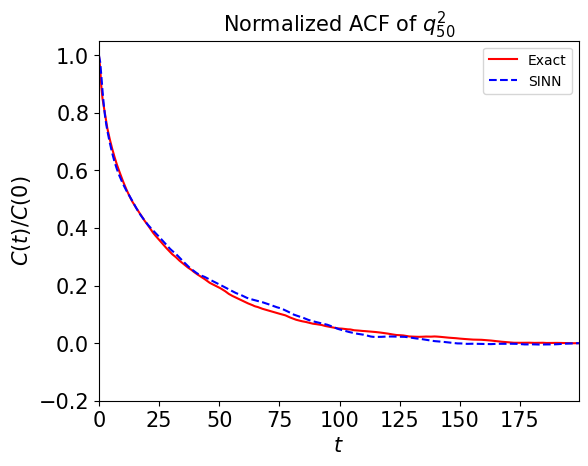

In [127]:
test4(model8)

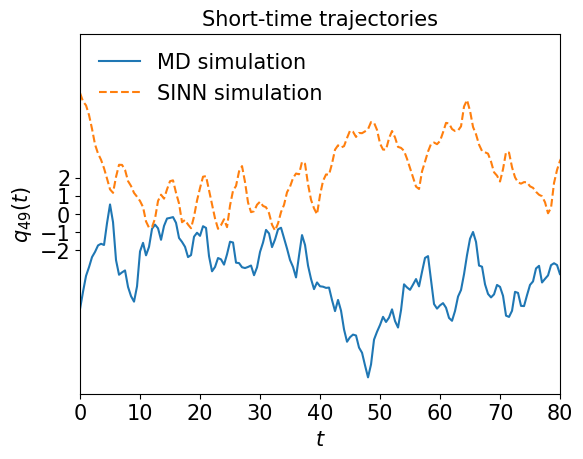

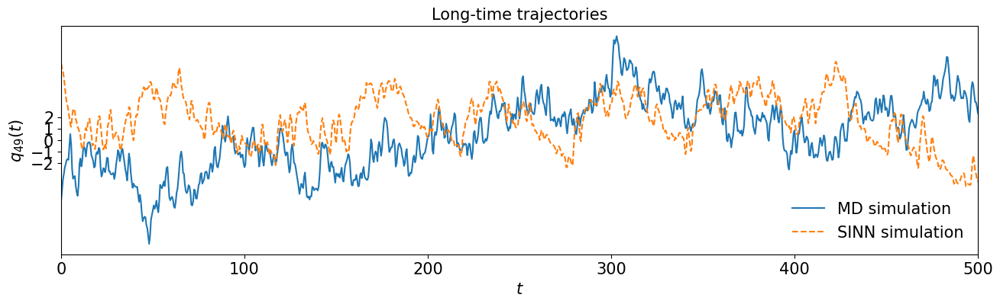

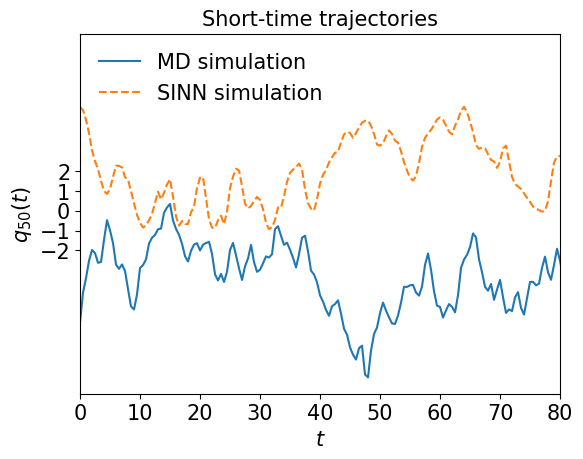

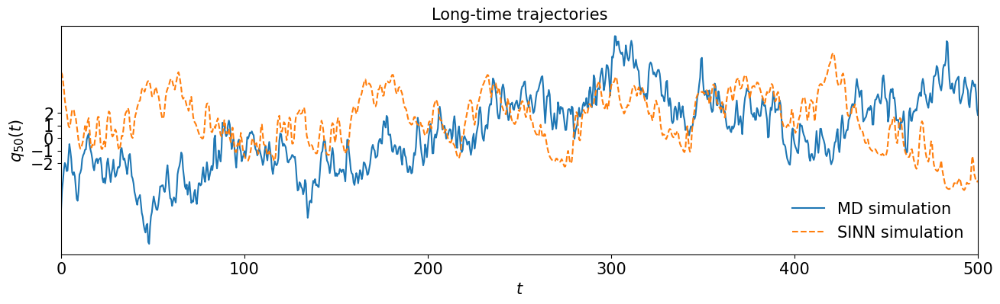

In [128]:
test5(model8)

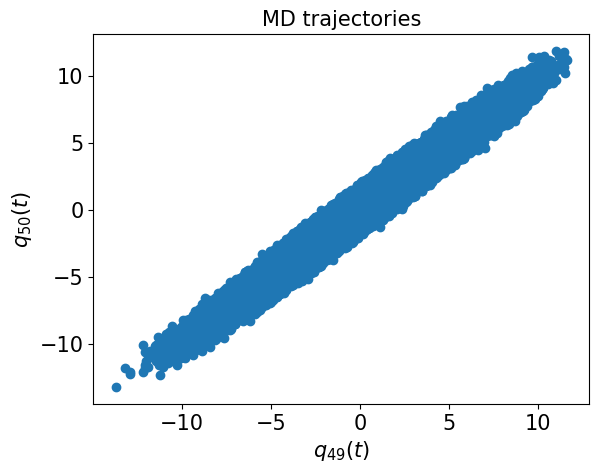

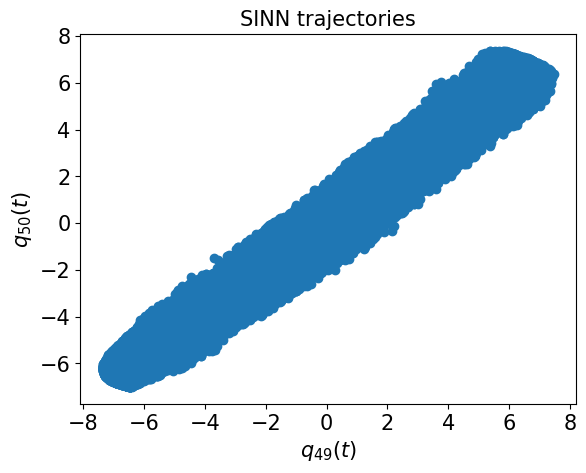

In [129]:
test6(model8)

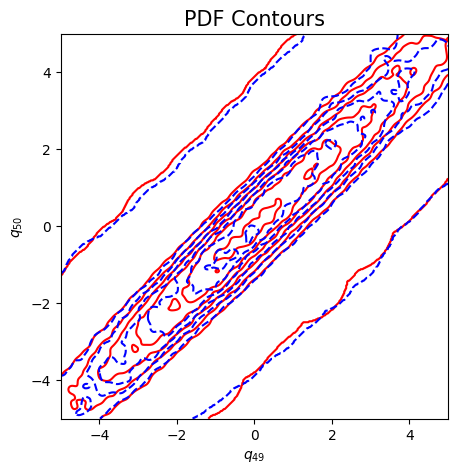

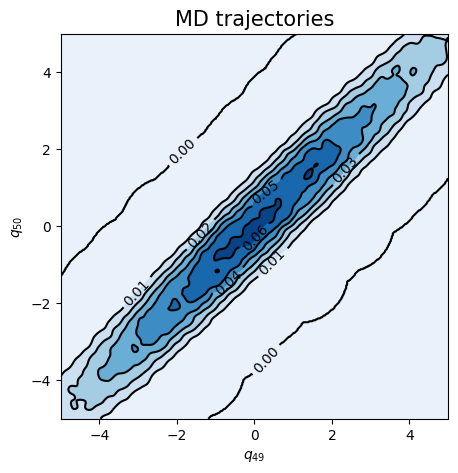

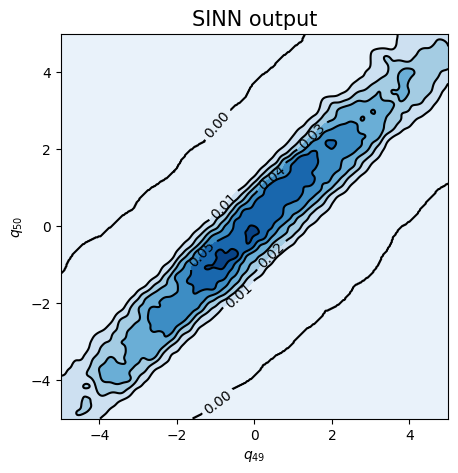

In [130]:
test7(model8)

In [131]:
### Defining SINN model
net9 = SINN(2, 100, 4, 2).to(device) # input dimension, hidden size, number of layers, output dimension
model9 = Model(net=net9)
model9.train()

[0]-th step loss: 0.8605, 0.8286, acf: 0.09648, ccf: 0.10847, pdf: 0.29323, pdf2: 0.28993, acf2: 0.04050
[50]-th step loss: 0.1166, 0.1212, acf: 0.04012, ccf: 0.04015, pdf: 0.01686, pdf2: 0.01001, acf2: 0.01401
[100]-th step loss: 0.0680, 0.0638, acf: 0.01066, ccf: 0.01062, pdf: 0.02716, pdf2: 0.01272, acf2: 0.00259
[150]-th step loss: 0.0522, 0.0556, acf: 0.01931, ccf: 0.01925, pdf: 0.00869, pdf2: 0.00700, acf2: 0.00132
[200]-th step loss: 0.2507, 0.2508, acf: 0.01884, ccf: 0.01878, pdf: 0.15333, pdf2: 0.05936, acf2: 0.00047
[250]-th step loss: 0.2391, 0.2562, acf: 0.02163, ccf: 0.02163, pdf: 0.15321, pdf2: 0.05899, acf2: 0.00079
[300]-th step loss: 0.2441, 0.2493, acf: 0.01844, ccf: 0.01837, pdf: 0.15311, pdf2: 0.05902, acf2: 0.00039
[350]-th step loss: 0.2436, 0.2591, acf: 0.02299, ccf: 0.02290, pdf: 0.15309, pdf2: 0.05904, acf2: 0.00109
[400]-th step loss: 0.2455, 0.2433, acf: 0.01554, ccf: 0.01547, pdf: 0.15309, pdf2: 0.05904, acf2: 0.00016
[450]-th step loss: 0.2456, 0.2427, acf:

[3850]-th step loss: 0.2505, 0.2461, acf: 0.01689, ccf: 0.01681, pdf: 0.15335, pdf2: 0.05892, acf2: 0.00011
[3900]-th step loss: 0.2399, 0.2451, acf: 0.01638, ccf: 0.01631, pdf: 0.15341, pdf2: 0.05890, acf2: 0.00008
[3950]-th step loss: 0.2431, 0.2447, acf: 0.01617, ccf: 0.01610, pdf: 0.15345, pdf2: 0.05888, acf2: 0.00006
[4000]-th step loss: 0.2386, 0.2448, acf: 0.01624, ccf: 0.01617, pdf: 0.15345, pdf2: 0.05888, acf2: 0.00009
[4050]-th step loss: 0.2390, 0.2445, acf: 0.01613, ccf: 0.01606, pdf: 0.15326, pdf2: 0.05895, acf2: 0.00005
[4100]-th step loss: 0.2326, 0.2409, acf: 0.01432, ccf: 0.01425, pdf: 0.15334, pdf2: 0.05892, acf2: 0.00007
[4150]-th step loss: 0.2371, 0.2399, acf: 0.01366, ccf: 0.01359, pdf: 0.15378, pdf2: 0.05877, acf2: 0.00009
[4200]-th step loss: 0.2476, 0.2465, acf: 0.01710, ccf: 0.01703, pdf: 0.15334, pdf2: 0.05892, acf2: 0.00012
[4250]-th step loss: 0.2478, 0.2472, acf: 0.01742, ccf: 0.01735, pdf: 0.15343, pdf2: 0.05889, acf2: 0.00013
[4300]-th step loss: 0.2370,

[7650]-th step loss: 0.2446, 0.2436, acf: 0.01563, ccf: 0.01556, pdf: 0.15350, pdf2: 0.05886, acf2: 0.00004
[7700]-th step loss: 0.2498, 0.2425, acf: 0.01511, ccf: 0.01503, pdf: 0.15338, pdf2: 0.05891, acf2: 0.00003
[7750]-th step loss: 0.2525, 0.2455, acf: 0.01660, ccf: 0.01652, pdf: 0.15343, pdf2: 0.05889, acf2: 0.00007
[7800]-th step loss: 0.2394, 0.2447, acf: 0.01618, ccf: 0.01611, pdf: 0.15343, pdf2: 0.05889, acf2: 0.00005
[7850]-th step loss: 0.2392, 0.2416, acf: 0.01471, ccf: 0.01464, pdf: 0.15321, pdf2: 0.05898, acf2: 0.00003
[7900]-th step loss: 0.2408, 0.2433, acf: 0.01554, ccf: 0.01546, pdf: 0.15331, pdf2: 0.05894, acf2: 0.00004
[7950]-th step loss: 0.2341, 0.2392, acf: 0.01334, ccf: 0.01328, pdf: 0.15362, pdf2: 0.05882, acf2: 0.00011
[8000]-th step loss: 0.2426, 0.2455, acf: 0.01662, ccf: 0.01654, pdf: 0.15340, pdf2: 0.05890, acf2: 0.00007
[8050]-th step loss: 0.2429, 0.2467, acf: 0.01719, ccf: 0.01711, pdf: 0.15334, pdf2: 0.05892, acf2: 0.00011
[8100]-th step loss: 0.2414,

[11450]-th step loss: 0.1833, 0.1885, acf: 0.01374, ccf: 0.01368, pdf: 0.15091, pdf2: 0.01013, acf2: 0.00008
[11500]-th step loss: 0.1961, 0.1948, acf: 0.01685, ccf: 0.01677, pdf: 0.15089, pdf2: 0.01013, acf2: 0.00012
[11550]-th step loss: 0.1924, 0.1920, acf: 0.01553, ccf: 0.01545, pdf: 0.15089, pdf2: 0.01013, acf2: 0.00004
[11600]-th step loss: 0.1926, 0.1961, acf: 0.01754, ccf: 0.01746, pdf: 0.15087, pdf2: 0.01013, acf2: 0.00013
[11650]-th step loss: 0.1905, 0.1934, acf: 0.01618, ccf: 0.01610, pdf: 0.15087, pdf2: 0.01013, acf2: 0.00008
[11700]-th step loss: 0.1923, 0.2009, acf: 0.01979, ccf: 0.01971, pdf: 0.15087, pdf2: 0.01013, acf2: 0.00039
[11750]-th step loss: 0.1939, 0.1936, acf: 0.01630, ccf: 0.01622, pdf: 0.15086, pdf2: 0.01013, acf2: 0.00005
[11800]-th step loss: 0.1922, 0.1915, acf: 0.01530, ccf: 0.01523, pdf: 0.15086, pdf2: 0.01013, acf2: 0.00003
[11850]-th step loss: 0.1899, 0.1991, acf: 0.01896, ccf: 0.01887, pdf: 0.15087, pdf2: 0.01013, acf2: 0.00028
[11900]-th step los

[15250]-th step loss: 0.1937, 0.2002, acf: 0.01956, ccf: 0.01948, pdf: 0.15069, pdf2: 0.01013, acf2: 0.00034
[15300]-th step loss: 0.1905, 0.1913, acf: 0.01524, ccf: 0.01517, pdf: 0.15069, pdf2: 0.01013, acf2: 0.00003
[15350]-th step loss: 0.1880, 0.1951, acf: 0.01714, ccf: 0.01706, pdf: 0.15068, pdf2: 0.01013, acf2: 0.00012
[15400]-th step loss: 0.1905, 0.1973, acf: 0.01821, ccf: 0.01813, pdf: 0.15069, pdf2: 0.01013, acf2: 0.00019
[15450]-th step loss: 0.1892, 0.1939, acf: 0.01653, ccf: 0.01646, pdf: 0.15069, pdf2: 0.01013, acf2: 0.00008
[15500]-th step loss: 0.1987, 0.1927, acf: 0.01596, ccf: 0.01588, pdf: 0.15070, pdf2: 0.01013, acf2: 0.00005
[15550]-th step loss: 0.1970, 0.1962, acf: 0.01768, ccf: 0.01760, pdf: 0.15069, pdf2: 0.01013, acf2: 0.00014
[15600]-th step loss: 0.1897, 0.1899, acf: 0.01455, ccf: 0.01448, pdf: 0.15069, pdf2: 0.01013, acf2: 0.00004
[15650]-th step loss: 0.1877, 0.1920, acf: 0.01560, ccf: 0.01553, pdf: 0.15068, pdf2: 0.01013, acf2: 0.00003
[15700]-th step los

[19050]-th step loss: 0.1877, 0.1955, acf: 0.01732, ccf: 0.01725, pdf: 0.15069, pdf2: 0.01013, acf2: 0.00011
[19100]-th step loss: 0.1917, 0.1930, acf: 0.01613, ccf: 0.01606, pdf: 0.15068, pdf2: 0.01013, acf2: 0.00005
[19150]-th step loss: 0.1987, 0.1978, acf: 0.01842, ccf: 0.01834, pdf: 0.15068, pdf2: 0.01013, acf2: 0.00021
[19200]-th step loss: 0.1953, 0.1950, acf: 0.01710, ccf: 0.01702, pdf: 0.15068, pdf2: 0.01013, acf2: 0.00009
[19250]-th step loss: 0.1856, 0.1955, acf: 0.01734, ccf: 0.01727, pdf: 0.15069, pdf2: 0.01013, acf2: 0.00012
[19300]-th step loss: 0.1929, 0.1905, acf: 0.01485, ccf: 0.01478, pdf: 0.15069, pdf2: 0.01013, acf2: 0.00003
[19350]-th step loss: 0.1890, 0.1902, acf: 0.01470, ccf: 0.01463, pdf: 0.15068, pdf2: 0.01013, acf2: 0.00003
[19400]-th step loss: 0.1825, 0.1938, acf: 0.01650, ccf: 0.01643, pdf: 0.15069, pdf2: 0.01013, acf2: 0.00006
[19450]-th step loss: 0.1905, 0.1902, acf: 0.01472, ccf: 0.01465, pdf: 0.15068, pdf2: 0.01013, acf2: 0.00002
[19500]-th step los

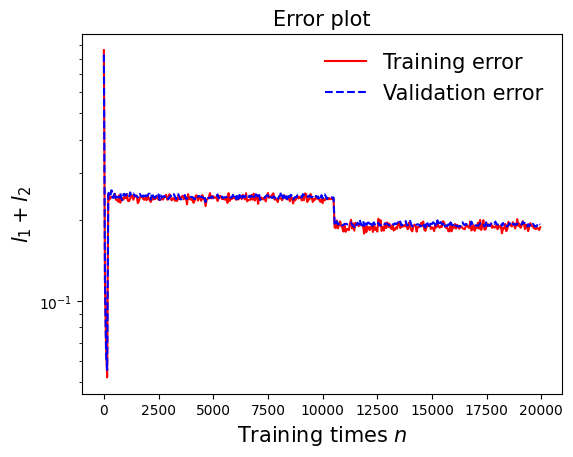

In [132]:
draw_loss(model9)

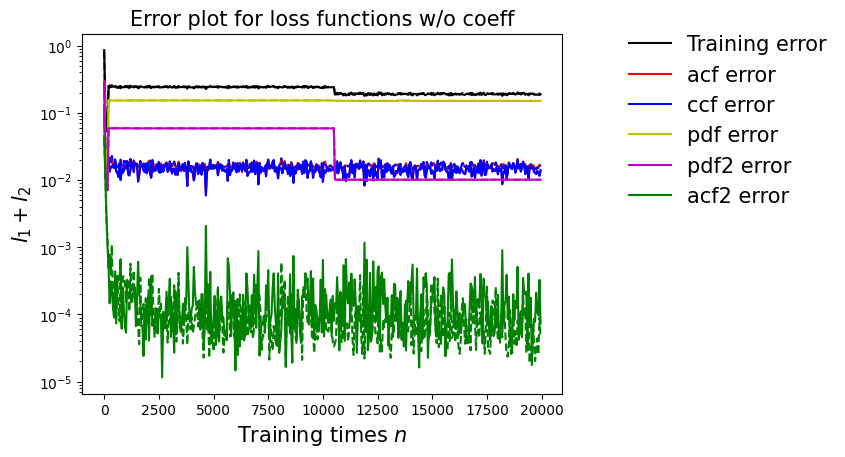

In [133]:
draw_errors(model9)

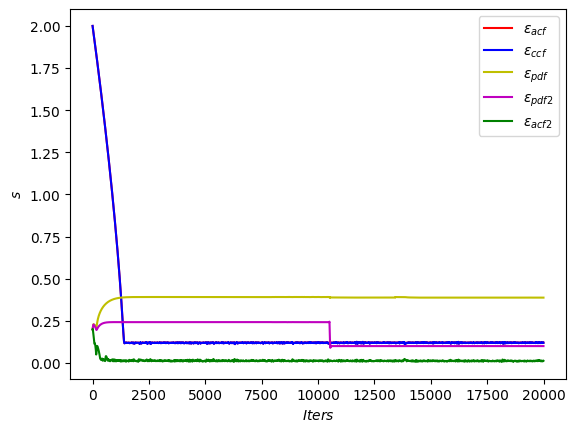

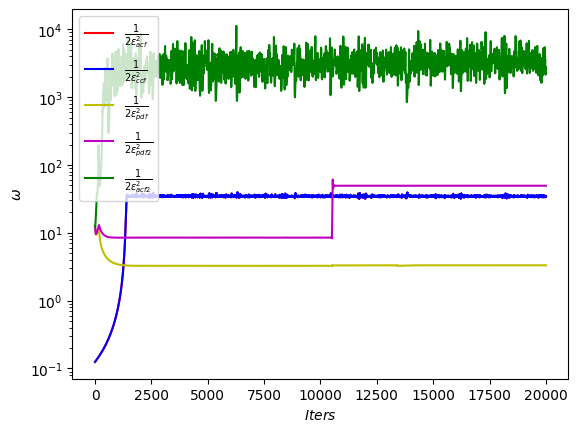

In [134]:
draw_adaptive_w(model9)
draw_epoch_w(model9)

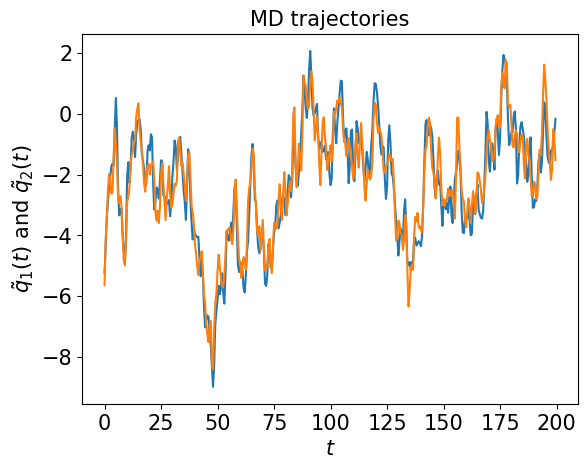

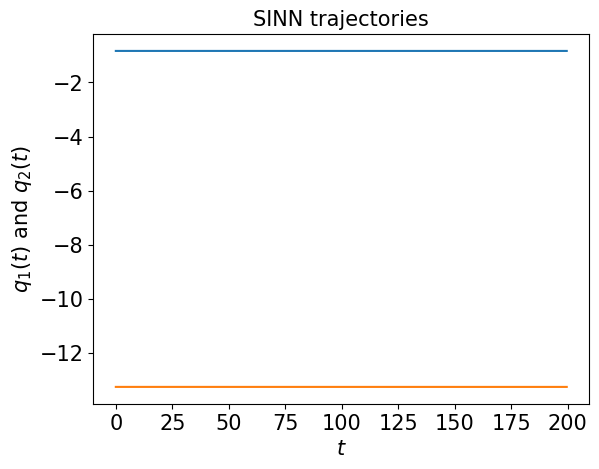

In [135]:
test1(model9)

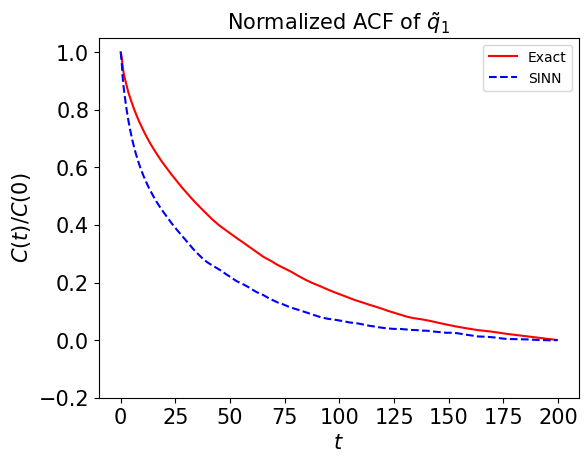

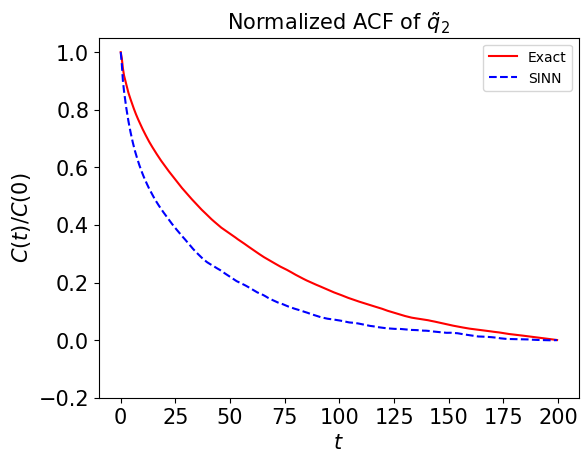

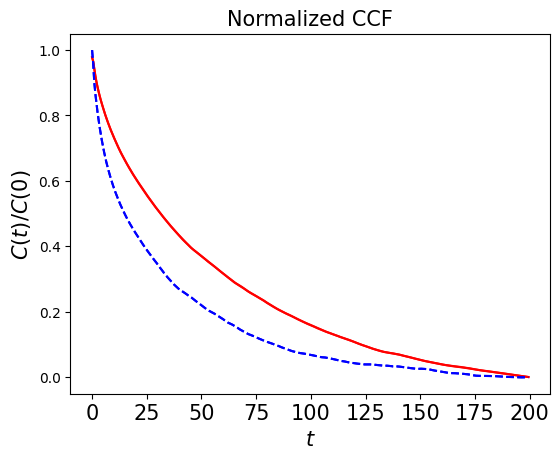

In [136]:
test2(model9)

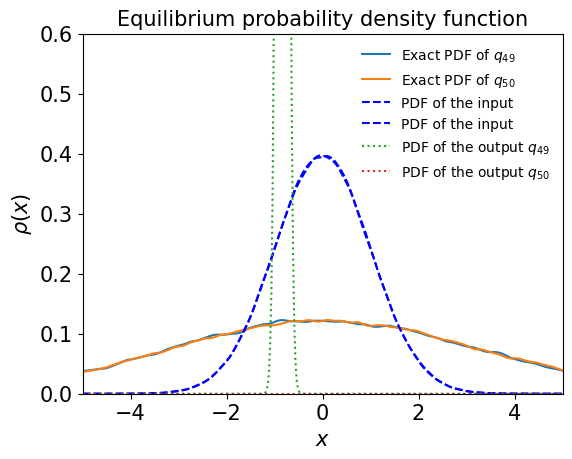

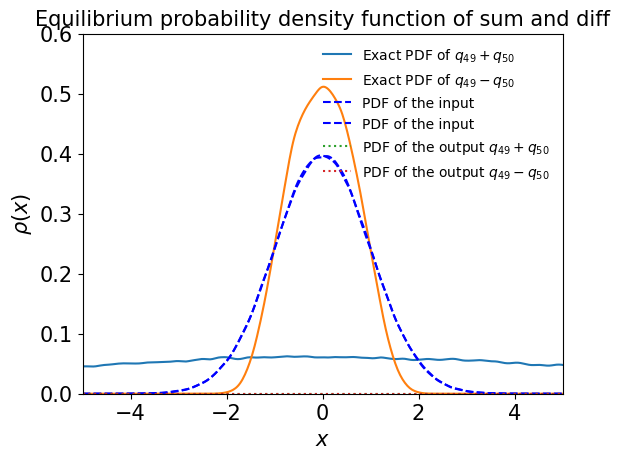

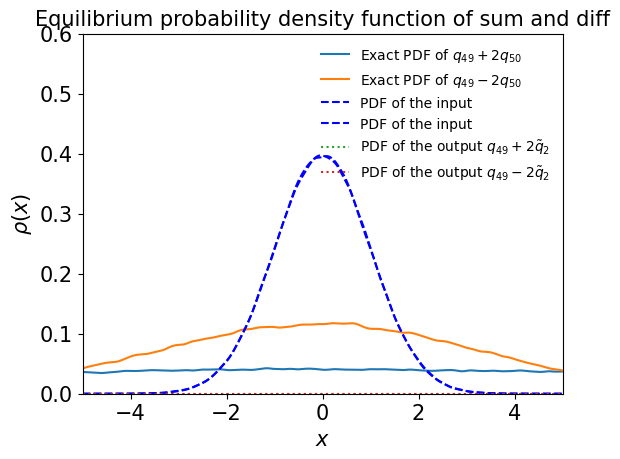

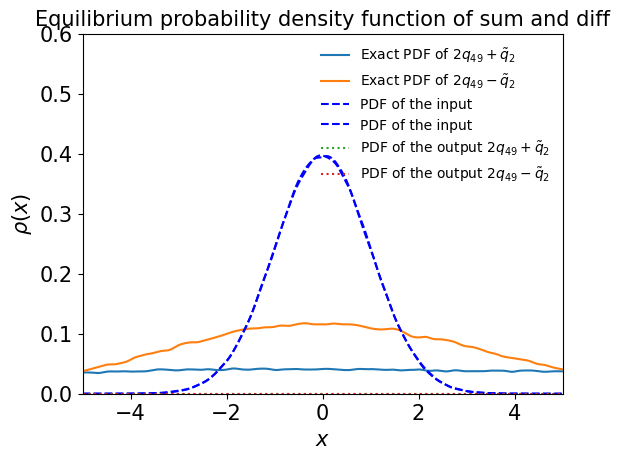

In [137]:
test3(model9)

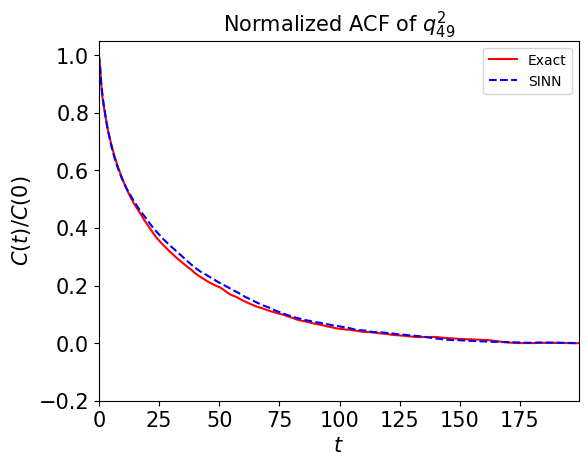

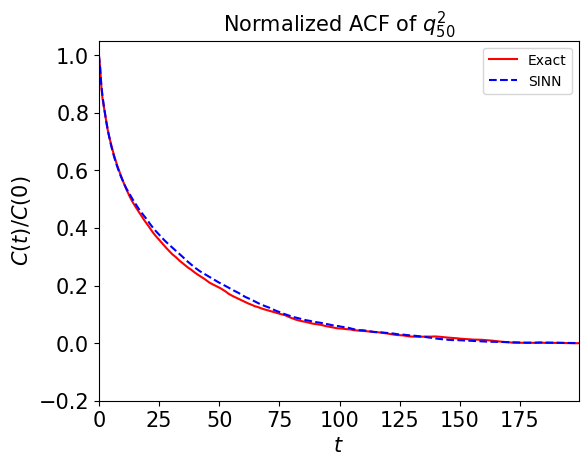

In [138]:
test4(model9)

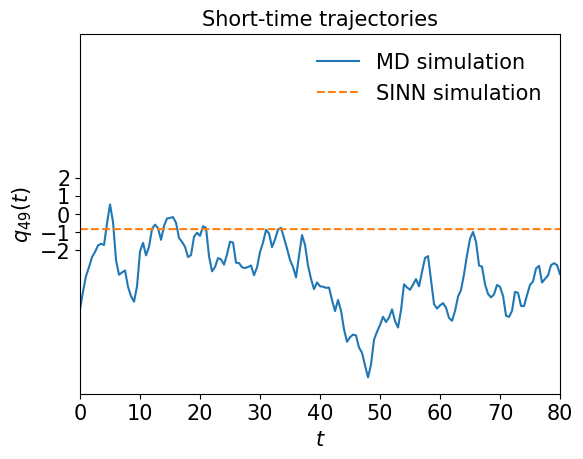

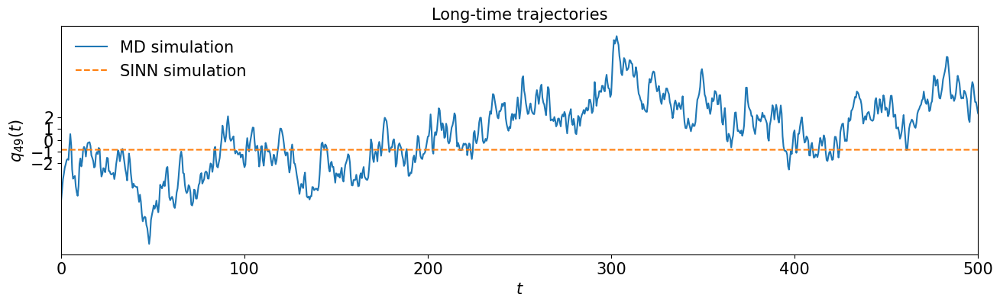

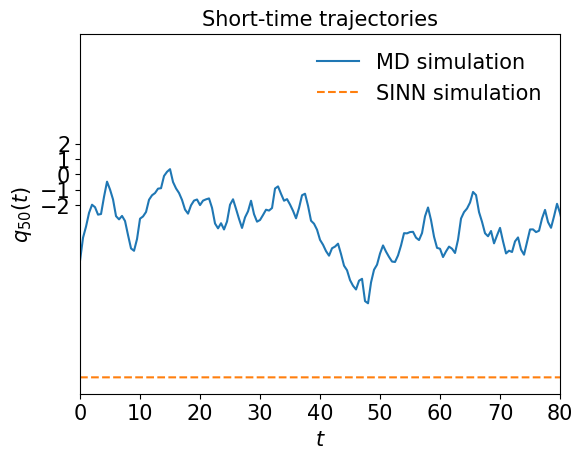

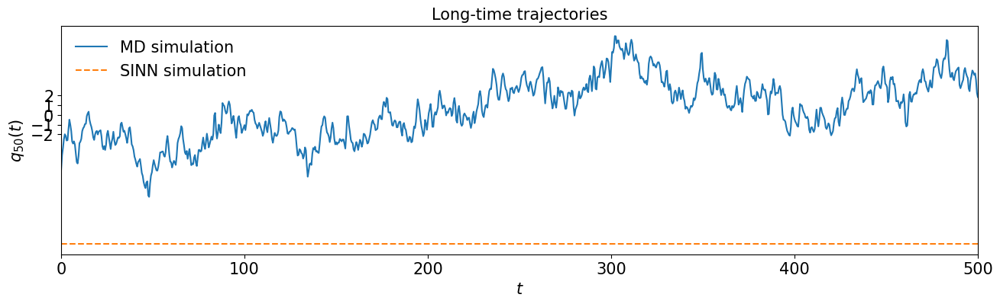

In [139]:
test5(model9)

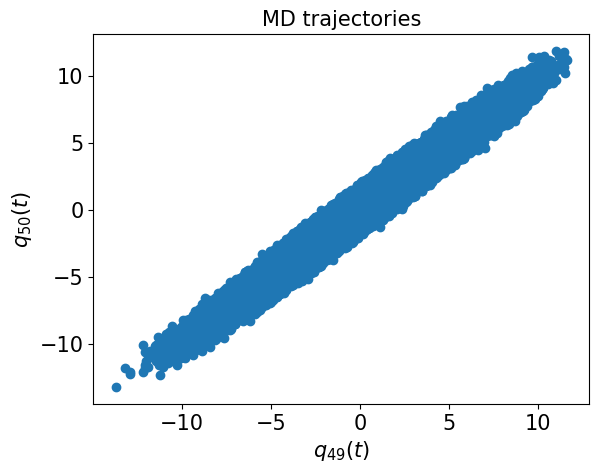

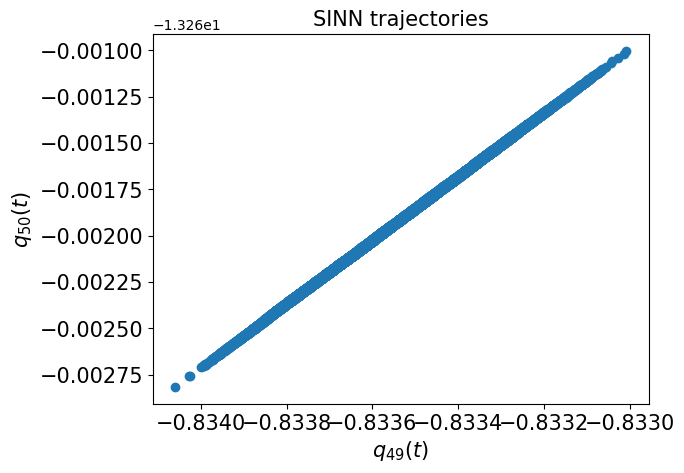

In [140]:
test6(model9)

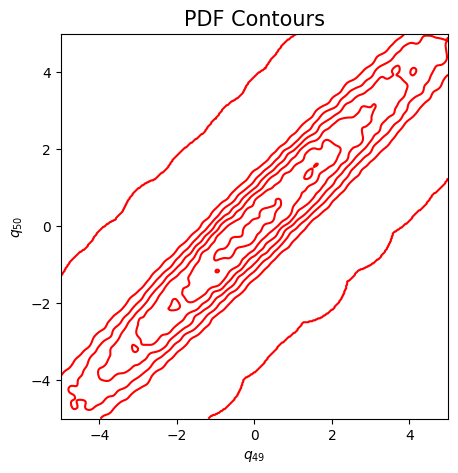

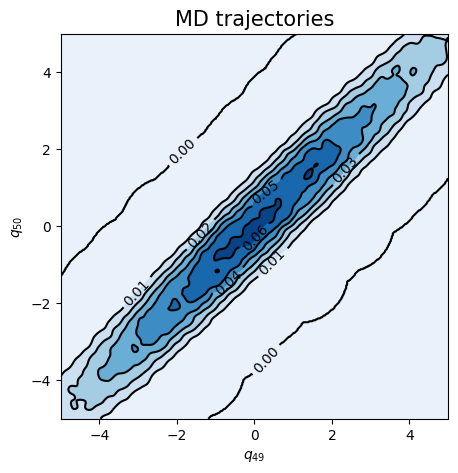

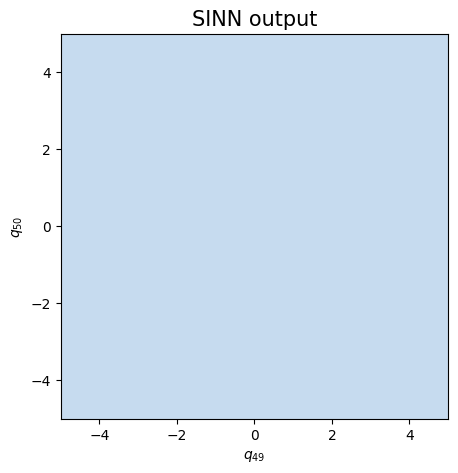

In [141]:
test7(model9)